# Author: Raquel Ana M Bush
# MTH 565 - Spotify Feature Network

initial imports, data, and integral functions:

In [2]:
import pandas as pd
import networkx as nx
import numpy as np
from matplotlib import pyplot as plt
from math import ceil
import ast
from ast import literal_eval
import community.community_louvain as community_louvain
from collections import defaultdict, Counter
import random
from itertools import combinations
from scipy.optimize import curve_fit
from sklearn.metrics import r2_score

# load data:
nodes_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/nodes.csv'
edges_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/edges.csv'
nodes_df = pd.read_csv(nodes_path)
edges_df = pd.read_csv(edges_path)

# print first 5 rows of each csv file:
print("Nodes:")
print(nodes_df.head())

print("\nEdges:")
print(edges_df.head())

# to calculate diameter:
def calculate_diameter(G):
    if nx.is_connected(G):
        return nx.diameter(G)
    else:
        # infinite diameter if graph is disconnected:
        return float('inf')

# to generate random graphs:
def generate_graphs(n, p, num_samples):
    graphs = []
    for _ in range(num_samples):
        G_random = nx.gnp_random_graph(n, p)
        graphs.append(G_random)
    return graphs

# to visualize a specific subgraph:
def visualize_genre_subgraph(subgraph, about):
    # use seed for consistency:
    pos = nx.spring_layout(subgraph, seed=42)
    plt.figure(figsize=(10, 10))
    nx.draw_networkx_nodes(subgraph, pos, node_size=20, node_color="skyblue", alpha=0.8)
    nx.draw_networkx_edges(subgraph, pos, edge_color="lightgray", alpha=0.5)
    plt.title(f"Visualization of {about} subgraph")
    plt.axis("off")
    plt.show()

Nodes:
               spotify_id                name  followers  popularity  \
0  48WvrUGoijadXXCsGocwM4           Byklubben     1738.0          24   
1  4lDiJcOJ2GLCK6p9q5BgfK            Kontra K  1999676.0          72   
2  652XIvIBNGg3C0KIGEJWit               Maxim    34596.0          36   
3  3dXC1YPbnQPsfHPVkm1ipj  Christopher Martin   249233.0          52   
4  74terC9ol9zMo8rfzhSOiG       Jakob Hellman    21193.0          39   

                                              genres  \
0                     ['nordic house', 'russelater']   
1             ['christlicher rap', 'german hip hop']   
2                                                 []   
3  ['dancehall', 'lovers rock', 'modern reggae', ...   
4  ['classic swedish pop', 'norrbotten indie', 's...   

                                          chart_hits  
0                                         ['no (3)']  
1  ['at (44)', 'de (111)', 'lu (22)', 'ch (31)', ...  
2                                         ['de (1)']  
3  

I will first do some analysis on the entire graph, although it has the bias of not including connections between non-seed artists:

In [2]:
# create the graph:
G = nx.Graph()

# add nodes:
for _, row in nodes_df.iterrows():
    G.add_node(row['spotify_id'])

# add edges:
for _, row in edges_df.iterrows():
    G.add_edge(row['id_0'], row['id_1'])

# count nodes and edges:
node_count = G.number_of_nodes()
print("Node count:", node_count)

edge_count = G.number_of_edges()
print("Edge count:", edge_count)

Node count: 156326
Edge count: 300386


In [3]:
# parse genres strings to objects or set as empty list if not a string:
nodes_df['genres'] = nodes_df['genres'].apply(lambda x: literal_eval(x) if isinstance(x, str) else [])

# add genres list to each node:
for _, row in nodes_df.iterrows():
    node_id = row['spotify_id']
    G.nodes[node_id]['genres'] = row['genres']

# add artist names to each node:
for _, row in nodes_df.iterrows():
    node_id = row['spotify_id']
    G.nodes[node_id]['name'] = row['name']

# add popularity scores to each node:
for _, row in nodes_df.iterrows():
    node_id = row['spotify_id']
    G.nodes[node_id]['popularity'] = row['popularity']

# add chart hits to each node:
for _, row in nodes_df.iterrows():
    node_id = row['spotify_id']
    G.nodes[node_id]['chart_hits'] = row['chart_hits']

# verify node data:
print("Sample node data:")
list(G.nodes(data=True))[:5]

Sample node data:


[('48WvrUGoijadXXCsGocwM4',
  {'genres': ['nordic house', 'russelater'],
   'name': 'Byklubben',
   'popularity': 24,
   'chart_hits': "['no (3)']"}),
 ('4lDiJcOJ2GLCK6p9q5BgfK',
  {'genres': ['christlicher rap', 'german hip hop'],
   'name': 'Kontra K',
   'popularity': 72,
   'chart_hits': "['at (44)', 'de (111)', 'lu (22)', 'ch (31)', 'vn (1)']"}),
 ('652XIvIBNGg3C0KIGEJWit',
  {'genres': [],
   'name': 'Maxim',
   'popularity': 36,
   'chart_hits': "['de (1)']"}),
 ('3dXC1YPbnQPsfHPVkm1ipj',
  {'genres': ['dancehall', 'lovers rock', 'modern reggae', 'reggae fusion'],
   'name': 'Christopher Martin',
   'popularity': 52,
   'chart_hits': "['at (1)', 'de (1)']"}),
 ('74terC9ol9zMo8rfzhSOiG',
  {'genres': ['classic swedish pop', 'norrbotten indie', 'swedish pop'],
   'name': 'Jakob Hellman',
   'popularity': 39,
   'chart_hits': "['se (6)']"})]

In [4]:
# calculate diameter:
spotify_diameter = calculate_diameter(G)
print("Spotify network diameter:", spotify_diameter)

# find all connected components in graph:
components = [G.subgraph(c).copy() for c in nx.connected_components(G)]
print(f"There are {len(components)} connected components.")

# largest connected component size:
largest_cc = sorted(nx.connected_components(G), reverse=True)[0]
print(f"The largest connected component contains {len(largest_cc)} artists.")

Spotify network diameter: inf
There are 4338 connected components.
The largest connected component contains 148386 artists.


So, we can see that there are a lot of disjointed components, but the largest one contains the vast majority of the artists.

Let's check the vertex degree distribution (number of feature collaborations per artist):

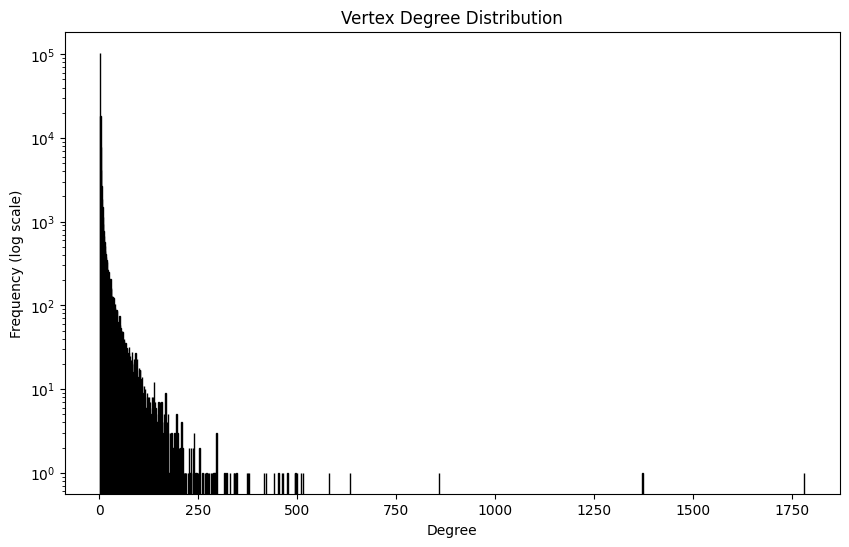

In [5]:
# graph vertex degree dist:
degrees = [degree for node, degree in G.degree()]
plt.figure(figsize=(10, 6))
plt.hist(degrees, bins=range(1, max(degrees) + 1), edgecolor='black')
plt.yscale('log')
plt.xlabel("Degree")
plt.ylabel("Frequency (log scale)")
plt.title("Vertex Degree Distribution")
plt.show()

From the above, we can see that there are many artists with very few connections, and a few that are "hubs," with many connections.
This suggests we should investigate for power law.
The following is that investigation:

In [ ]:
# funcs for power law analysis:

# define linear model for log-log data:
def linear_model(log_x, a, b):
    return a + b * log_x

# plot & fit log-log data:
def plot_and_fit_log_log(graph):
    degrees = [deg for _, deg in graph.degree()]
    degree_count = Counter(degrees)
    x = np.array(list(degree_count.keys()))
    y = np.array(list(degree_count.values()))

    # remove zeros & ensure consistent filtering:
    positive_indices = (x > 0) & (y > 0)
    x, y = x[positive_indices], y[positive_indices]
    
    # log-transform data:
    log_x = np.log(x)
    log_y = np.log(y)
    
    # scatter plot of log-log data:
    plt.scatter(log_x, log_y, label="Log-Log Data", alpha=0.7)
    plt.title("Log-Log Degree Distribution")
    plt.xlabel("Log(Degree)")
    plt.ylabel("Log(Count)")
    plt.grid(True)
    plt.legend()
    plt.show()

    # fit straight line to log-log data:
    params, _ = curve_fit(linear_model, log_x, log_y)
    intercept, slope = params

    power_law_text = f"$P(k) \sim k^{{{slope:.4f}}}$"
    plt.text(log_x.min() + 3, log_y.max() - 2, power_law_text, fontsize=12, color="black")

    r2_text = f"$R^2$ = {compute_r2(graph):.4f}"
    plt.text(log_x.min() + 1, log_y.max() - 7, r2_text, fontsize=12, color="black")

    # plot data w/ fitted line:
    plt.scatter(log_x, log_y, label="Log-Log Data", alpha=0.7)
    plt.plot(log_x, linear_model(log_x, *params), color="red", label=f"Fit: slope = {slope:.4f}")
    plt.title("Log-Log Degree Distribution with Fitted Line")
    plt.xlabel("Log(Degree)")
    plt.ylabel("Log(Count)")
    plt.legend()
    plt.grid(True)
    plt.show()

    return slope

# computes R^2 for the fit:
def compute_r2(graph):
    degrees = [deg for _, deg in graph.degree()]
    degree_count = Counter(degrees)
    x = np.array(list(degree_count.keys()))
    y = np.array(list(degree_count.values()))
    
    # remove zeros:
    positive_indices = (x > 0) & (y > 0)
    x, y = x[positive_indices], y[positive_indices]
    
    log_x = np.log(x)
    log_y = np.log(y)
    
    # fit straight line:
    params, _ = curve_fit(linear_model, log_x, log_y)
    predicted_log_y = linear_model(log_x, *params)
    
    # calculate R^2:
    r2 = r2_score(log_y, predicted_log_y)
    print(f"R^2: {r2:.4f}")
    return r2

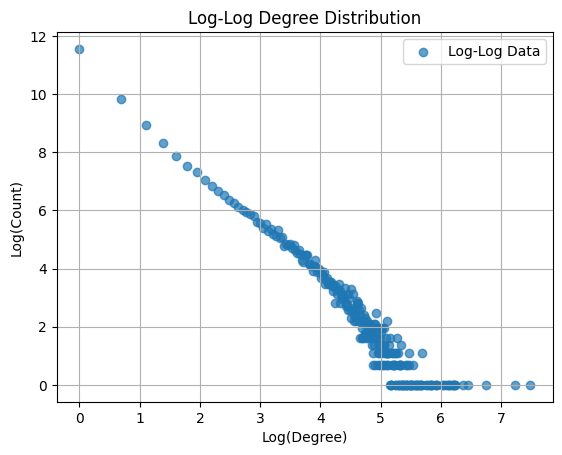

R^2: 0.9331


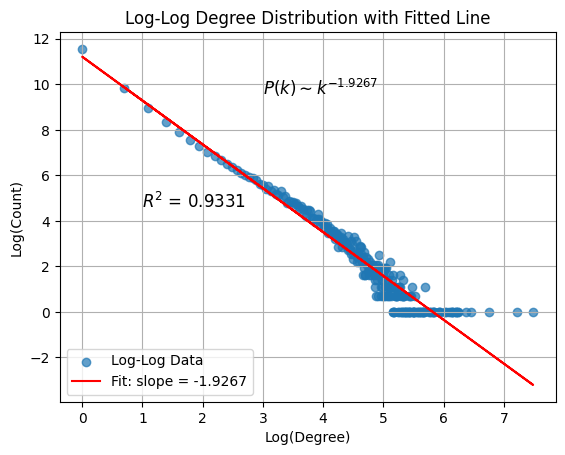

R^2: 0.9331
Slope of the log-log fit: -1.9267
R^2 value: 0.9331


In [7]:
# power law analysis:

slope = plot_and_fit_log_log(G)
r2_value = compute_r2(G)

print(f"Slope of the log-log fit: {slope:.4f}")
print(f"R^2 value: {r2_value:.4f}")

From the above plot, we can see that the largest connected component of the entire graph follows a power law strongly (R^2 = 0.93), with slope -1.93.

However, due to the biases inherent in this dataset, we will focus our analysis mostly on the top and seed artists.

Let's take a moment to look at the artists with over 200 collaborative connections in this network:

In [8]:
degree_threshold = 200

# find nodes with degree above the threshold:
outlier_nodes = [node for node, degree in G.degree() if degree > degree_threshold]
print(f"Number of artists with over 200 collaborations on Spotify: {len(outlier_nodes)}\n")


# print outlier nodes & their degrees:
for node in outlier_nodes:
    artist_name = G.nodes[node].get('name', 'Unknown')
    print(f"Artist: {artist_name}, Degree: {G.degree(node)}")


Number of artists with over 200 collaborations on Spotify: 83

Artist: Shaggy, Degree: 226
Artist: Ennio Morricone, Degree: 276
Artist: MOTi, Degree: 246
Artist: NERVO, Degree: 293
Artist: Tritonal, Degree: 243
Artist: Flo Rida, Degree: 244
Artist: Armin van Buuren, Degree: 513
Artist: Wyclef Jean, Degree: 260
Artist: DJ Gollum, Degree: 215
Artist: Dillon Francis, Degree: 216
Artist: Alkpote, Degree: 242
Artist: Busta Rhymes, Degree: 205
Artist: Eko Fresh, Degree: 231
Artist: Ty Dolla $ign, Degree: 252
Artist: John Williams, Degree: 415
Artist: Brray, Degree: 213
Artist: Kaskade, Degree: 281
Artist: Moby, Degree: 340
Artist: Yuvan Shankar Raja, Degree: 315
Artist: J Alvarez, Degree: 204
Artist: Mc Gw, Degree: 858
Artist: Dimitri Vegas & Like Mike, Degree: 226
Artist: Afrojack, Degree: 252
Artist: Sean Paul, Degree: 236
Artist: Rudimental, Degree: 202
Artist: Quimico Ultra Mega, Degree: 295
Artist: INNA, Degree: 288
Artist: Farruko, Degree: 284
Artist: Diplo, Degree: 494
Artist: Gucci M

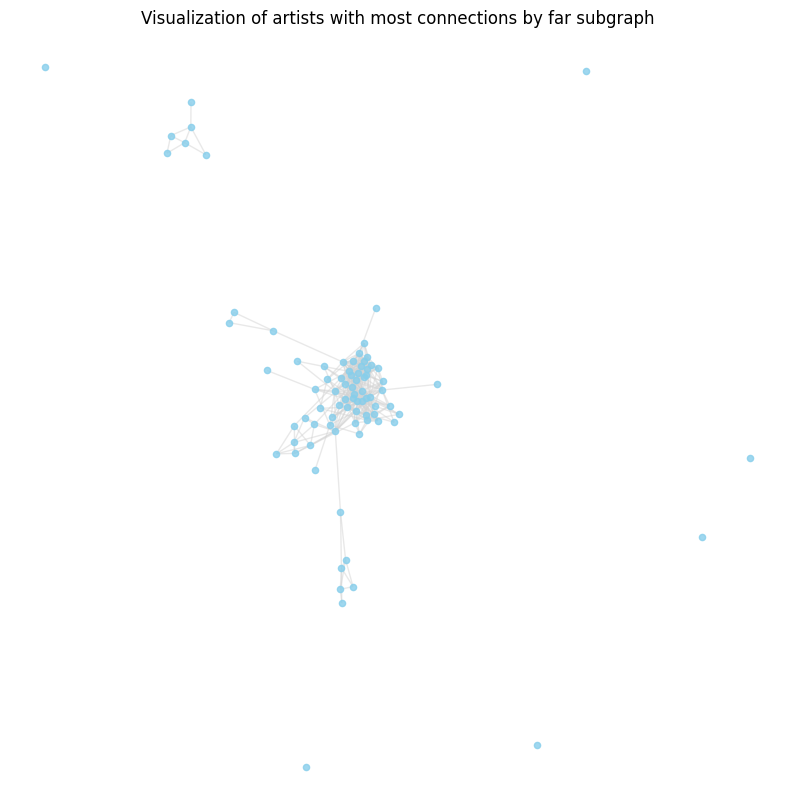

In [9]:
# visualize the subgraph with just artists who have over 200 collaborations:
high_degree_subgraph = G.subgraph(outlier_nodes).copy()
visualize_genre_subgraph(high_degree_subgraph, 'artists with most connections by far')

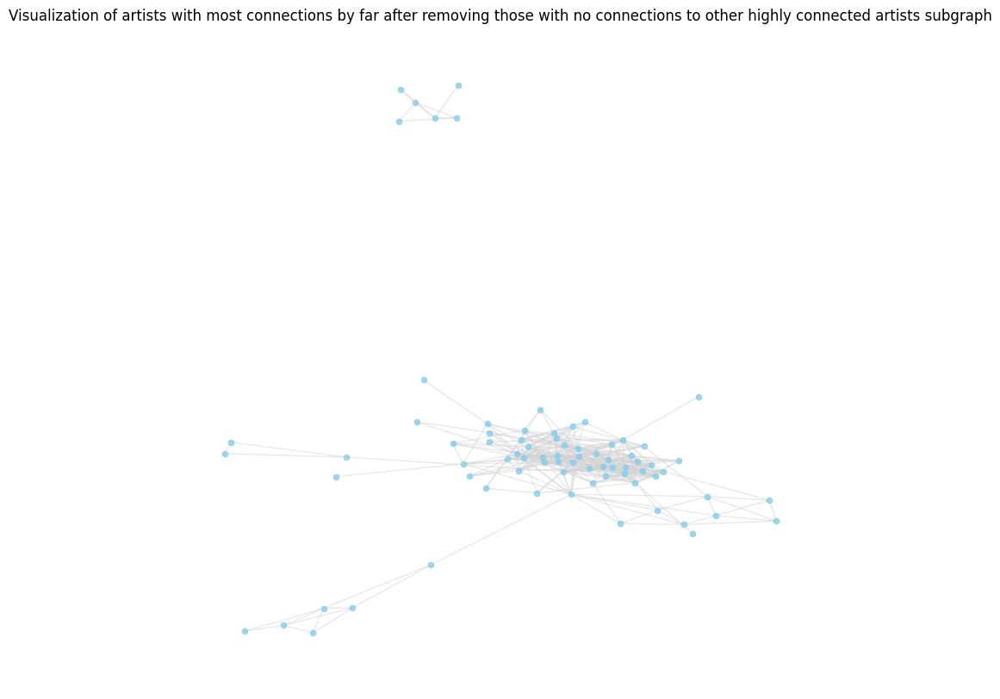

In [10]:
# cutting out those w/ 0 connections with other highly connected artists:
isolated_nodes = list(nx.isolates(high_degree_subgraph))
high_degree_subgraph.remove_nodes_from(isolated_nodes)
visualize_genre_subgraph(high_degree_subgraph, 'artists with most connections by far after removing those with no connections to other highly connected artists')

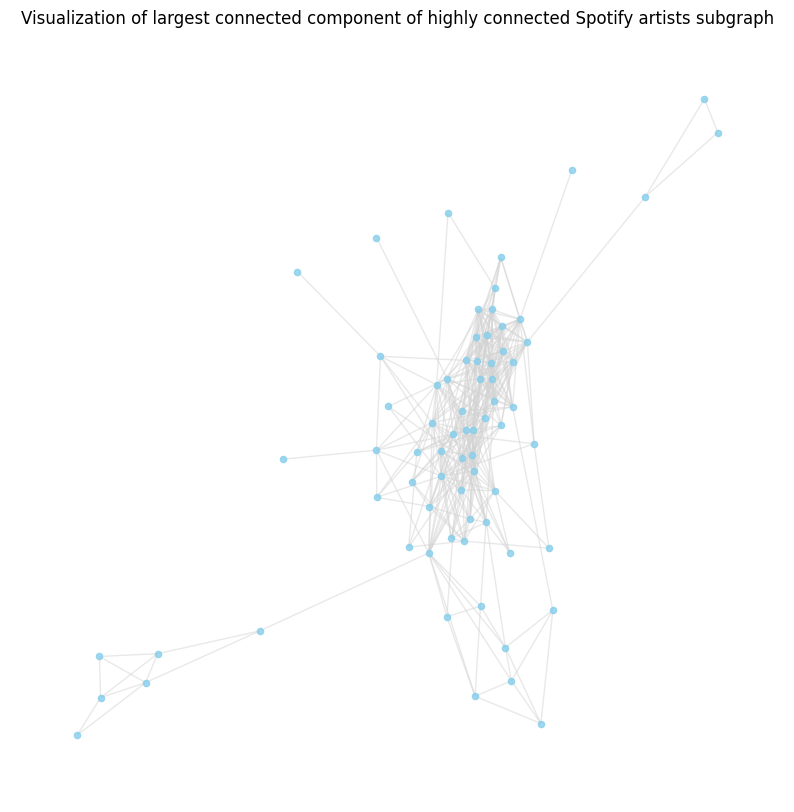

In [11]:
# look at the largest connected component of these highly connected artists:
largest_cc = max(nx.connected_components(high_degree_subgraph), key=len)
largest_cc = high_degree_subgraph.subgraph(largest_cc).copy()
visualize_genre_subgraph(largest_cc, 'largest connected component of highly connected Spotify artists')

In [12]:
# find top 15 artists by degree in the largest connected component:
top_15_artists = sorted(largest_cc.degree, key=lambda x: x[1], reverse=True)[:15]
print(f"\n15 most connected artist(s) in the highly connected artists subgraph by number of connections:")
for artist, degree in top_15_artists:
    artist_name = G.nodes[artist].get('name', 'Unknown')
    print(f"Artist: {artist_name}, Connections: {degree}")


15 most connected artist(s) in the highly connected artists subgraph by number of connections:
Artist: Steve Aoki, Connections: 23
Artist: Ty Dolla $ign, Connections: 22
Artist: Gucci Mane, Connections: 22
Artist: French Montana, Connections: 22
Artist: Chris Brown, Connections: 21
Artist: Tiësto, Connections: 21
Artist: Lil Wayne, Connections: 20
Artist: David Guetta, Connections: 20
Artist: Afrojack, Connections: 20
Artist: Snoop Dogg, Connections: 20
Artist: 2 Chainz, Connections: 19
Artist: R3HAB, Connections: 19
Artist: The Game, Connections: 18
Artist: Wiz Khalifa, Connections: 17
Artist: Dimitri Vegas & Like Mike, Connections: 17


We saw that the giant component contains the vast majority of the artists. Let's look at the next few too:

In [13]:
# find connected components & their sizes:
components = sorted([[G.subgraph(c).copy(), len(c)] for c in nx.connected_components(G)], key=lambda x: x[1], reverse=True)

# print sizes of each component:
for component in components[0:10]:
    print(component[1])

# get giant component:
largest_component = components[0][0]

148386
66
37
22
21
21
21
20
19
16


Let's look at some of the properties of this giant component: (we're still looking at both seed and non-seed artists here)

In [14]:
# approximate diameter calculation using subset of nodes (average of 10 approximations):
largest_c_diameters = []
for i in range(10):
    largest_c_diameter = nx.approximation.diameter(largest_component)
    largest_c_diameters.append(largest_c_diameter)
print(f"Diamter approximations: {largest_c_diameters}")
largest_c_avg_diameter = sum(largest_c_diameters) / len(largest_c_diameters)
print(f"Average diameter: {largest_c_avg_diameter}")

# calculate global clustering coefficient:
largest_c_clustering = nx.average_clustering(largest_component)

# calculate density:
largest_c_density = nx.density(G)

print(f"\nLargest component size: {len(largest_component)}")
print(f"Diameter of this component: {largest_c_diameter}")
print(f"Global clustering coefficient of this component: {largest_c_clustering}")
print(f"Density of this component: {largest_c_density}")

Diamter approximations: [24, 24, 24, 24, 24, 24, 24, 24, 24, 24]
Average diameter: 24.0

Largest component size: 148386
Diameter of this component: 24
Global clustering coefficient of this component: 0.08504040224253798
Density of this component: 2.458385754043054e-05


In [15]:
# find random graph stats:
n = len(largest_component)
p = largest_c_density

***Generating random graphs to see global clustering and find expected diameter:*** (fair warning this cell takes ~30 min)

In [17]:
# generate & draw 3 samples:
random_graphs = generate_graphs(n, p, 3)

# analyze each:
for random_G in random_graphs:
    # check if random graph sample is connected. if not, use largest connected component:
    if not nx.is_connected(random_G):
        largest_cc = max(nx.connected_components(random_G), key=len)
        random_G = random_G.subgraph(largest_cc).copy()

    # approximate diameter calculation using largest connected component:
    randomG_diameter = nx.approximation.diameter(random_G)
    print(f"Approximate diameter: {randomG_diameter}")
        
    # calculate global clustering coefficient:
    randomG_clustering = nx.average_clustering(random_G)
    print(f"Global clustering: {randomG_clustering}")

    print('')

Approximate diameter: 18
Global clustering: 1.5480985884174727e-05

Approximate diameter: 21
Global clustering: 1.1800884372158242e-05

Approximate diameter: 19
Global clustering: 8.319132959027444e-06



***Generating regular lattices to see diameter and find expected global clustering:***

In [39]:
# decide k:
k = (2 * edge_count) / len(largest_component)
print(k)
k = int(k)
print(f"k = {k}")

4.048710794818918
k = 4


In [40]:
# generate regular lattice:
reg_lat = nx.watts_strogatz_graph(n, k, 0)

# diameter calculation:
reg_lat_diameter = ceil(n / k)
print(f"Regular lattice diameter: {reg_lat_diameter}")
        
# calculate global clustering coefficient:
reg_lat_clustering = nx.average_clustering(reg_lat)
print(f"Global clustering: {reg_lat_clustering}")

Regular lattice diameter: 37097
Global clustering: 0.5


***Analyzing subgraphs for specific genres:***

In [41]:
# count genre occurrences:
genre_counts = nodes_df['genres'].explode().value_counts()

# display the most common genres to help decide which ones to pick (top 15)
genre_counts.head(15)

genres
pop               544
electro house     513
dance pop         506
edm               453
rap               448
german hip hop    434
uk pop            406
pop rap           395
french hip hop    384
hip hop           381
pop dance         379
pop edm           368
tropical house    356
filmi             353
funk carioca      351
Name: count, dtype: int64

In [42]:
# verify that genres are parsed correctly:
print(nodes_df[['spotify_id', 'genres']].head())

               spotify_id                                             genres
0  48WvrUGoijadXXCsGocwM4                         [nordic house, russelater]
1  4lDiJcOJ2GLCK6p9q5BgfK                 [christlicher rap, german hip hop]
2  652XIvIBNGg3C0KIGEJWit                                                 []
3  3dXC1YPbnQPsfHPVkm1ipj  [dancehall, lovers rock, modern reggae, reggae...
4  74terC9ol9zMo8rfzhSOiG  [classic swedish pop, norrbotten indie, swedis...


In [43]:
# count artists with no associated genres:
artists_with_no_genres = nodes_df[nodes_df['genres'].apply(lambda x: len(x) == 0)].shape[0]
print(f"Number of artists with no genres: {artists_with_no_genres}")

Number of artists with no genres: 102133


german hip hop - Total nodes: 434, Isolated nodes: 20, Isolated percentage: 4.61%

20 most connected artist(s) in german hip hop by number of connections:
Artist: Olexesh, Connections: 55
Artist: Capital Bra, Connections: 55
Artist: Manuellsen, Connections: 53
Artist: Haftbefehl, Connections: 49
Artist: Nimo, Connections: 47
Artist: Celo & Abdi, Connections: 45
Artist: Farid Bang, Connections: 44
Artist: Summer Cem, Connections: 42
Artist: Sido, Connections: 42
Artist: RAF Camora, Connections: 41
Artist: KC Rebell, Connections: 39
Artist: Kool Savas, Connections: 38
Artist: XATAR, Connections: 37
Artist: Azzi Memo, Connections: 36
Artist: GRiNGO, Connections: 35
Artist: Bonez MC, Connections: 34
Artist: Bausa, Connections: 34
Artist: Azad, Connections: 34
Artist: Massiv, Connections: 34
Artist: Ufo361, Connections: 33

Diameter for german hip hop: 9
Global clustering for german hip hop: 0.2591539253881741
Density for german hip hop: 0.022935178007036795

Comparable random graph diamete

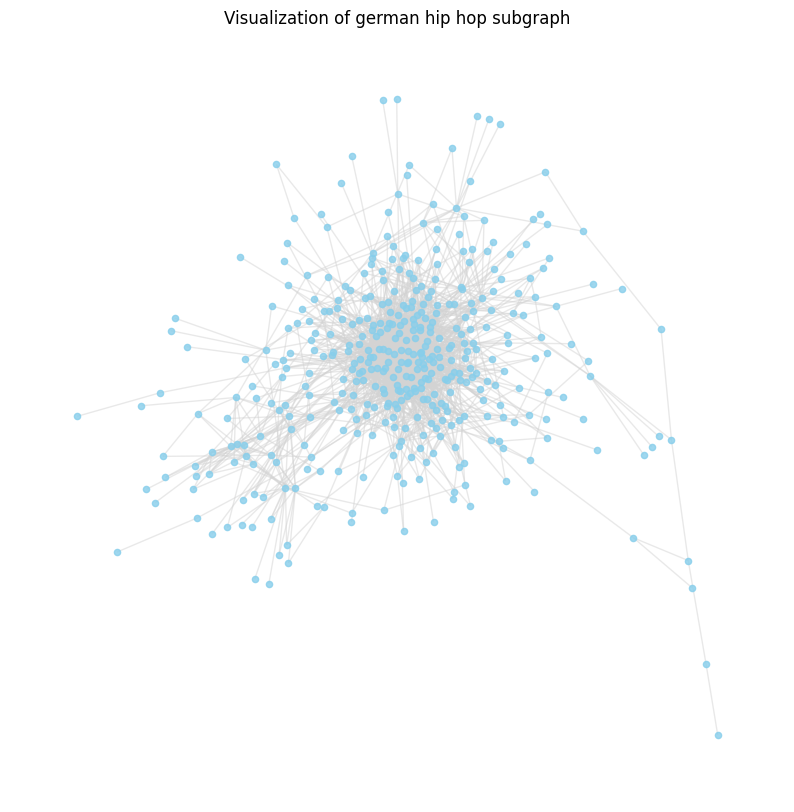

dance pop - Total nodes: 505, Isolated nodes: 61, Isolated percentage: 12.08%

20 most connected artist(s) in dance pop by number of connections:
Artist: R3HAB, Connections: 90
Artist: David Guetta, Connections: 87
Artist: Tiësto, Connections: 63
Artist: Pitbull, Connections: 58
Artist: Ty Dolla $ign, Connections: 56
Artist: Steve Aoki, Connections: 53
Artist: Nicki Minaj, Connections: 49
Artist: Chris Brown, Connections: 47
Artist: Sean Paul, Connections: 46
Artist: Afrojack, Connections: 46
Artist: MOTi, Connections: 45
Artist: Clean Bandit, Connections: 43
Artist: Major Lazer, Connections: 42
Artist: Ludacris, Connections: 41
Artist: Cheat Codes, Connections: 41
Artist: Flo Rida, Connections: 40
Artist: Dimitri Vegas & Like Mike, Connections: 40
Artist: Don Diablo, Connections: 39
Artist: Benny Benassi, Connections: 37
Artist: Missy Elliott, Connections: 37

Diameter for dance pop: 8
Global clustering for dance pop: 0.18297026753481982
Density for dance pop: 0.026496168979084696

Co

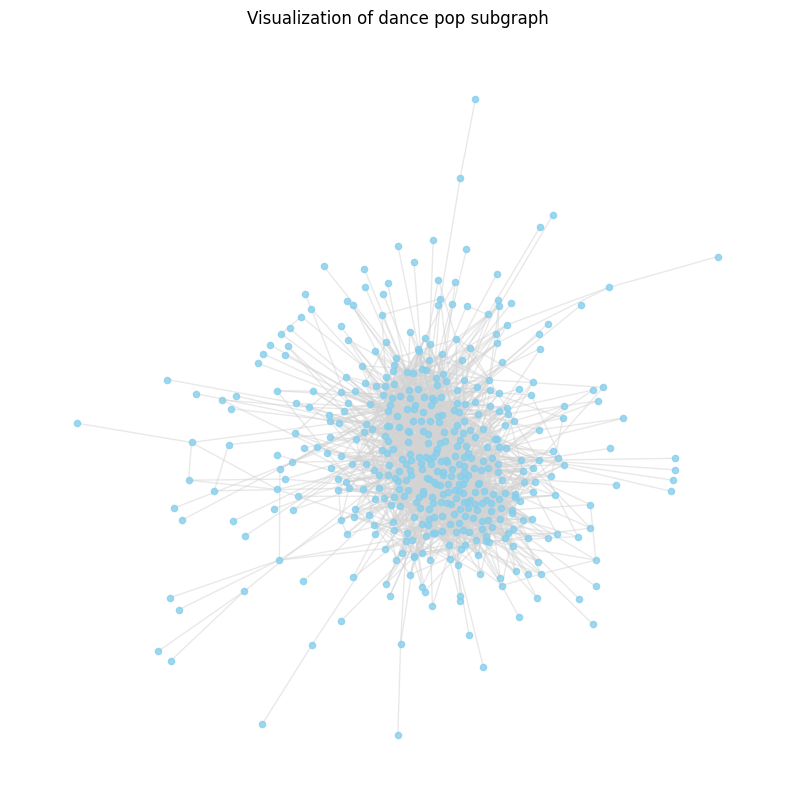

pop - Total nodes: 544, Isolated nodes: 79, Isolated percentage: 14.52%

20 most connected artist(s) in pop by number of connections:
Artist: R3HAB, Connections: 90
Artist: Ty Dolla $ign, Connections: 66
Artist: David Guetta, Connections: 62
Artist: Tiësto, Connections: 57
Artist: Nicki Minaj, Connections: 51
Artist: Chris Brown, Connections: 41
Artist: Khalid, Connections: 41
Artist: Calvin Harris, Connections: 41
Artist: Justin Bieber, Connections: 40
Artist: Cheat Codes, Connections: 39
Artist: Major Lazer, Connections: 38
Artist: Charli XCX, Connections: 37
Artist: Diplo, Connections: 37
Artist: G-Eazy, Connections: 35
Artist: Joel Corry, Connections: 35
Artist: Kygo, Connections: 34
Artist: Clean Bandit, Connections: 34
Artist: Sam Feldt, Connections: 34
Artist: DJ Khaled, Connections: 33
Artist: Ed Sheeran, Connections: 33

Diameter for pop: 7
Global clustering for pop: 0.15543253625460068
Density for pop: 0.02136358401474145

Comparable random graph diameter: 5
Comparable random

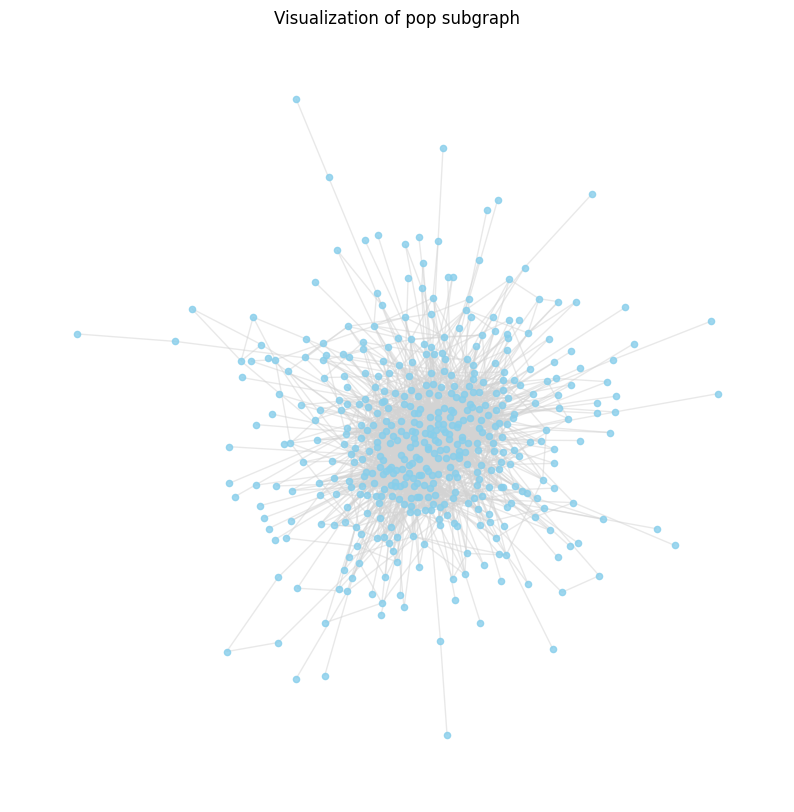

uk pop - Total nodes: 406, Isolated nodes: 171, Isolated percentage: 42.12%

20 most connected artist(s) in uk pop by number of connections:
Artist: Jonas Blue, Connections: 31
Artist: Sam Feldt, Connections: 30
Artist: Cheat Codes, Connections: 27
Artist: Rudimental, Connections: 25
Artist: Martin Jensen, Connections: 23
Artist: Clean Bandit, Connections: 20
Artist: Sigala, Connections: 19
Artist: M-22, Connections: 19
Artist: Matoma, Connections: 18
Artist: NOTD, Connections: 18
Artist: Ed Sheeran, Connections: 17
Artist: MK, Connections: 17
Artist: Jax Jones, Connections: 16
Artist: Demi Lovato, Connections: 16
Artist: Anne-Marie, Connections: 16
Artist: Becky Hill, Connections: 15
Artist: MNEK, Connections: 15
Artist: Charli XCX, Connections: 15
Artist: Tinie Tempah, Connections: 15
Artist: Rita Ora, Connections: 15

Diameter for uk pop: 9
Global clustering for uk pop: 0.08903376160316774
Density for uk pop: 0.02274672862908157

Comparable random graph diameter: 7
Comparable random

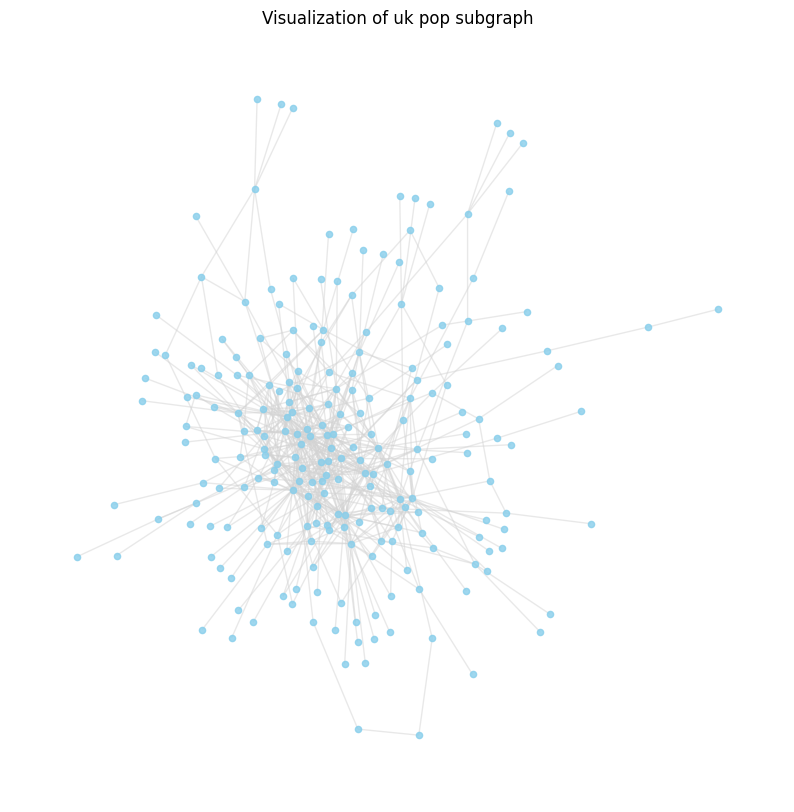

hip hop - Total nodes: 381, Isolated nodes: 52, Isolated percentage: 13.65%

20 most connected artist(s) in hip hop by number of connections:
Artist: Snoop Dogg, Connections: 89
Artist: The Game, Connections: 83
Artist: Gucci Mane, Connections: 80
Artist: Lil Wayne, Connections: 78
Artist: T.I., Connections: 74
Artist: Ty Dolla $ign, Connections: 74
Artist: 2 Chainz, Connections: 72
Artist: DJ Drama, Connections: 71
Artist: French Montana, Connections: 69
Artist: Rick Ross, Connections: 67
Artist: Busta Rhymes, Connections: 66
Artist: DJ Khaled, Connections: 61
Artist: Wiz Khalifa, Connections: 57
Artist: Jeezy, Connections: 55
Artist: Young Thug, Connections: 55
Artist: Meek Mill, Connections: 54
Artist: Big Sean, Connections: 53
Artist: Nas, Connections: 53
Artist: Ludacris, Connections: 52
Artist: JAY-Z, Connections: 51

Diameter for hip hop: 7
Global clustering for hip hop: 0.3213617764789591
Density for hip hop: 0.044483217950882725

Comparable random graph diameter: 4
Comparable 

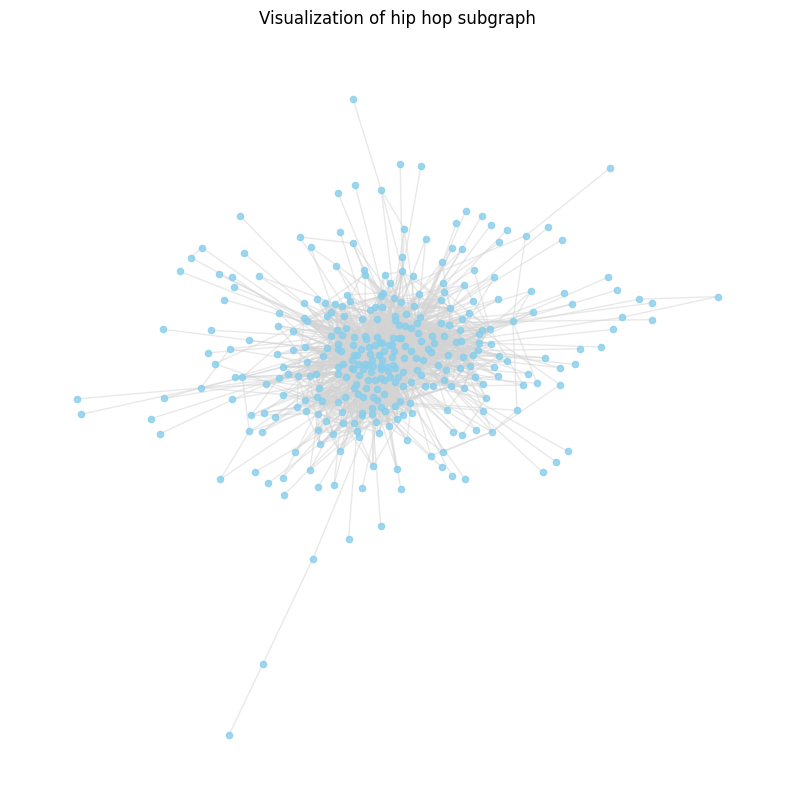

rap - Total nodes: 448, Isolated nodes: 28, Isolated percentage: 6.25%

20 most connected artist(s) in rap by number of connections:
Artist: Gucci Mane, Connections: 130
Artist: Lil Wayne, Connections: 101
Artist: Future, Connections: 100
Artist: French Montana, Connections: 100
Artist: 2 Chainz, Connections: 99
Artist: Young Thug, Connections: 94
Artist: The Game, Connections: 93
Artist: T.I., Connections: 91
Artist: Snoop Dogg, Connections: 89
Artist: DJ Khaled, Connections: 88
Artist: DJ Drama, Connections: 85
Artist: Rick Ross, Connections: 85
Artist: Wiz Khalifa, Connections: 82
Artist: Yo Gotti, Connections: 80
Artist: Juicy J, Connections: 79
Artist: Meek Mill, Connections: 77
Artist: Lil Durk, Connections: 76
Artist: Jeezy, Connections: 76
Artist: YG, Connections: 72
Artist: Big Sean, Connections: 69

Diameter for rap: 6
Global clustering for rap: 0.34055141677639184
Density for rap: 0.04635906659287954

Comparable random graph diameter: 4
Comparable random graph global cluster

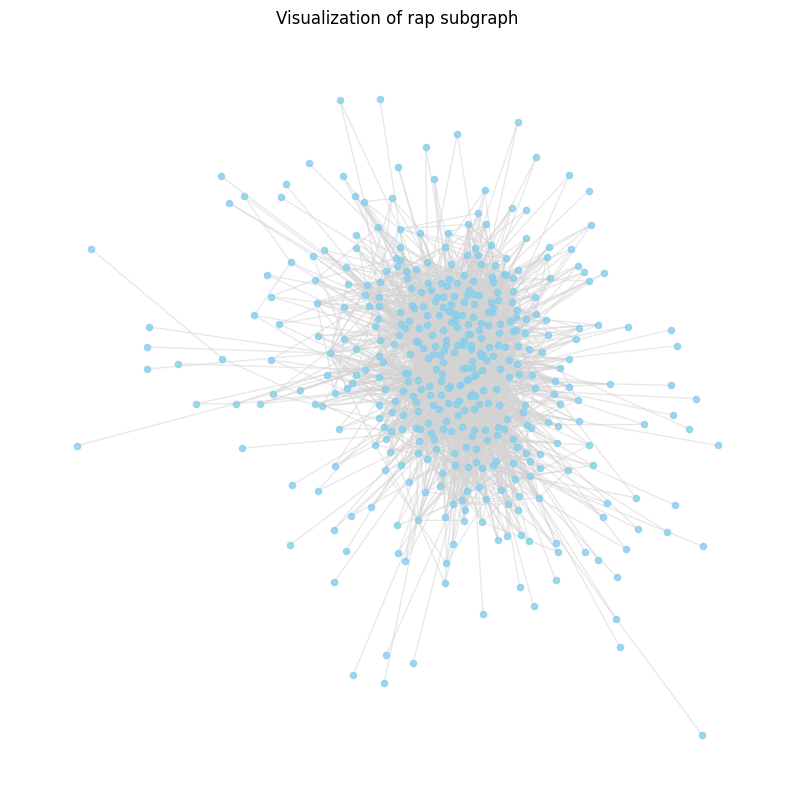

electro house - Total nodes: 512, Isolated nodes: 48, Isolated percentage: 9.38%

20 most connected artist(s) in electro house by number of connections:
Artist: Steve Aoki, Connections: 102
Artist: Hardwell, Connections: 63
Artist: Diplo, Connections: 59
Artist: R3HAB, Connections: 55
Artist: Dimitri Vegas & Like Mike, Connections: 54
Artist: Afrojack, Connections: 53
Artist: Martin Garrix, Connections: 50
Artist: Nicky Romero, Connections: 49
Artist: Galantis, Connections: 49
Artist: Dillon Francis, Connections: 48
Artist: NERVO, Connections: 45
Artist: MOTi, Connections: 43
Artist: Zeds Dead, Connections: 39
Artist: Tchami, Connections: 39
Artist: Kaskade, Connections: 38
Artist: Good Times Ahead, Connections: 35
Artist: Benny Benassi, Connections: 34
Artist: Cash Cash, Connections: 34
Artist: Timmy Trumpet, Connections: 34
Artist: Quintino, Connections: 34

Diameter for electro house: 7
Global clustering for electro house: 0.1782269055821512
Density for electro house: 0.019997020927

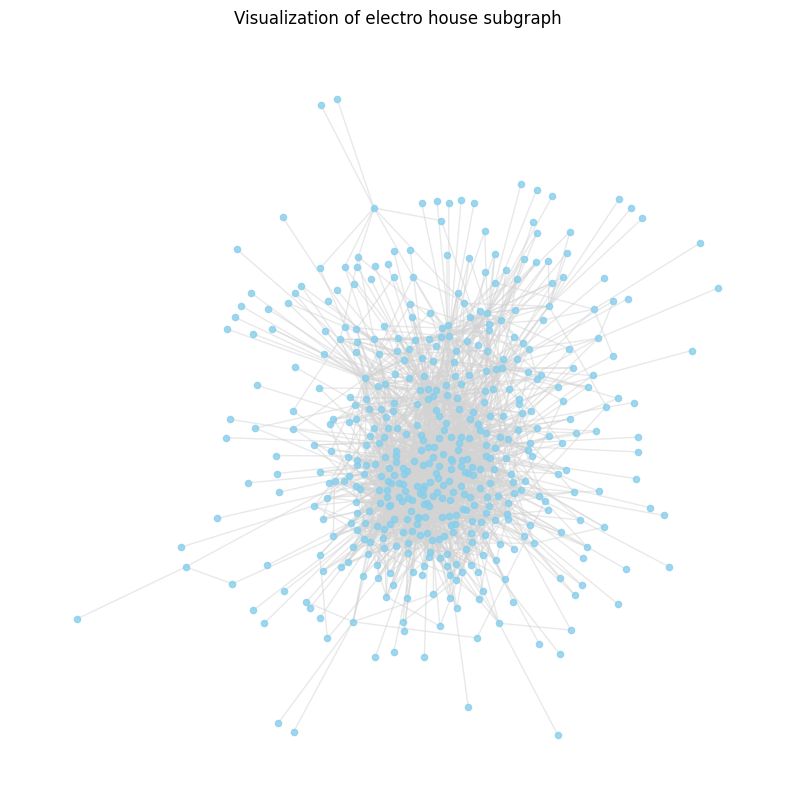

r&b - Total nodes: 299, Isolated nodes: 77, Isolated percentage: 25.75%

20 most connected artist(s) in r&b by number of connections:
Artist: Wale, Connections: 42
Artist: Ty Dolla $ign, Connections: 41
Artist: Chris Brown, Connections: 41
Artist: Fabolous, Connections: 33
Artist: Diddy, Connections: 27
Artist: Mariah Carey, Connections: 27
Artist: Missy Elliott, Connections: 26
Artist: Eric Bellinger, Connections: 25
Artist: 6LACK, Connections: 23
Artist: T-Pain, Connections: 22
Artist: Lucky Daye, Connections: 20
Artist: Mary J. Blige, Connections: 20
Artist: Trey Songz, Connections: 20
Artist: Kehlani, Connections: 19
Artist: Big Sean, Connections: 19
Artist: Tory Lanez, Connections: 19
Artist: Jhené Aiko, Connections: 18
Artist: K CAMP, Connections: 17
Artist: Jeremih, Connections: 17
Artist: Jacquees, Connections: 17

Diameter for r&b: 6
Global clustering for r&b: 0.2017240581787275
Density for r&b: 0.02885443583118002

Comparable random graph diameter: 6
Comparable random graph g

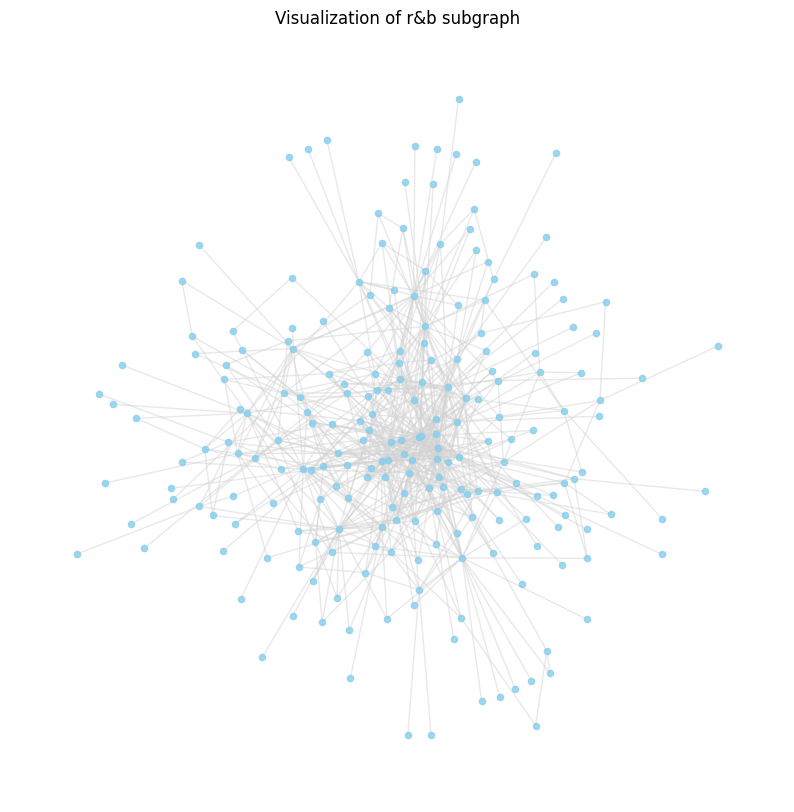

tropical house - Total nodes: 355, Isolated nodes: 29, Isolated percentage: 8.17%

20 most connected artist(s) in tropical house by number of connections:
Artist: Tiësto, Connections: 56
Artist: R3HAB, Connections: 47
Artist: MOTi, Connections: 43
Artist: Sam Feldt, Connections: 40
Artist: Robin Schulz, Connections: 39
Artist: Steve Aoki, Connections: 38
Artist: Clean Bandit, Connections: 36
Artist: Alle Farben, Connections: 34
Artist: Diplo, Connections: 33
Artist: Dimitri Vegas & Like Mike, Connections: 33
Artist: Rudimental, Connections: 32
Artist: Afrojack, Connections: 32
Artist: Lost Frequencies, Connections: 31
Artist: HUGEL, Connections: 31
Artist: Nicky Romero, Connections: 30
Artist: Cheat Codes, Connections: 30
Artist: Galantis, Connections: 30
Artist: Becky Hill, Connections: 28
Artist: Jonas Blue, Connections: 27
Artist: Joel Corry, Connections: 27

Diameter for tropical house: 8
Global clustering for tropical house: 0.14357584845929872
Density for tropical house: 0.030825

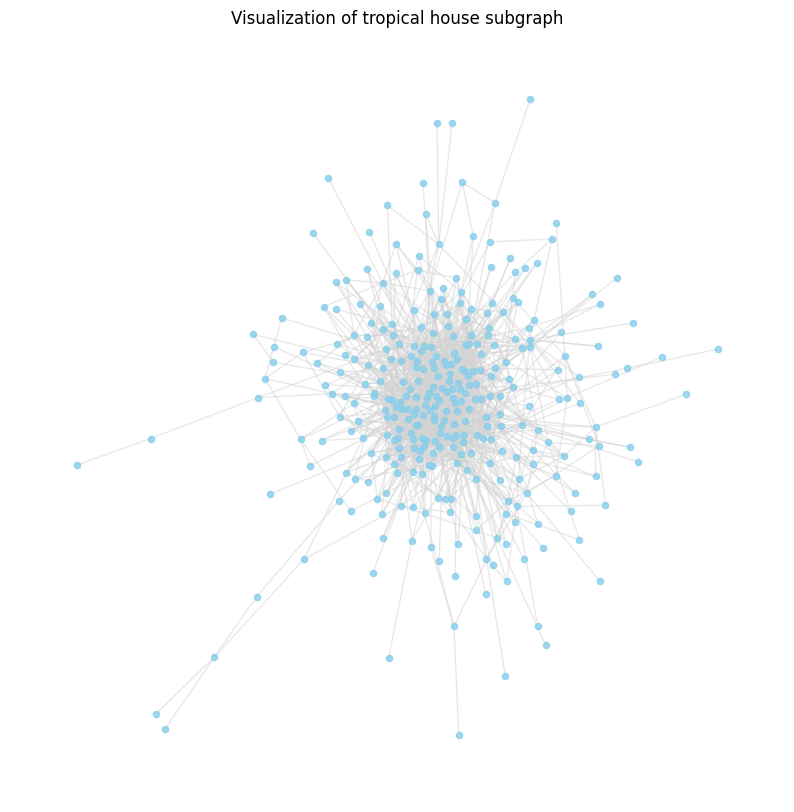

french hip hop - Total nodes: 382, Isolated nodes: 31, Isolated percentage: 8.12%

20 most connected artist(s) in french hip hop by number of connections:
Artist: Le classico organisé, Connections: 75
Artist: Leto, Connections: 65
Artist: Alonzo, Connections: 65
Artist: Alkpote, Connections: 59
Artist: DJ Kayz, Connections: 50
Artist: Koba LaD, Connections: 50
Artist: Naps, Connections: 47
Artist: Rim'K, Connections: 47
Artist: Sadek, Connections: 46
Artist: DA Uzi, Connections: 46
Artist: Lacrim, Connections: 45
Artist: Naza, Connections: 45
Artist: Sofiane, Connections: 44
Artist: Soprano, Connections: 41
Artist: Ninho, Connections: 41
Artist: SCH, Connections: 39
Artist: PLK, Connections: 36
Artist: Niska, Connections: 36
Artist: Hornet La Frappe, Connections: 34
Artist: RK, Connections: 34

Diameter for french hip hop: 7
Global clustering for french hip hop: 0.23540070642300626
Density for french hip hop: 0.03333277806466659

Comparable random graph diameter: 5
Comparable random gr

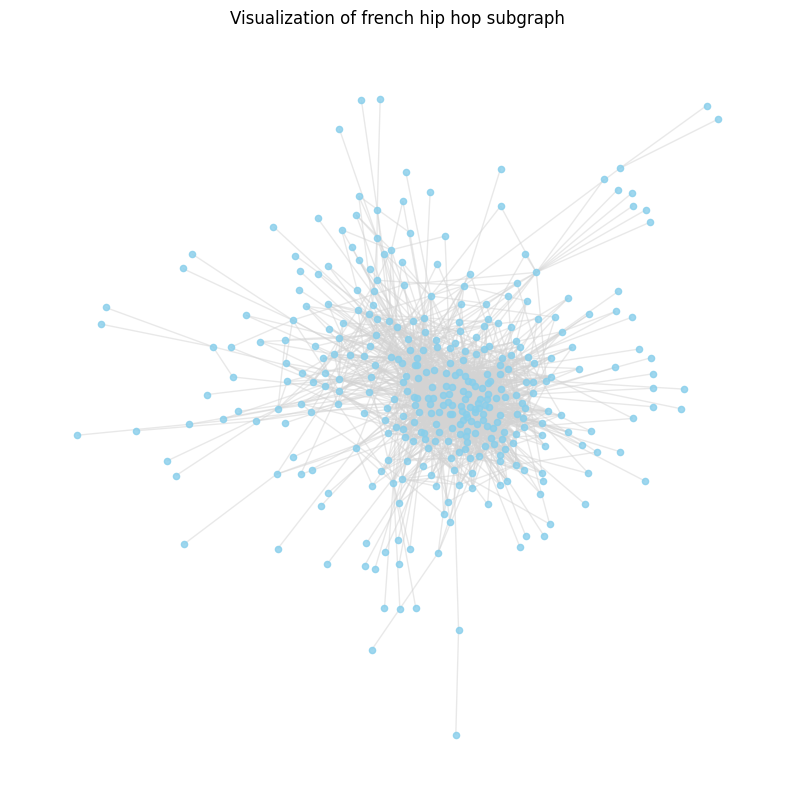

edm - Total nodes: 452, Isolated nodes: 16, Isolated percentage: 3.54%

20 most connected artist(s) in edm by number of connections:
Artist: Tiësto, Connections: 93
Artist: Steve Aoki, Connections: 89
Artist: R3HAB, Connections: 71
Artist: David Guetta, Connections: 68
Artist: Armin van Buuren, Connections: 65
Artist: Diplo, Connections: 58
Artist: MOTi, Connections: 57
Artist: Dimitri Vegas & Like Mike, Connections: 57
Artist: Afrojack, Connections: 53
Artist: Hardwell, Connections: 53
Artist: ILLENIUM, Connections: 52
Artist: Dillon Francis, Connections: 51
Artist: Nicky Romero, Connections: 47
Artist: Galantis, Connections: 47
Artist: Martin Garrix, Connections: 45
Artist: The Chainsmokers, Connections: 45
Artist: Sam Feldt, Connections: 43
Artist: Tritonal, Connections: 42
Artist: Kaskade, Connections: 41
Artist: NERVO, Connections: 40

Diameter for edm: 7
Global clustering for edm: 0.21343003396405225
Density for edm: 0.02953706632922071

Comparable random graph diameter: 4
Compar

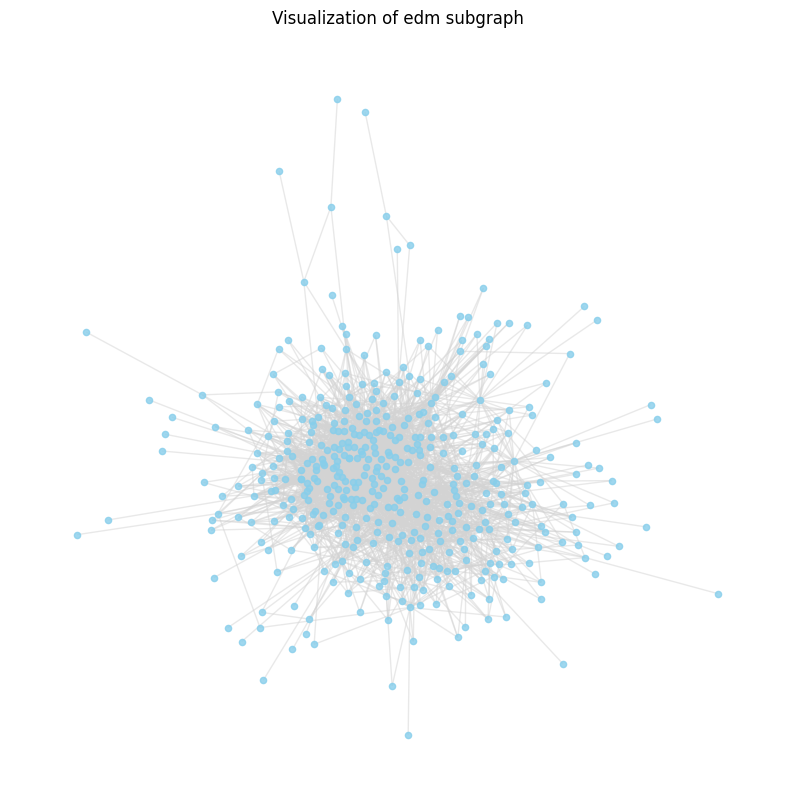

pop dance - Total nodes: 378, Isolated nodes: 11, Isolated percentage: 2.91%

20 most connected artist(s) in pop dance by number of connections:
Artist: Tiësto, Connections: 88
Artist: David Guetta, Connections: 72
Artist: R3HAB, Connections: 71
Artist: Steve Aoki, Connections: 70
Artist: Armin van Buuren, Connections: 62
Artist: MOTi, Connections: 58
Artist: Dimitri Vegas & Like Mike, Connections: 57
Artist: Diplo, Connections: 51
Artist: Afrojack, Connections: 50
Artist: Hardwell, Connections: 48
Artist: Galantis, Connections: 47
Artist: Nicky Romero, Connections: 46
Artist: Sam Feldt, Connections: 44
Artist: Robin Schulz, Connections: 41
Artist: Becky Hill, Connections: 39
Artist: Clean Bandit, Connections: 39
Artist: Joel Corry, Connections: 39
Artist: NERVO, Connections: 37
Artist: Martin Garrix, Connections: 37
Artist: Dillon Francis, Connections: 37

Diameter for pop dance: 7
Global clustering for pop dance: 0.21238263110721203
Density for pop dance: 0.03837048286952249

Compara

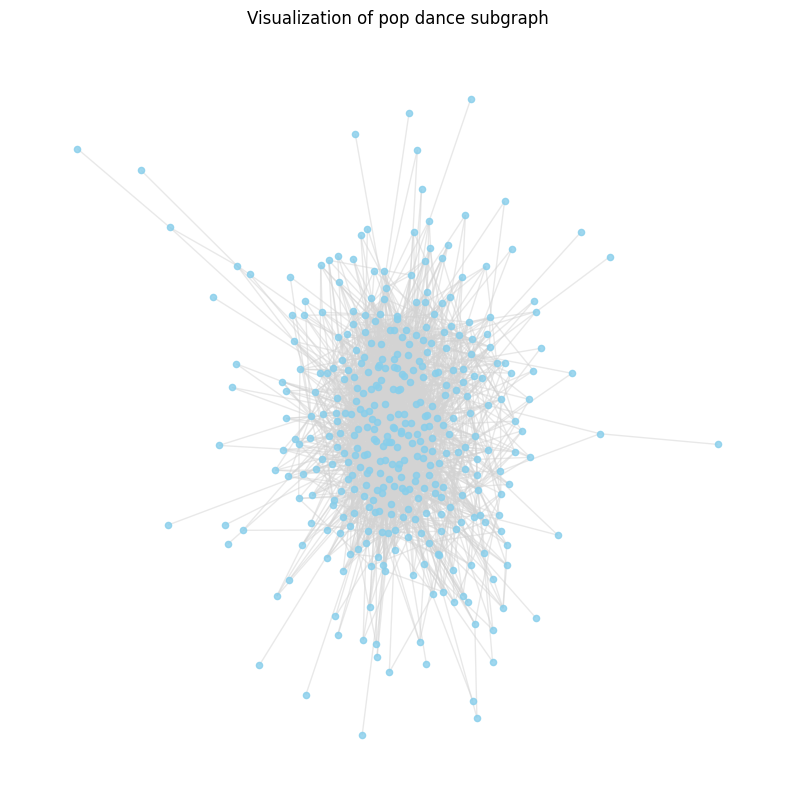

pop edm - Total nodes: 368, Isolated nodes: 94, Isolated percentage: 25.54%

20 most connected artist(s) in pop edm by number of connections:
Artist: Tritonal, Connections: 43
Artist: Cash Cash, Connections: 32
Artist: Sam Feldt, Connections: 32
Artist: NERVO, Connections: 23
Artist: Nicky Romero, Connections: 23
Artist: MOTi, Connections: 22
Artist: Matoma, Connections: 18
Artist: TELYKast, Connections: 16
Artist: GATTÜSO, Connections: 15
Artist: The Him, Connections: 14
Artist: Borgeous, Connections: 14
Artist: Lucas & Steve, Connections: 13
Artist: Jay Hardway, Connections: 13
Artist: Thomas Gold, Connections: 13
Artist: Mike Williams, Connections: 13
Artist: San Holo, Connections: 13
Artist: Shaun Frank, Connections: 13
Artist: Vicetone, Connections: 12
Artist: Lost Kings, Connections: 12
Artist: Tungevaag, Connections: 12

Diameter for pop edm: 10
Global clustering for pop edm: 0.11298989371313631
Density for pop edm: 0.016229512579877543

Comparable random graph diameter: 8
Compa

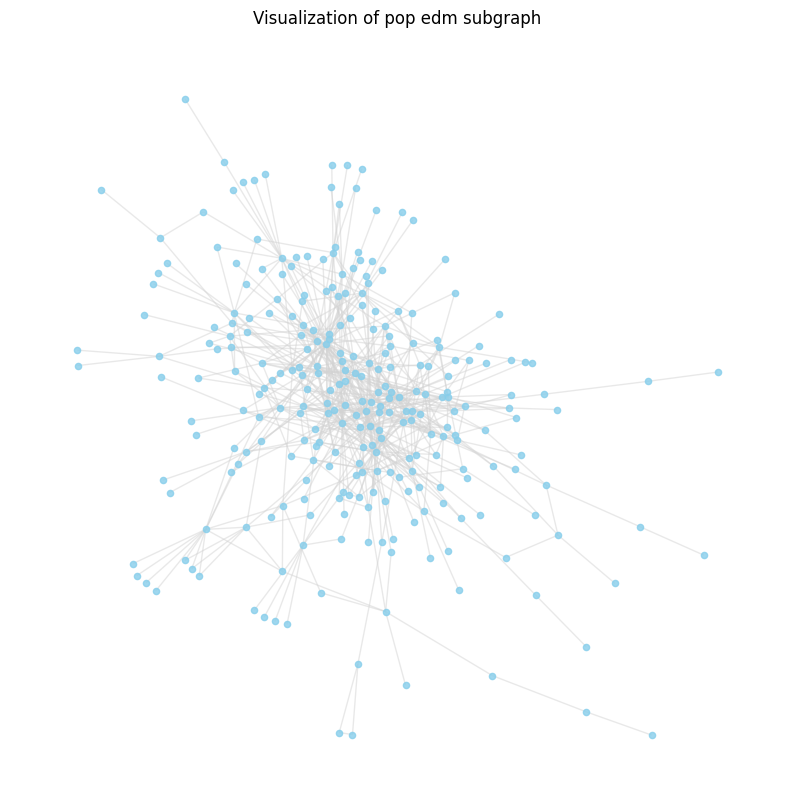

filmi - Total nodes: 351, Isolated nodes: 13, Isolated percentage: 3.70%

20 most connected artist(s) in filmi by number of connections:
Artist: A.R. Rahman, Connections: 115
Artist: Pritam, Connections: 111
Artist: Yuvan Shankar Raja, Connections: 92
Artist: Shankar Mahadevan, Connections: 76
Artist: G. V. Prakash, Connections: 73
Artist: Shankar-Ehsaan-Loy, Connections: 73
Artist: Shreya Ghoshal, Connections: 72
Artist: Hariharan, Connections: 68
Artist: Devi Sri Prasad, Connections: 66
Artist: Sukhwinder Singh, Connections: 65
Artist: Vishal-Shekhar, Connections: 64
Artist: Himesh Reshammiya, Connections: 62
Artist: Arijit Singh, Connections: 59
Artist: Amit Trivedi, Connections: 59
Artist: Mika Singh, Connections: 55
Artist: Benny Dayal, Connections: 53
Artist: Sunidhi Chauhan, Connections: 53
Artist: Udit Narayan, Connections: 51
Artist: Alka Yagnik, Connections: 51
Artist: Neeti Mohan, Connections: 50

Diameter for filmi: 5
Global clustering for filmi: 0.3990999018972658
Density 

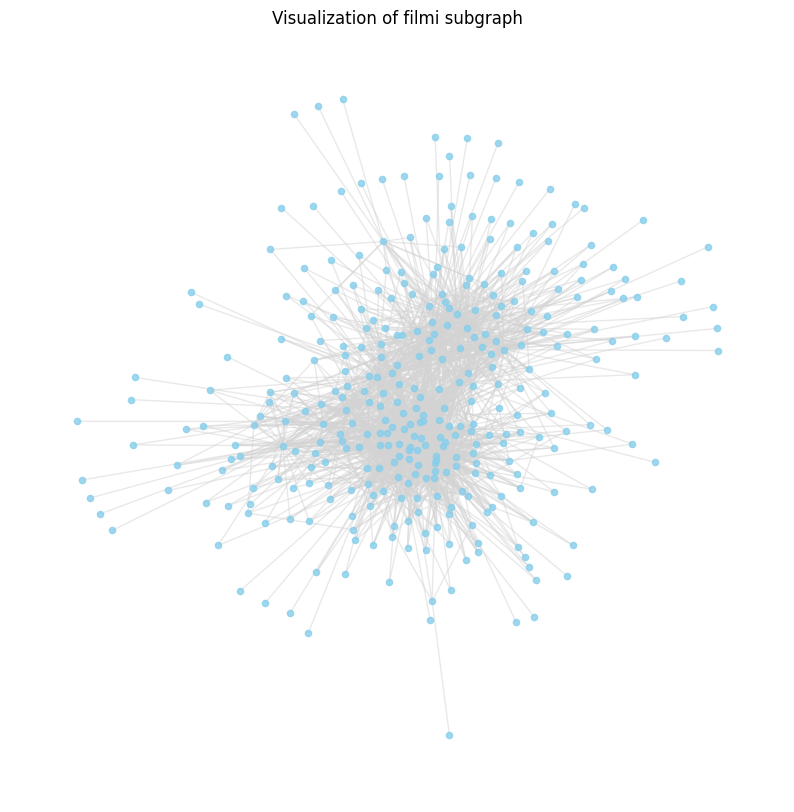

country - Total nodes: 194, Isolated nodes: 48, Isolated percentage: 24.74%

20 most connected artist(s) in country by number of connections:
Artist: Blake Shelton, Connections: 21
Artist: Dolly Parton, Connections: 18
Artist: Thomas Rhett, Connections: 16
Artist: Brad Paisley, Connections: 16
Artist: Miranda Lambert, Connections: 13
Artist: Kenny Chesney, Connections: 12
Artist: Dierks Bentley, Connections: 11
Artist: Tim McGraw, Connections: 11
Artist: HARDY, Connections: 10
Artist: Keith Urban, Connections: 10
Artist: Jason Aldean, Connections: 10
Artist: Josh Turner, Connections: 9
Artist: Zac Brown Band, Connections: 9
Artist: Chris Young, Connections: 9
Artist: Brantley Gilbert, Connections: 8
Artist: BRELAND, Connections: 8
Artist: Lady A, Connections: 8
Artist: Little Big Town, Connections: 8
Artist: Florida Georgia Line, Connections: 8
Artist: Kenny Rogers, Connections: 8

Diameter for country: 8
Global clustering for country: 0.11736055565712428
Density for country: 0.0253496

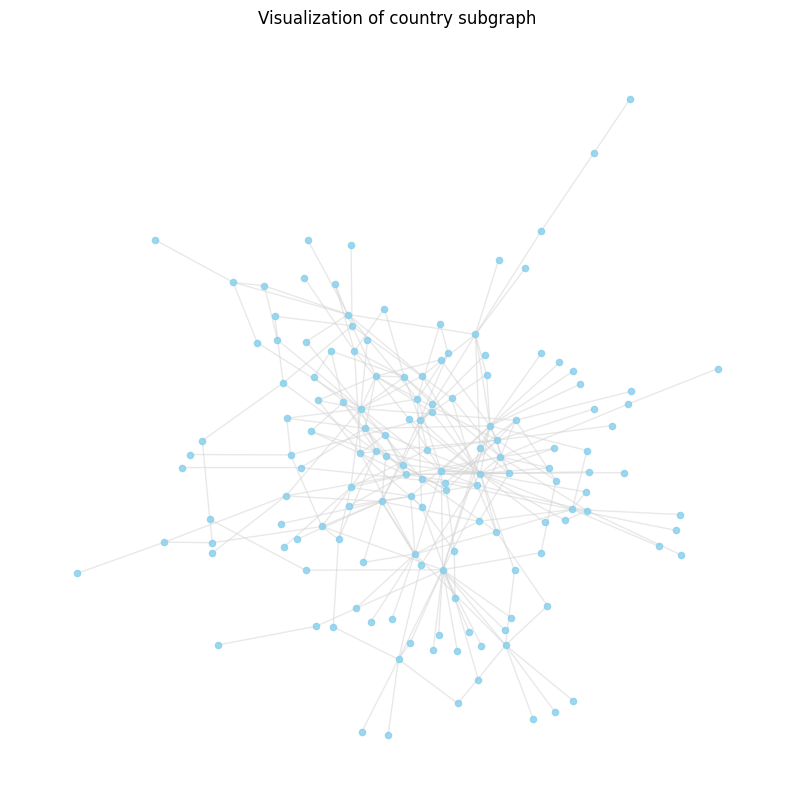

funk carioca - Total nodes: 349, Isolated nodes: 20, Isolated percentage: 5.73%

20 most connected artist(s) in funk carioca by number of connections:
Artist: MC Ryan SP, Connections: 72
Artist: Mc Gw, Connections: 68
Artist: Mc Don Juan, Connections: 63
Artist: DENNIS, Connections: 61
Artist: Mc Lele JP, Connections: 55
Artist: MC Marks, Connections: 54
Artist: Mc Davi, Connections: 52
Artist: MC Kevin o Chris, Connections: 52
Artist: MC Hariel, Connections: 50
Artist: MC Joãozinho VT, Connections: 49
Artist: Dj Batata, Connections: 48
Artist: Mc Kevin, Connections: 47
Artist: MC Menor da VG, Connections: 45
Artist: WC no Beat, Connections: 41
Artist: Mc IG, Connections: 41
Artist: Gaab, Connections: 40
Artist: MC Lan, Connections: 39
Artist: Mc Dricka, Connections: 38
Artist: Pk, Connections: 37
Artist: MC Kekel, Connections: 34

Diameter for funk carioca: 6
Global clustering for funk carioca: 0.2833120931035262
Density for funk carioca: 0.04092223293053599

Comparable random graph d

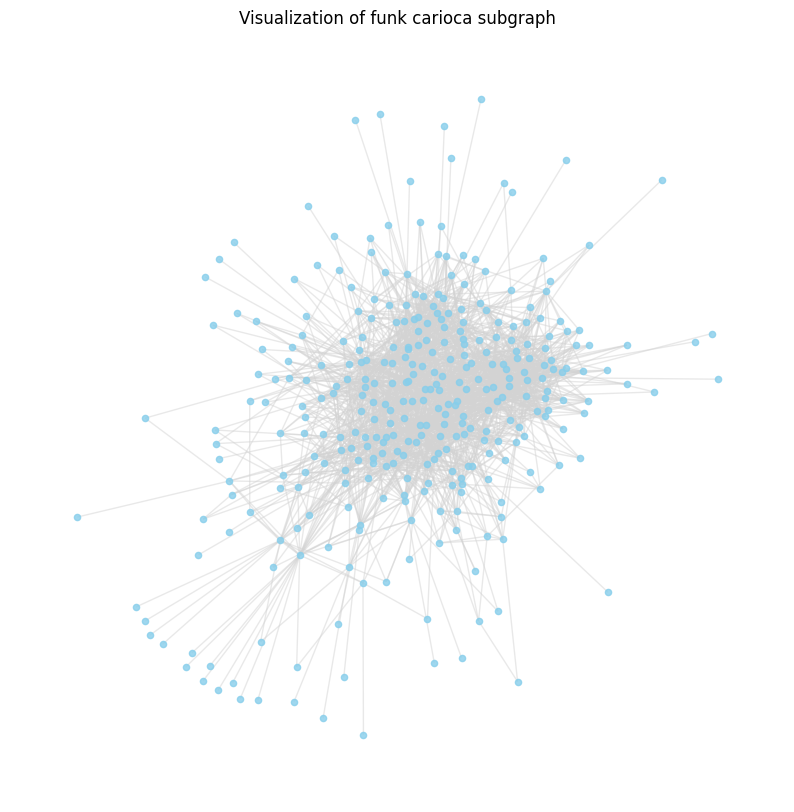

jazz - Total nodes: 74, Isolated nodes: 64, Isolated percentage: 86.49%

20 most connected artist(s) in jazz by number of connections:
Artist: Pat Metheny, Connections: 5

Diameter for jazz: 2
Global clustering for jazz: 0.0
Density for jazz: 0.3333333333333333

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.0

Comparable random graph diameter: 3
Comparable random graph global clustering: 0.0

Comparable random graph diameter: 2
Comparable random graph global clustering: 0.0

Edge count: 8
Node count: 10
k = 2
Comparable regular lattice diameter: 3
Comparable regular lattice global clustering: 0.0


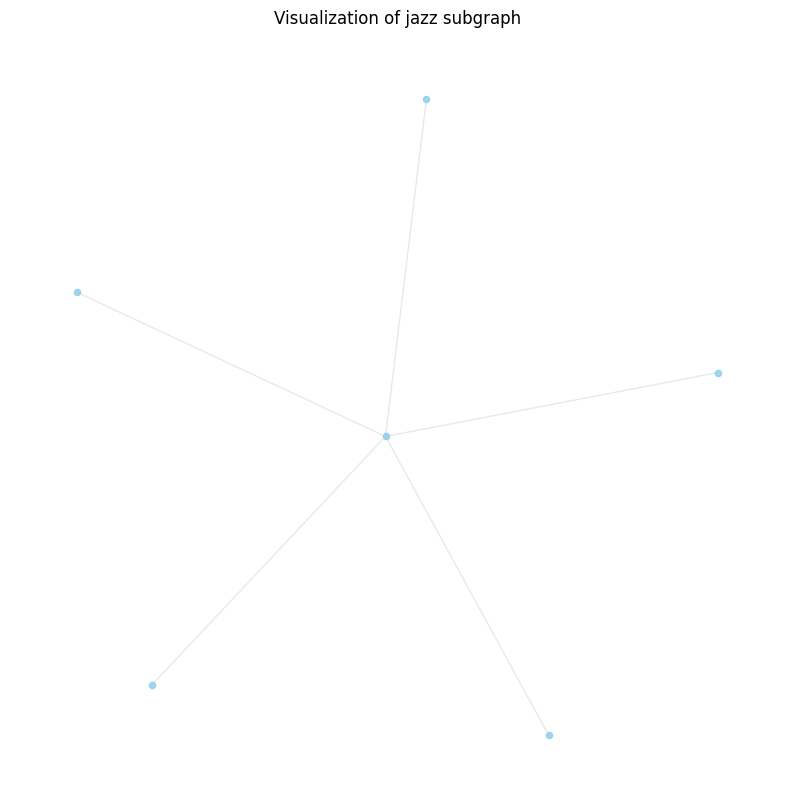

In [44]:
# define the genres to analyze:
selected_genres = ['pop', 'electro house', 'dance pop', 'pop dance', 'edm', 'pop edm', 'rap', 'r&b', 'hip hop', 'german hip hop', 
                   'uk pop', 'french hip hop', 'funk carioca', 'filmi', 'country', 'jazz', 'tropical house']

# build genre subgraphs for selected genres:
genre_subgraphs = {}
for node, data in G.nodes(data=True):
    if 'genres' in data:
        for genre in data['genres']:
            if genre in selected_genres:
                if genre not in genre_subgraphs:
                    genre_subgraphs[genre] = []
                genre_subgraphs[genre].append(node)

# calculate isolated nodes & create subgraphs for each selected genre:
for genre, nodes in genre_subgraphs.items():
    subgraph = G.subgraph(nodes).copy()

    # calculate isolated nodes and percentage:
    isolated_nodes = list(nx.isolates(subgraph))
    num_isolated = len(isolated_nodes)
    total_nodes = subgraph.number_of_nodes()
    isolated_percentage = (num_isolated / total_nodes) * 100 if total_nodes > 0 else 0
    print(f"{genre} - Total nodes: {total_nodes}, Isolated nodes: {num_isolated}, Isolated percentage: {isolated_percentage:.2f}%")

    # remove isolated nodes:
    subgraph.remove_nodes_from(isolated_nodes)
    if subgraph.number_of_nodes() == 0:
        print(f"Skipping {genre}: No nodes remain after removing isolated nodes.")
        continue

    # ensure largest_cc is always a Graph:
    if nx.is_connected(subgraph):
        largest_cc = subgraph
    else:
        # get largest connected component as a set of nodes:
        largest_cc_nodes = max(nx.connected_components(subgraph), key=len)
        # convert node set into a subgraph:
        largest_cc = subgraph.subgraph(largest_cc_nodes).copy()

    # verify largest_cc is a Graph & not empty:
    if not isinstance(largest_cc, nx.Graph) or largest_cc.number_of_nodes() == 0:
        print(f"Skipping {genre}: largest_cc is not a valid graph or is empty.")
        continue

    # find top 20 artists by degree in largest connected component:
    top_20_artists = sorted(largest_cc.degree, key=lambda x: x[1], reverse=True)[:20]
    print(f"\n20 most connected artist(s) in {genre} by number of connections:")
    for artist, degree in top_20_artists:
        # don't include "top artists" w/ no collaborations:
        if degree > 1:
            artist_name = G.nodes[artist].get('name', 'Unknown')
            print(f"Artist: {artist_name}, Connections: {degree}")

    # find diameter & global clustering for each genre's largest cluster:
    subgraph_diameter = nx.diameter(largest_cc)
    print(f"\nDiameter for {genre}: {subgraph_diameter}")
    subgraph_clustering = nx.average_clustering(largest_cc)
    print(f"Global clustering for {genre}: {subgraph_clustering}")
    subgraph_density = nx.density(largest_cc)
    print(f"Density for {genre}: {subgraph_density}\n")


    # COMPARABLE RANDOM GRAPHS:
    n = largest_cc.number_of_nodes()
    p = subgraph_density

    # generate & draw 3 samples:
    random_graphs = generate_graphs(n, p, 3)

    # analyze each:
    for random_G in random_graphs:
    # check if random graph sample is connected:
        if not nx.is_connected(random_G):
            # get largest component as a set:
            random_largest_cc_nodes = max(nx.connected_components(random_G), key=len)
            # convert to subgraph:
            random_G = random_G.subgraph(random_largest_cc_nodes).copy()

        # approximate diameter calculation using largest connected component:
        randomG_diameter = nx.diameter(random_G)
        print(f"Comparable random graph diameter: {randomG_diameter}")

        # calculate global clustering coefficient:
        randomG_clustering = nx.average_clustering(random_G)
        print(f"Comparable random graph global clustering: {randomG_clustering}")
        print('')



    # COMPARABLE REGULAR LATTICE:
    # count nodes and edges:    
    edge_count = subgraph.number_of_edges()
    print("Edge count:", edge_count)

    node_count = subgraph.number_of_nodes()
    print("Node count:", node_count)

    # decide k:
    k = (2 * edge_count) / len(subgraph)
    k = int(k)
    if k % 2 != 0:
        k += 1  # make k even
    print(f"k = {k}")

    if n > k:
        # generate regular lattice:
        reg_lat = nx.watts_strogatz_graph(n, k, 0)

        # diameter calculation:
        reg_lat_diameter = ceil(n / k)
        print(f"Comparable regular lattice diameter: {reg_lat_diameter}")
                
        # calculate global clustering coefficient:
        reg_lat_clustering = nx.average_clustering(reg_lat)
        print(f"Comparable regular lattice global clustering: {reg_lat_clustering}")
    else:
        print(f"Skipping regular lattice for {genre} because n < k.\n")
        print
        continue

    # visualize only the largest connected component if it has more than one node:
    if len(largest_cc) > 1:
        visualize_genre_subgraph(largest_cc, genre)

A closer look at jazz, uk pop, and r&b:

Number of artists in uk pop: 406


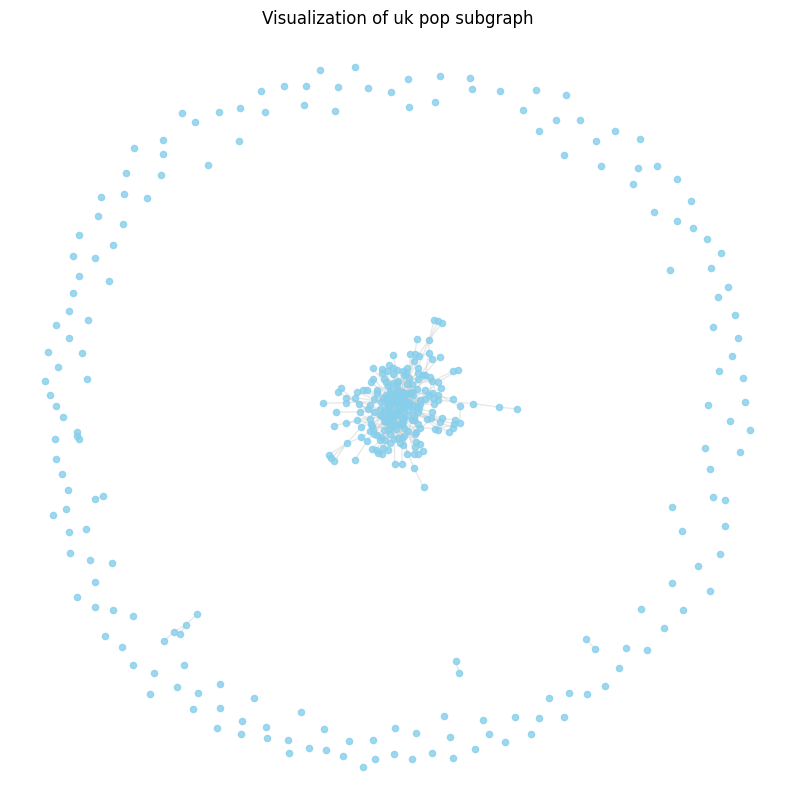

Number of artists in r&b: 299


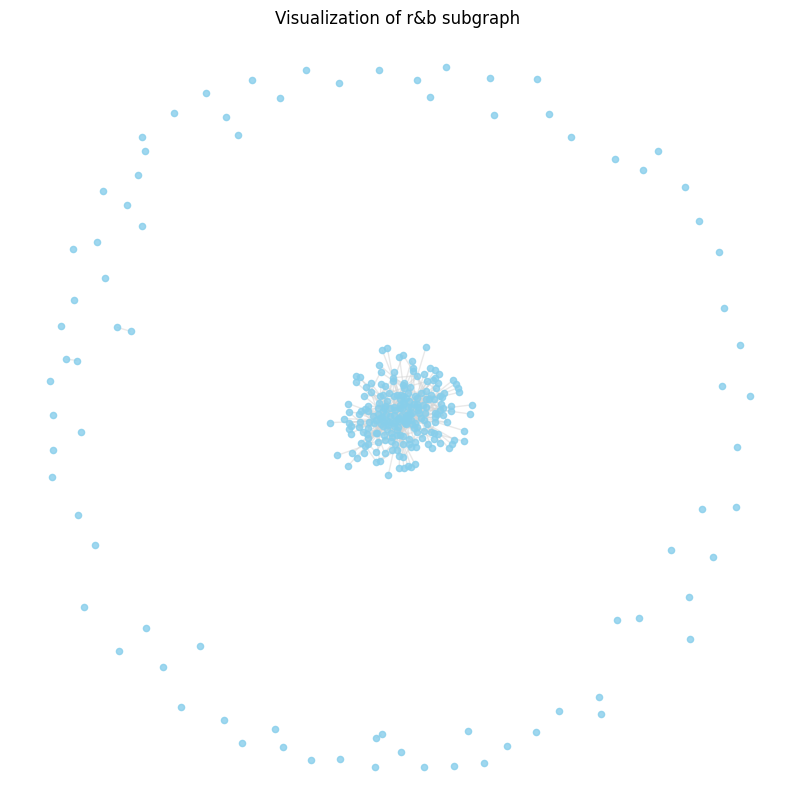

Number of artists in jazz: 74


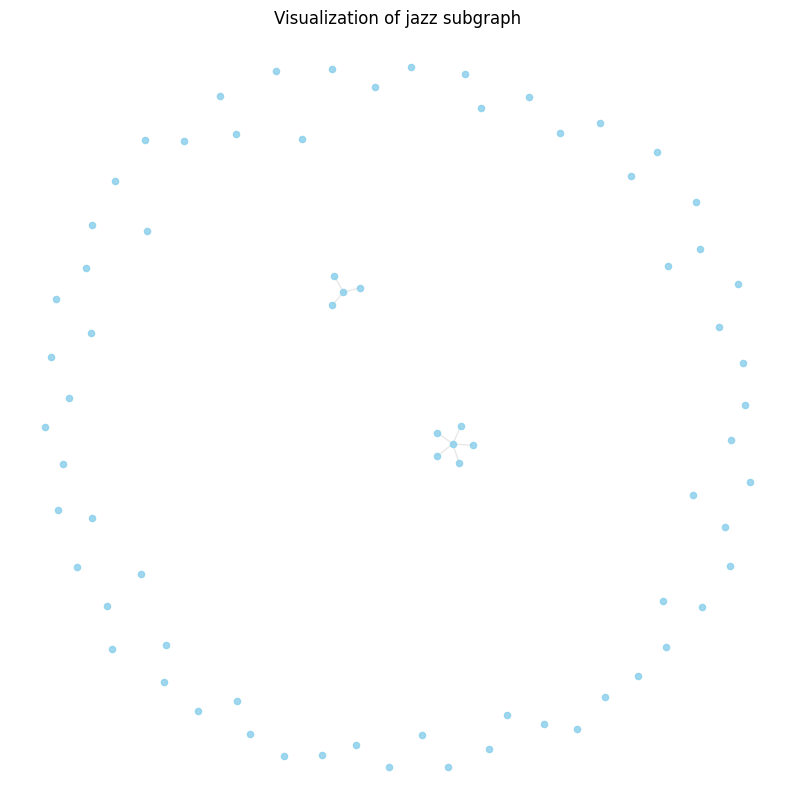


Those two most connected artists in jazz:
Artist: Pat Metheny, Connections: 5
Pat Metheny collaborated with: John Scofield, Ornette Coleman, Dave Liebman, Charlie Haden, Brad Mehldau

Artist: Kurt Elling, Connections: 3
Kurt Elling collaborated with: Marquis Hill, Miguel Zenón, Branford Marsalis



In [45]:
selected_genres = ['r&b', 'uk pop', 'jazz']

genre_subgraphs2 = {}
for node, data in G.nodes(data=True):
    if 'genres' in data:
        for genre in data['genres']:
            if genre in selected_genres:
                if genre not in genre_subgraphs2:
                    genre_subgraphs2[genre] = []
                genre_subgraphs2[genre].append(node)

# create entire subgraphs for each selected genre:
for genre, nodes in genre_subgraphs2.items():
    subgraph = G.subgraph(nodes).copy()
    print(f"Number of artists in {genre}: {subgraph.number_of_nodes()}")
    visualize_genre_subgraph(subgraph, genre)

    if genre == 'jazz':
        top_5_artists = sorted(subgraph.degree, key=lambda x: x[1], reverse=True)[:3]
        print(f"\nThose two most connected artists in {genre}:")
        for artist, degree in top_5_artists:
            if degree > 1:
                artist_name = subgraph.nodes[artist].get('name', 'Unknown')
                print(f"Artist: {artist_name}, Connections: {degree}")
                collaborators = [subgraph.nodes[neighbor].get('name', 'Unknown') for neighbor in subgraph.neighbors(artist)]
                print(f"{artist_name} collaborated with: {', '.join(collaborators)}\n")

**We're going to shift to analyzing the Spotify artists who have made it onto Weekly charts now (the seed artists):**

In [30]:
# reload data:
nodes_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/nodes.csv'
edges_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/edges.csv'
nodes_df = pd.read_csv(nodes_path)
edges_df = pd.read_csv(edges_path)

# parse columns:
nodes_df['genres'] = nodes_df['genres'].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else [])
nodes_df['chart_hits'] = nodes_df['chart_hits'].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else [])

# recreate graph:
G = nx.Graph()

# add nodes to the graph w/ attributes:
for _, row in nodes_df.iterrows():
    G.add_node(row['spotify_id'], **row.to_dict())

# add edges to graph:
for _, row in edges_df.iterrows():
    G.add_edge(row['id_0'], row['id_1'])

# group nodes by genre:
genre_subgraphs = {}
for _, row in nodes_df.iterrows():
    for genre in row['genres']:
        if genre not in genre_subgraphs:
            genre_subgraphs[genre] = []
        genre_subgraphs[genre].append(row['spotify_id'])

# filter chart-topping artists:
chart_topper_nodes = nodes_df[nodes_df['chart_hits'].apply(lambda x: len(x) > 0)].spotify_id.tolist()

Let's look at a few genre graphs including (and highlight their top artists):

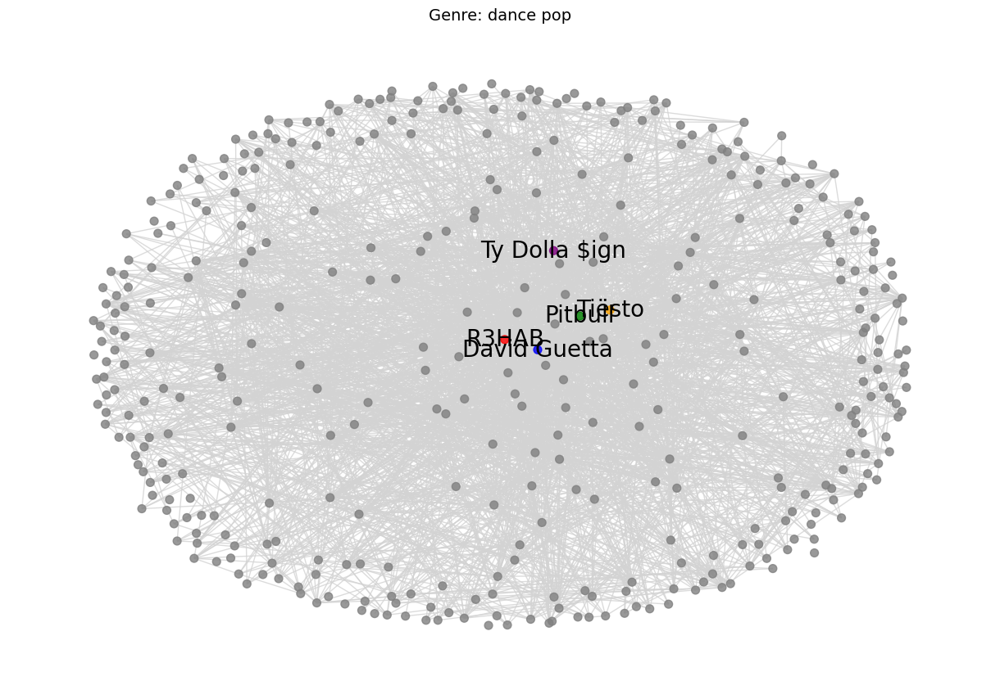


20 most connected artist(s) in dance pop by number of connections:
Artist: R3HAB, Connections: 88
Artist: David Guetta, Connections: 83
Artist: Tiësto, Connections: 59
Artist: Pitbull, Connections: 53
Artist: Ty Dolla $ign, Connections: 53
Artist: Steve Aoki, Connections: 51
Artist: Nicki Minaj, Connections: 48
Artist: MOTi, Connections: 44
Artist: Afrojack, Connections: 44
Artist: Chris Brown, Connections: 43
Artist: Sean Paul, Connections: 42
Artist: Clean Bandit, Connections: 41
Artist: Major Lazer, Connections: 40
Artist: Flo Rida, Connections: 39
Artist: Don Diablo, Connections: 38
Artist: Cheat Codes, Connections: 38
Artist: Ludacris, Connections: 37
Artist: Dimitri Vegas & Like Mike, Connections: 37
Artist: Sam Feldt, Connections: 36
Artist: T.I., Connections: 34

Diameter for dance pop: 6
Global clustering for dance pop: 0.19247642436806972
Density for dance pop: 0.03611044799872683

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.0334289738027

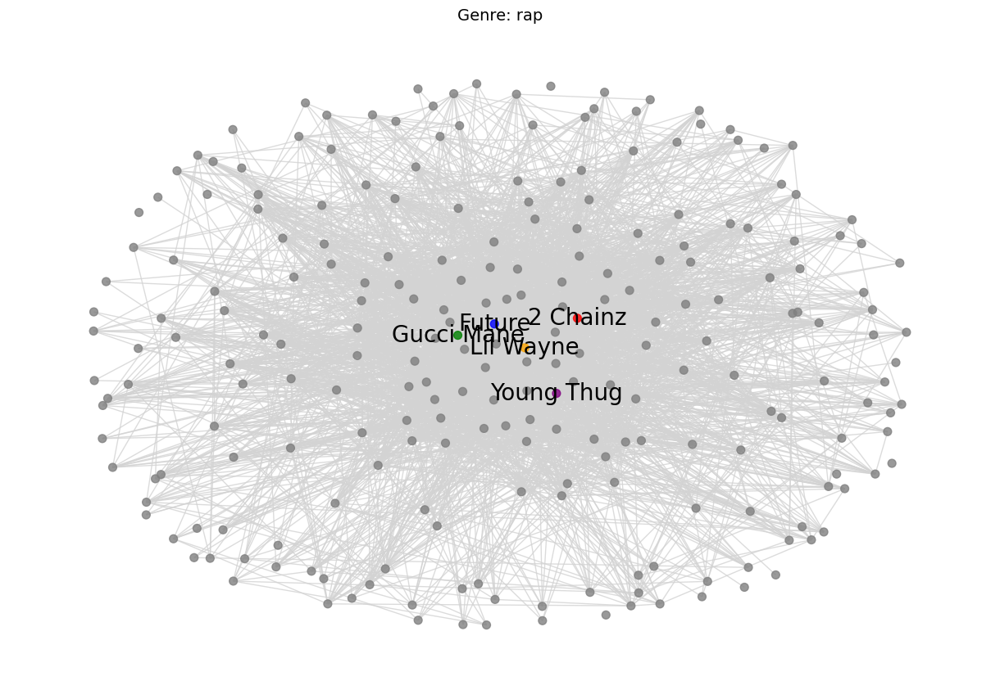


20 most connected artist(s) in rap by number of connections:
Artist: Gucci Mane, Connections: 87
Artist: Young Thug, Connections: 86
Artist: Future, Connections: 86
Artist: 2 Chainz, Connections: 86
Artist: Lil Wayne, Connections: 84
Artist: French Montana, Connections: 78
Artist: Wiz Khalifa, Connections: 73
Artist: Lil Durk, Connections: 73
Artist: Meek Mill, Connections: 68
Artist: DJ Khaled, Connections: 68
Artist: The Game, Connections: 67
Artist: Quavo, Connections: 66
Artist: Juicy J, Connections: 66
Artist: Rick Ross, Connections: 65
Artist: YG, Connections: 64
Artist: Big Sean, Connections: 64
Artist: Lil Baby, Connections: 64
Artist: T.I., Connections: 63
Artist: Tyga, Connections: 62
Artist: Yo Gotti, Connections: 61

Diameter for rap: 5
Global clustering for rap: 0.3774703447815073
Density for rap: 0.10615898169546238

Comparable random graph diameter: 3
Comparable random graph global clustering: 0.10461639741767359

Comparable random graph diameter: 3
Comparable random gr

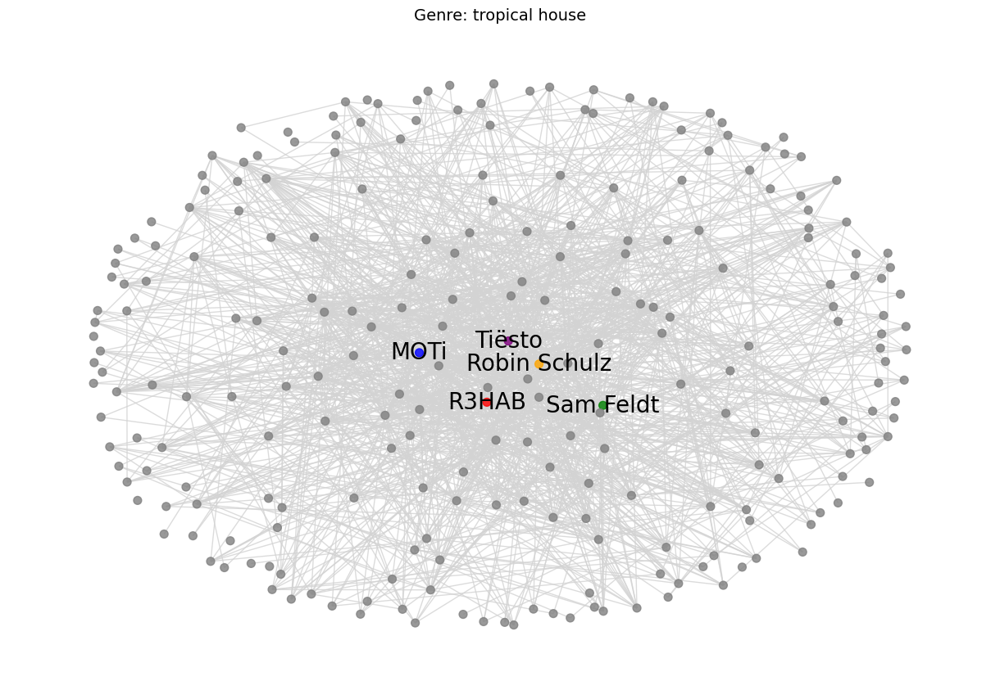


20 most connected artist(s) in tropical house by number of connections:
Artist: Tiësto, Connections: 51
Artist: R3HAB, Connections: 46
Artist: MOTi, Connections: 41
Artist: Sam Feldt, Connections: 36
Artist: Robin Schulz, Connections: 35
Artist: Steve Aoki, Connections: 34
Artist: Dimitri Vegas & Like Mike, Connections: 32
Artist: Clean Bandit, Connections: 32
Artist: HUGEL, Connections: 30
Artist: Alle Farben, Connections: 30
Artist: Galantis, Connections: 29
Artist: Nicky Romero, Connections: 28
Artist: Cheat Codes, Connections: 28
Artist: Rudimental, Connections: 28
Artist: Afrojack, Connections: 28
Artist: Lost Frequencies, Connections: 27
Artist: Joel Corry, Connections: 26
Artist: Don Diablo, Connections: 26
Artist: Diplo, Connections: 25
Artist: The Chainsmokers, Connections: 25

Diameter for tropical house: 7
Global clustering for tropical house: 0.15530822503106614
Density for tropical house: 0.04608110565557374

Comparable random graph diameter: 4
Comparable random graph glo

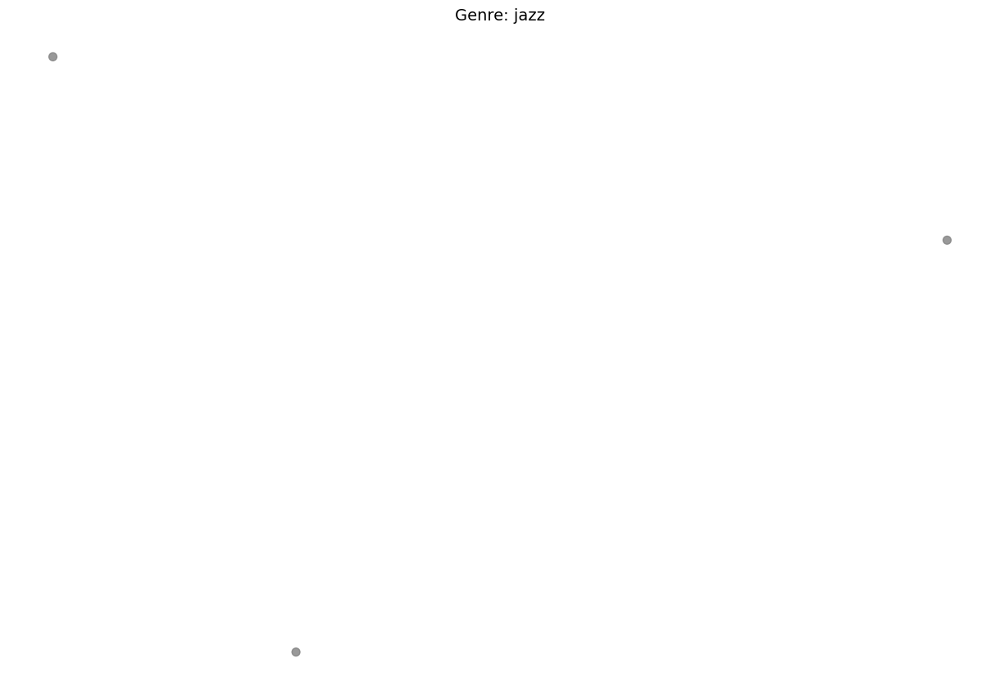


20 most connected artist(s) in jazz by number of connections:

Diameter for jazz: 0
Global clustering for jazz: 0.0
Density for jazz: 0

Comparable random graph diameter: 0
Comparable random graph global clustering: 0.0

Comparable random graph diameter: 0
Comparable random graph global clustering: 0.0

Comparable random graph diameter: 0
Comparable random graph global clustering: 0.0

Edge count: 0
Node count: 1
k = 0
Skipping regular lattice for jazz because n < k.



In [33]:
# define artist highlights for each genre (top 5):
highlight_artists = {
    'dance pop': {'R3HAB': 'red', 'David Guetta': 'blue', 'Tiësto': 'orange', 'Pitbull': 'green', 'Ty Dolla $ign': 'purple'},
    'rap': {'Gucci Mane': 'green', 'Lil Wayne': 'orange', 'Future': 'blue', 'Young Thug': 'purple', '2 Chainz': 'red'},
    'tropical house': {'Tiësto': 'purple', 'R3HAB': 'red', 'MOTi': 'blue', 'Sam Feldt': 'green', 'Robin Schulz': 'orange'},
    'jazz': {}
}

# to visualize subgraphs w/ highlighted nodes:
def visualize_highlighted_subgraph(subgraph, genre, highlights):
    pos = nx.spring_layout(subgraph, k=1.3, iterations=50)
    plt.figure(figsize=(12, 8))
    
    colors = []
    labels = {}
    
    for node in subgraph.nodes():
        node_color = 'gray'  # default color
        node_name = G.nodes[node].get('name', 'Unknown')
        if genre == 'jazz':
            print(node_name)
        if node_name in highlights:
            node_color = highlights[node_name]  # highlight color
            labels[node] = node_name  # label for highlighted nodes
        colors.append(node_color)

    # draw nodes & edges:
    nx.draw(subgraph, pos, node_color=colors, with_labels=False, node_size=50, alpha=0.8, edge_color='lightgray')
    nx.draw_networkx_labels(subgraph, pos, labels=labels, font_size=20, font_color='black')

    plt.title(f"Genre: {genre}", fontsize=14)
    plt.show()

# build, visualize, & analyze specific genre subgraphs:
for genre, highlights in highlight_artists.items():
    if genre in highlight_artists:
        # filter nodes in the genre to include only chart-toppers:
        subgraph_nodes = [node for node in genre_subgraphs[genre] if node in chart_topper_nodes]
        subgraph = G.subgraph(subgraph_nodes).copy()
        
        # skip isolated nodes:
        # subgraph.remove_nodes_from(list(nx.isolates(subgraph)))

        if subgraph.number_of_nodes() > 0:
            visualize_highlighted_subgraph(subgraph, genre, highlights)
        else:
            print(f"No nodes to visualize for genre: {genre}")

        
        if nx.is_connected(subgraph):
            largest_cc = subgraph
        else:
            # get largest connected component as a set of nodes:
            largest_cc_nodes = max(nx.connected_components(subgraph), key=len)
            # convert node set into a subgraph:
            largest_cc = subgraph.subgraph(largest_cc_nodes).copy()

        # verify largest_cc is a Graph & not empty:
        if not isinstance(largest_cc, nx.Graph) or largest_cc.number_of_nodes() == 0:
            print(f"Skipping {genre}: largest_cc is not a valid graph or is empty.")
            continue
        
        # find top 20 artists by degree in largest connected component:
        top_20_artists = sorted(largest_cc.degree, key=lambda x: x[1], reverse=True)[:20]
        print(f"\n20 most connected artist(s) in {genre} by number of connections:")
        for artist, degree in top_20_artists:
            # don't include "top artists" w/ no collaborations:
            if degree > 1:
                artist_name = G.nodes[artist].get('name', 'Unknown')
                print(f"Artist: {artist_name}, Connections: {degree}")

        # find diameter & global clustering for each genre's largest cluster:
        subgraph_diameter = nx.diameter(largest_cc)
        print(f"\nDiameter for {genre}: {subgraph_diameter}")
        subgraph_clustering = nx.average_clustering(largest_cc)
        print(f"Global clustering for {genre}: {subgraph_clustering}")
        subgraph_density = nx.density(largest_cc)
        print(f"Density for {genre}: {subgraph_density}\n")


        # COMPARABLE RANDOM GRAPHS:
        n = largest_cc.number_of_nodes()
        p = subgraph_density

        # generate & draw 3 samples:
        random_graphs = generate_graphs(n, p, 3)

        # analyze each:
        for random_G in random_graphs:
        # check if random graph sample is connected:
            if not nx.is_connected(random_G):
                # get largest component as a set:
                random_largest_cc_nodes = max(nx.connected_components(random_G), key=len)
                # convert to subgraph:
                random_G = random_G.subgraph(random_largest_cc_nodes).copy()

            # approximate diameter calculation using largest connected component:
            randomG_diameter = nx.diameter(random_G)
            print(f"Comparable random graph diameter: {randomG_diameter}")

            # calculate global clustering coefficient:
            randomG_clustering = nx.average_clustering(random_G)
            print(f"Comparable random graph global clustering: {randomG_clustering}")
            print('')


        subgraph = largest_cc

        # COMPARABLE REGULAR LATTICE:
        # count nodes and edges:    
        edge_count = subgraph.number_of_edges()
        print("Edge count:", edge_count)

        node_count = subgraph.number_of_nodes()
        print("Node count:", node_count)

        # decide k:
        k = (2 * edge_count) / len(subgraph)
        k = int(k)
        if k % 2 != 0:
            k += 1  # make k even
        print(f"k = {k}")

        if n > k and k != 0:
            # generate regular lattice:
            reg_lat = nx.watts_strogatz_graph(n, k, 0)

            # diameter calculation:
            reg_lat_diameter = ceil(n / k)
            print(f"Comparable regular lattice diameter: {reg_lat_diameter}")
                    
            # calculate global clustering coefficient:
            reg_lat_clustering = nx.average_clustering(reg_lat)
            print(f"Comparable regular lattice global clustering: {reg_lat_clustering}")
        else:
            print(f"Skipping regular lattice for {genre} because n < k.\n")
            print
            continue

Something strange happens with jazz. All of the chart-topper artists are disconnected, and there's only 3 of them..

Let's look at some popularity range subgraphs now (as defined by the dataset):

Number of nodes in less popular artists subgraph: 105683
Number of edges in less popular artists subgraph: 12553


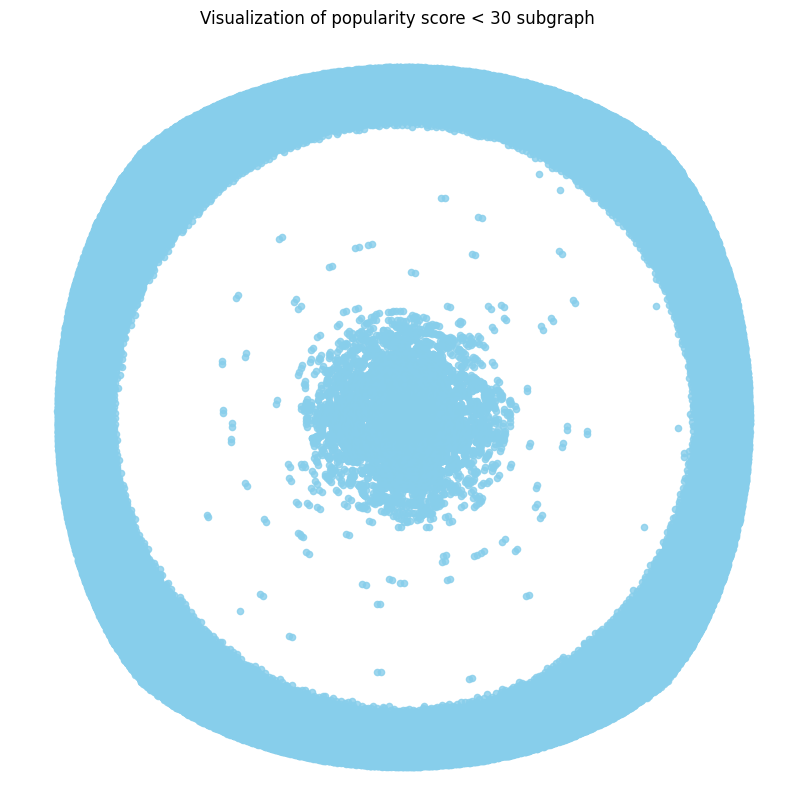

In [48]:
# runtime ~130min

# set popularity threshold:
popularity_max = 30

# filter nodes based on popularity:
less_popular_artists = [node for node, data in G.nodes(data=True) if data.get('popularity', 0) < popularity_max]
less_popular_subgraph = G.subgraph(less_popular_artists).copy()

# visualize or analyze the popular subgraph as needed:
print(f"Number of nodes in less popular artists subgraph: {less_popular_subgraph.number_of_nodes()}")
print(f"Number of edges in less popular artists subgraph: {less_popular_subgraph.number_of_edges()}")

visualize_genre_subgraph(less_popular_subgraph, 'popularity score < 30')

Number of nodes in popular artists subgraph: 933
Number of edges in popular artists subgraph: 7282


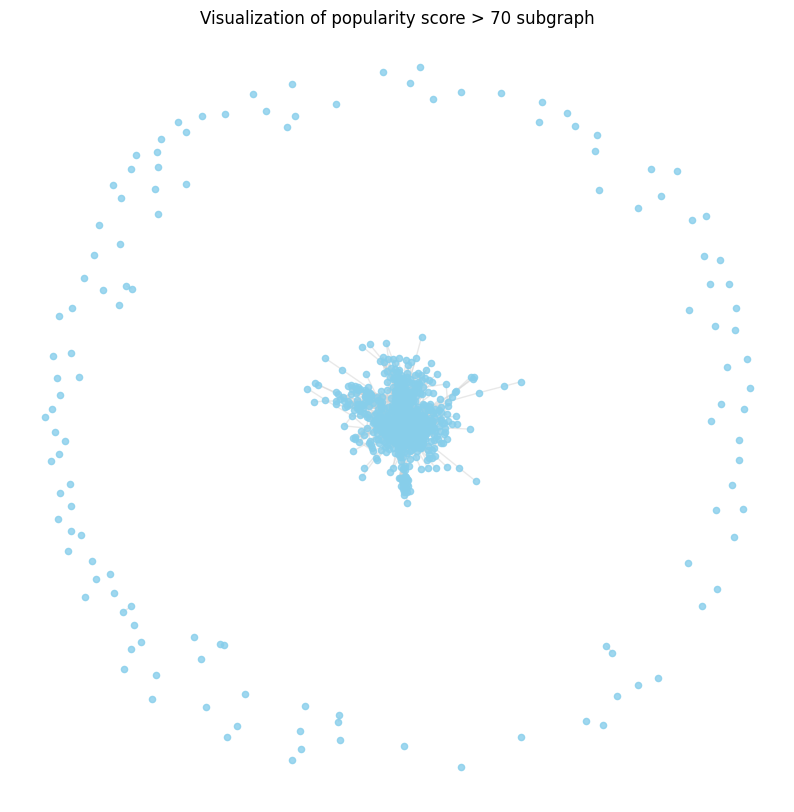

In [49]:
# set popularity threshold:
popularity_threshold = 70

# filter nodes based on popularity:
popular_artists = [node for node, data in G.nodes(data=True) if data.get('popularity', 0) > popularity_threshold]
popular70_subgraph = G.subgraph(popular_artists).copy()

# visualize or analyze the popular subgraph as needed:
print(f"Number of nodes in popular artists subgraph: {popular70_subgraph.number_of_nodes()}")
print(f"Number of edges in popular artists subgraph: {popular70_subgraph.number_of_edges()}")

visualize_genre_subgraph(popular70_subgraph, 'popularity score > 70')

Number of nodes in popular artists subgraph: 403
Number of edges in popular artists subgraph: 3123


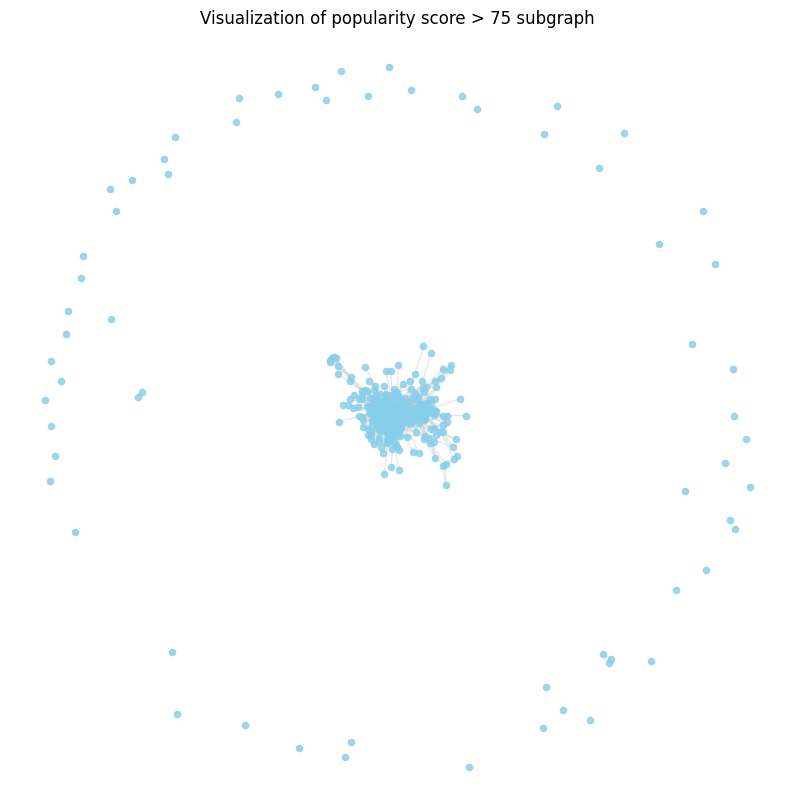

In [50]:
# set popularity threshold:
popularity_threshold = 75

# filter nodes based on popularity:
popular_artists = [node for node, data in G.nodes(data=True) if data.get('popularity', 0) > popularity_threshold]
popular75_subgraph = G.subgraph(popular_artists).copy()

# visualize or analyze the popular subgraph as needed:
print(f"Number of nodes in popular artists subgraph: {popular75_subgraph.number_of_nodes()}")
print(f"Number of edges in popular artists subgraph: {popular75_subgraph.number_of_edges()}")

visualize_genre_subgraph(popular75_subgraph, 'popularity score > 75')

In [51]:
# calculate degree threshold (top 5%):
degrees = [degree for node, degree in G.degree()]
degree_threshold = np.percentile(degrees, 95)  # 95th percentile

# select nodes w/ degree above threshold:
high_degree_nodes = [node for node, degree in G.degree() if degree > degree_threshold]

# create subgraph w/ only high-degree nodes:
high_degree_subgraph = G.subgraph(high_degree_nodes).copy()

# output # of nodes/edges:
print(f"Number of nodes in high-degree subgraph: {high_degree_subgraph.number_of_nodes()}")
print(f"Number of edges in high-degree subgraph: {high_degree_subgraph.number_of_edges()}")


Number of nodes in high-degree subgraph: 7533
Number of edges in high-degree subgraph: 67160


***Applying the Louvain algorithm for community detection:***

This method is great for detecting meaningful communities within large networks very efficiently.

In [5]:
# reload data:
nodes_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/nodes.csv'
edges_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/edges.csv'
nodes_df = pd.read_csv(nodes_path)
edges_df = pd.read_csv(edges_path)

print(nodes_df.head())
print(edges_df.head())

nodes_df['genres'] = nodes_df['genres'].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else [])
nodes_df['chart_hits'] = nodes_df['chart_hits'].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else [])


# filter out nodes w/ empty 'chart_hits':
chart_topping_nodes = nodes_df[nodes_df['chart_hits'].apply(lambda x: len(x) > 0)]['spotify_id'].tolist()

print(f"\nNumber of chart-topping nodes: {len(chart_topping_nodes)}")

G = nx.Graph()

# add nodes:
for _, row in nodes_df.iterrows():
    G.add_node(row['spotify_id'], **row.to_dict())

# add edges:
for _, row in edges_df.iterrows():
    G.add_edge(row['id_0'], row['id_1'])

# create subgraph of chart-topping artists:
subgraph = G.subgraph(chart_topping_nodes).copy()

# count:
subgraph_node_count = subgraph.number_of_nodes()
subgraph_edge_count = subgraph.number_of_edges()

print(f"Node count: {subgraph_node_count}")
print(f"Edge count: {subgraph_edge_count}")

# Louvain method for community detection:
if subgraph_node_count > 0:
    partition = community_louvain.best_partition(subgraph)
    num_communities = len(set(partition.values()))
    print(f"\nNumber of communities detected: {num_communities}")

    # group nodes by community:
    community_groups = defaultdict(list)
    for node, community_id in partition.items():
        community_groups[community_id].append(node)

    # display sample community groups:
    print("\nSample community group:")
    sample_communities = dict(list(community_groups.items())[:1])
    print(sample_communities)

               spotify_id                name  followers  popularity  \
0  48WvrUGoijadXXCsGocwM4           Byklubben     1738.0          24   
1  4lDiJcOJ2GLCK6p9q5BgfK            Kontra K  1999676.0          72   
2  652XIvIBNGg3C0KIGEJWit               Maxim    34596.0          36   
3  3dXC1YPbnQPsfHPVkm1ipj  Christopher Martin   249233.0          52   
4  74terC9ol9zMo8rfzhSOiG       Jakob Hellman    21193.0          39   

                                              genres  \
0                     ['nordic house', 'russelater']   
1             ['christlicher rap', 'german hip hop']   
2                                                 []   
3  ['dancehall', 'lovers rock', 'modern reggae', ...   
4  ['classic swedish pop', 'norrbotten indie', 's...   

                                          chart_hits  
0                                         ['no (3)']  
1  ['at (44)', 'de (111)', 'lu (22)', 'ch (31)', ...  
2                                         ['de (1)']  
3         

Let's get the modularity score for the Louvain-detected communities detected above:

In [6]:
from community import community_louvain
from networkx.algorithms.community import modularity

# convert partition dict into list of sets (format required by networkx's modularity function):
communities = defaultdict(set)
for node, community_id in partition.items():
    communities[community_id].add(node)

# convert dict values to list of sets:
community_list = list(communities.values())

# compute modularity score:
modularity_score = modularity(subgraph, community_list)

print(f"\nModularity Score: {modularity_score:.4f}")


Modularity Score: 0.7799


Looking at the distribution of community sizes:

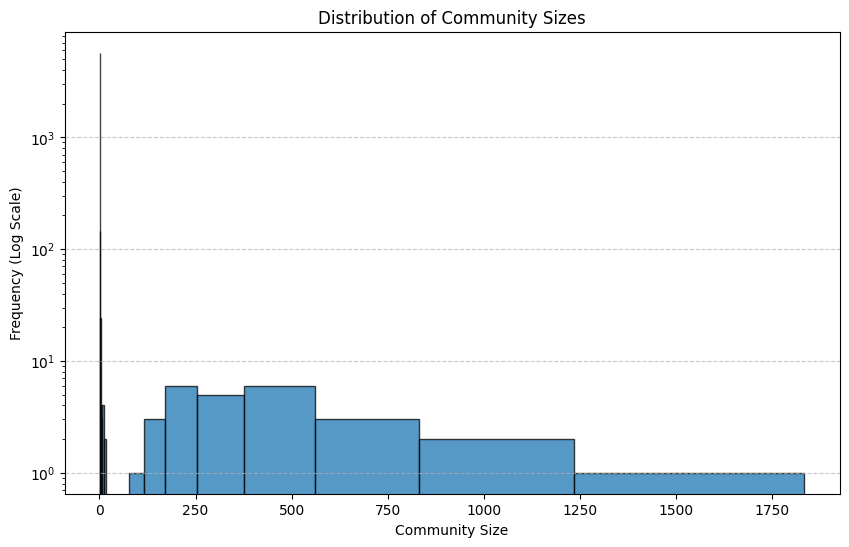

In [8]:
# histogram of community sizes:
community_sizes = [len(nodes) for nodes in community_groups.values()]
plt.figure(figsize=(10, 6))

# adjust bins dynamically based on data range:
bins = np.logspace(np.log10(min(community_sizes)), np.log10(max(community_sizes)), num=20)

plt.hist(community_sizes, bins=bins, edgecolor='black', alpha=0.75)
plt.yscale('log')  # log scale to better spread values
plt.xlabel('Community Size')
plt.ylabel('Frequency (Log Scale)')
plt.title('Distribution of Community Sizes')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

Let's visualize the top 10 communities color-coded:

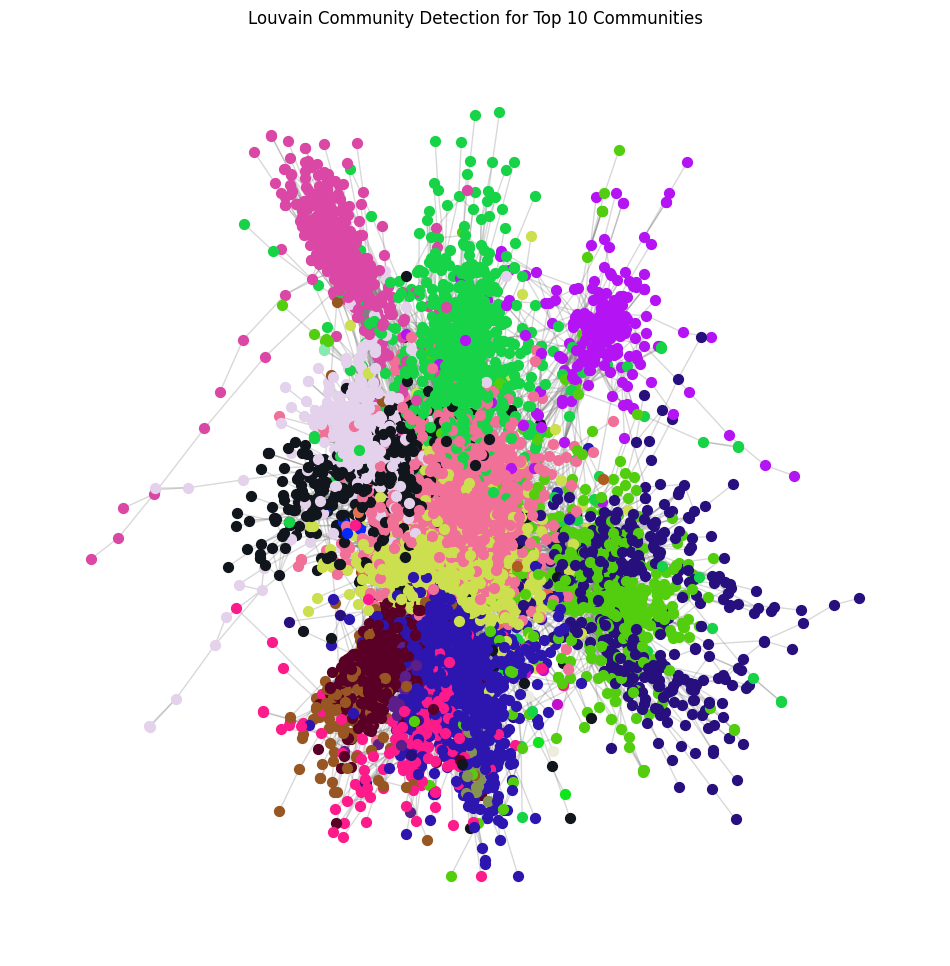

In [53]:
# choose top 10 communities based on size:
top_10_communities = sorted(community_groups.items(), key=lambda x: len(x[1]), reverse=True)[:10]

# create graph w/ only nodes from top 10 communities:
top_10_nodes = [node for community_id, members in top_10_communities for node in members]
top_10_subgraph = G.subgraph(top_10_nodes).copy()

# apply Louvain partitioning on top 10 subgraph:
top_10_partition = community_louvain.best_partition(top_10_subgraph)

# generate colors for each community:
unique_communities = list(set(top_10_partition.values()))
community_colors = {community_id: (random.random(), random.random(), random.random()) for community_id in unique_communities}

# positioning:
pos = nx.spring_layout(top_10_subgraph, seed=42)

# plot graph w/ communities colored:
plt.figure(figsize=(12, 12))
for node, community_id in top_10_partition.items():
    nx.draw_networkx_nodes(top_10_subgraph, pos, nodelist=[node], node_size=50, node_color=[community_colors[community_id]])

nx.draw_networkx_edges(top_10_subgraph, pos, alpha=0.3, edge_color="gray")
plt.title("Louvain Community Detection for Top 10 Communities")
plt.axis("off")
plt.show()

Now let's analyze the communities. Who's in them? What genres are they characterized by? Do they hold small-world properties? We'll have to compare them to the random G(n, p) graphs and regular lattices of the same sizes and densities.

Artists in Community 2:
- Juluka
- Maybon
- John Newman
- Bear's Den
- Noah Kahan
- Tritonal
- VINAI
- NEIKED
- SLAY
- Penguin Prison
- Gabrielle Aplin
- Nina Simone
- Walk Off the Earth
- SYML
- KNYD
- AlunaGeorge
- Claire Rosinkranz
- De Eneste To
- LA Vision
- Beach Bunny
- Vintage Culture
- Hyphen Hyphen
- FRENSHIP
- Jutty Ranx
- Gostan
- Oh Wonder
- DJ Krlos Berrospi
- Carmada
- Turab
- Nause
- Ødyssey
- Johnny Clegg
- HAEVN
- Smallpools
- Stephen Puth
- Dark Waves
- CALVIN
- Alvan
- Jin Akanishi
- One Bit
- KLYMVX
- Ramin Djawadi
- Daniel Schulz
- Jax Jones
- Cazzi Opeia
- Bliss n Eso
- L'Tric
- BoyWithUke
- Norm Ender
- JC Stewart
- MENTIS
- Mount Cashmore
- Hayden James
- Röyksopp
- LUNAX
- Robyn
- Sylvan Esso
- Aloe Blacc
- INNA
- Thomas Jack
- Filatov & Karas
- Solardo
- JCY
- Alina Baraz
- FINNEAS
- Lost Kings
- Santa Maradona F.C.
- BROODS
- dePresno
- Orange Grove
- Cats On Trees
- Regard
- Rationale
- Winona Oak
- Basto
- Philip George
- Loreen
- Double Pleasure
- Ingrid 

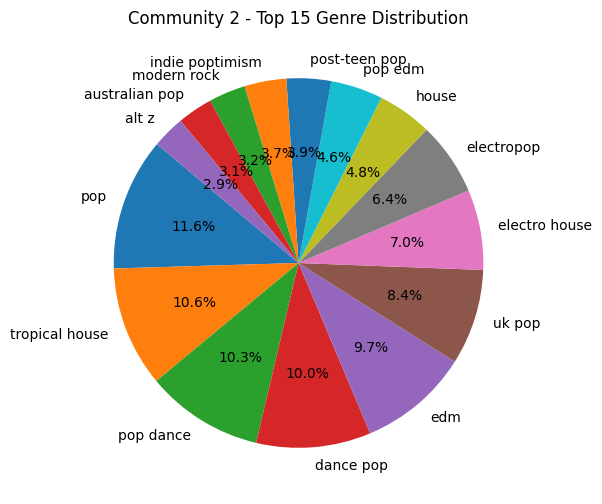

Global clustering coefficient for Community 2: 0.11188070196245561
Diameter for Community 2: 10
Density for Community 2: 0.005060808052580678

Comparable random graph diameter: 6
Comparable random graph global clustering: 0.004285181847547107

Comparable random graph diameter: 6
Comparable random graph global clustering: 0.005042085231731941

Comparable random graph diameter: 6
Comparable random graph global clustering: 0.005777195714547173

Edge count: 9236
Node count: 1911
k = 10
Comparable regular lattice diameter: 192
Comparable regular lattice global clustering: 0.6666666666666666


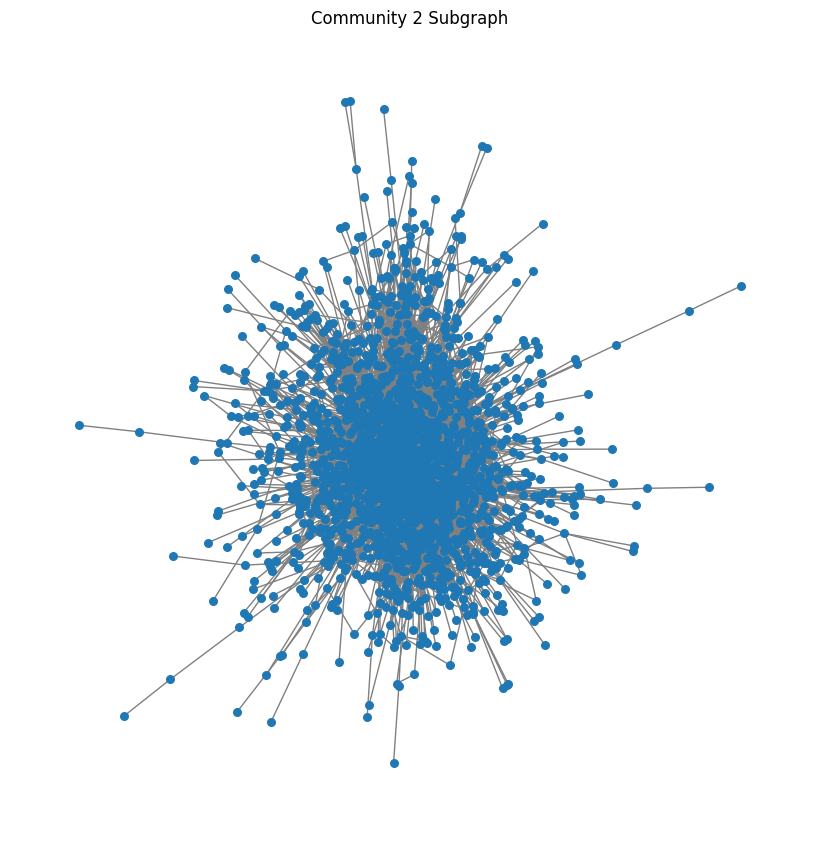

Artists in Community 6:
- Carlos Baute
- Belén Aguilera
- ARTIGAZZ
- Alexio
- Jhon el Diver
- El Goldo De Las Conec
- Malacates Trebol Shop
- Ivan Cornejo
- Banda Tierra Sagrada
- Mon Laferte
- Miguelito
- DJ Kelvin El Sacamostro
- Lenka
- RYH
- Aldo Trujillo
- Yung Sarria
- Gigolo
- Jay Menez
- Tito Flow
- Pereza
- Love Yi
- JC el Diamante
- Lupillo Rivera
- Aiman JR
- Natalia Lacunza
- Cazzu
- Estelares
- Fito Blanko
- Maná
- Renée Elise Goldsberry
- La Combo Tortuga
- Rubén Blades
- Joss Favela
- Elvis Crespo
- La Joaqui
- Dread Mar I
- Doble Porcion
- Paulino Monroy
- Cecile
- Aleman
- Cristian Castro
- Tomy DJ
- Bogart Bonales
- Antonio José
- Sebastian Yatra
- Mr. Vegas
- Sole Gimenez
- Come & C
- El BAI
- MOI MUSIC
- Juan Alcaraz
- LosPetitFellas
- Cornelio Vega y su Dinastia
- Quimico Ultra Mega
- TG
- BANDIDO
- Kontra Marin
- Natalia Jiménez
- Original Elias
- Anna Carina
- María Escarmiento
- Tu Papa
- Agapornis
- Raes
- Manuel Medrano
- Mariah Angeliq
- Nico Mastre
- Mando
-

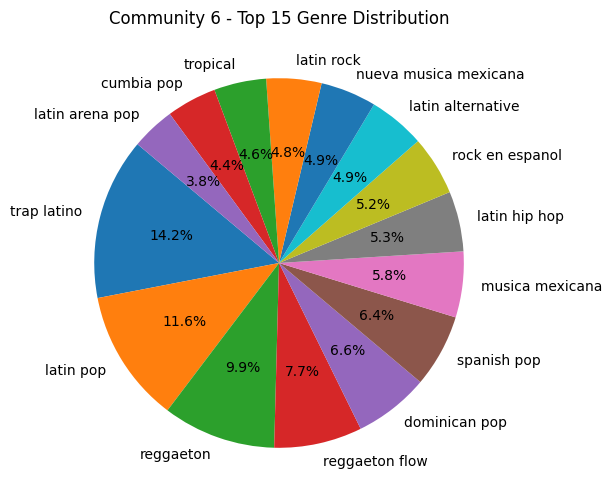

Global clustering coefficient for Community 6: 0.23078366343580625
Diameter for Community 6: 10
Density for Community 6: 0.008797900551388103

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.008044199094260702

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.00811634201119391

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.009003650573472296

Edge count: 11509
Node count: 1618
k = 14
Comparable regular lattice diameter: 116
Comparable regular lattice global clustering: 0.6923076923076923


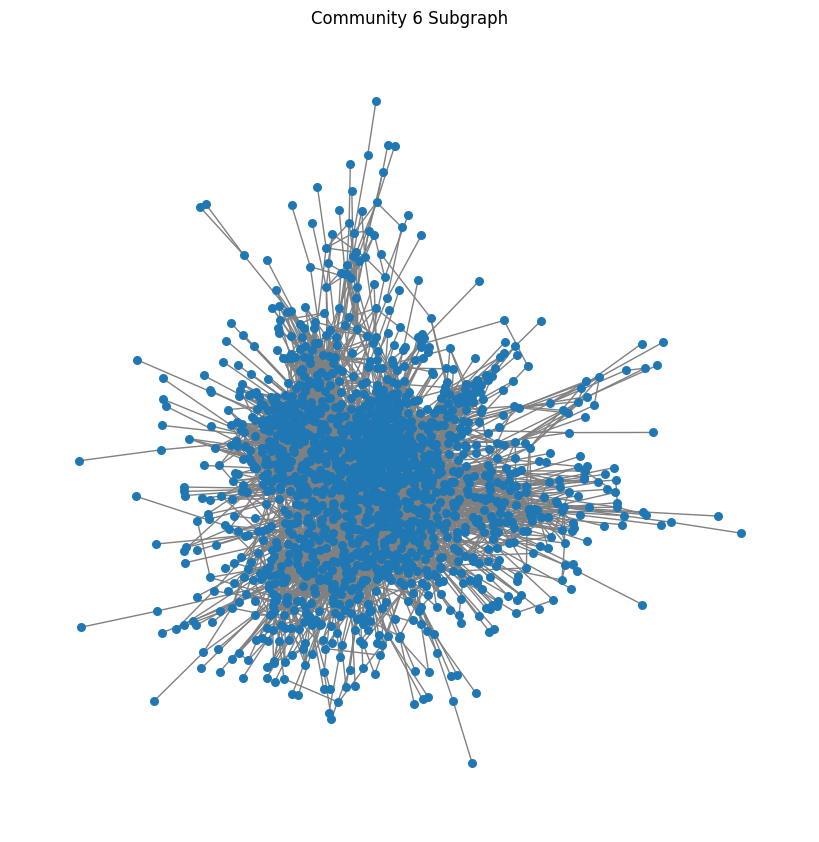

Artists in Community 14:
- Brantley Gilbert
- Yoshiki
- Lil Xan
- Patrick Watson
- Bernard Fanning
- Gyakie
- TLC
- Kizz Daniel
- The All-American Rejects
- Zac Efron
- Gym Class Heroes
- The Isley Brothers
- Jeremih
- R. Kelly
- Carlie Hanson
- Elijah Blake
- Khruangbin
- Jessica Mauboy
- Nello Taver
- Earth, Wind & Fire
- Big Sean
- Young DrA
- Bruce Springsteen
- lil Shordie Scott
- Ginny Blackmore
- Cynthia Erivo
- Sheryl Crow
- Josh Gad
- Jay 305
- Charles Hamilton
- Ché-Fu
- Dierks Bentley
- Zay Hilfigerrr
- Neon Dreams
- Lil Nas X
- The Band Perry
- Shaggy
- Cody Johnson
- Coi Leray
- Natalia Gordienko
- Bryan Adams
- Sean Kingston
- Earl Sweatshirt
- CHIC
- THE SCOTTS
- Tory Lanez
- Sam Hunt
- Busta Rhymes
- Feist
- Huddy
- Hotboii
- Jelly Roll
- Drake
- Akon
- Damien Rice
- Spice Girls
- Pi’erre Bourne
- Thundercat
- SonReal
- FKA twigs
- Mitchell Tenpenny
- Franz Ferdinand
- Fontaines D.C.
- Black Sabbath
- Mary J. Blige
- Boyz II Men
- Phantogram
- Xuitcasecity
- Westlife
- 

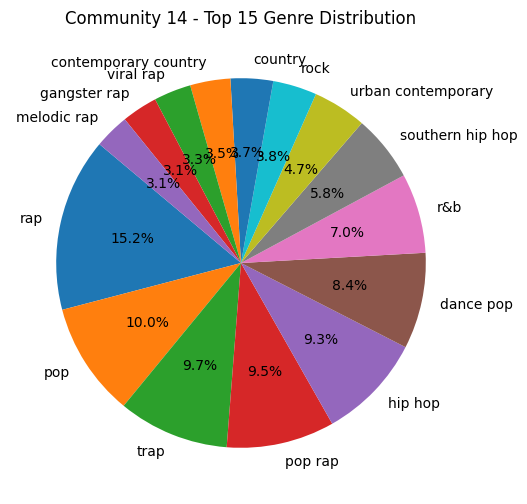

Global clustering coefficient for Community 14: 0.2013396599028583
Diameter for Community 14: 10
Density for Community 14: 0.012040700960994912

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.012398662227005022

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.011763685953262219

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.01225570086767468

Edge count: 8094
Node count: 1160
k = 14
Comparable regular lattice diameter: 83
Comparable regular lattice global clustering: 0.6923076923076923


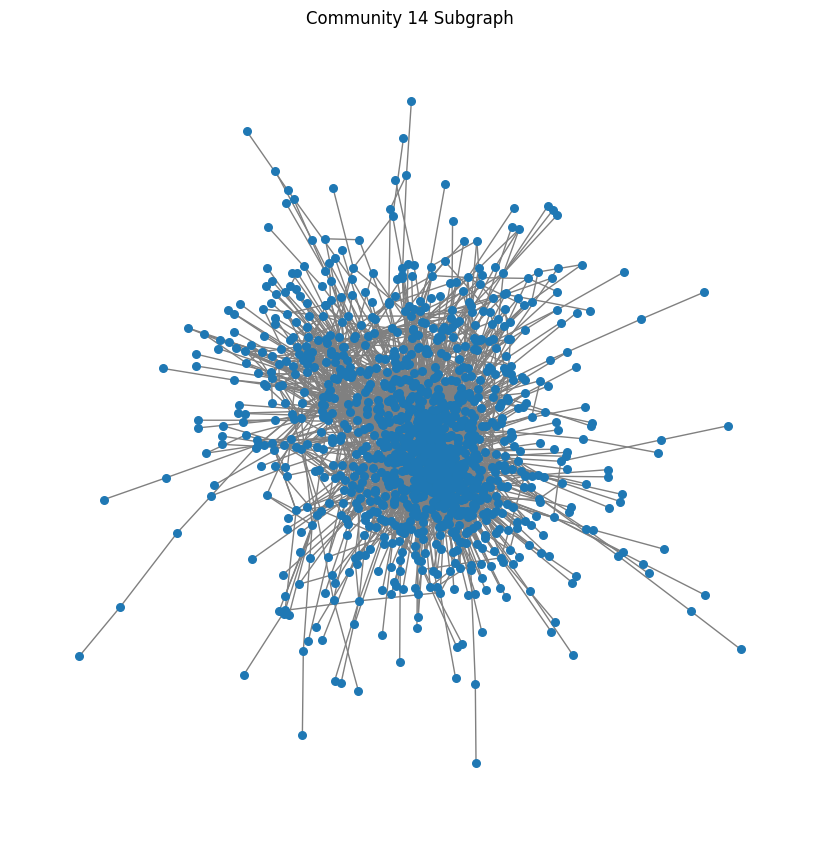

Artists in Community 7:
- Tomas Andersson Wij
- Blacky
- Naod
- Svenstrup & Vendelboe
- Allyawan
- Yei Gonzalez
- WAHL
- Kaliffa
- Guldpige
- Owen
- Isah
- Daniel Vince
- Soppgirobygget
- Vera
- Sven-Bertil Taube
- Hasse Andersson
- Big Fat Snake
- Young Juu
- Tunge Ferrari
- Suspekt
- Monica Zetterlund
- Eiqu
- Hellbillies
- Katastrofe
- Emil Lange
- Heimdals Sidste Vogter
- Nathan Trent
- ZL-Project
- Benjamin Hav
- Pretty
- Janice
- Aden x Asme
- TuVeia
- Gyllene Tider
- Dr. Disco
- Specktors
- BEK & Wallin
- Svante Thuresson
- BL
- Junie
- Grillat & Grändy
- Näääk & Nimo
- Basim
- Gabrielle
- EMIR
- Lina Hedlund
- Lasse Stefanz
- DJ Inappropriate
- Suzi P
- Andy Williams
- Gigis
- DnoteOnDaBeat
- El Papi
- Melissa Horn
- AMRO
- iSHi
- Tobias Rahim
- Miklo
- Kretsen
- Little Jinder
- Camilo & Grande
- Maxida Märak
- vinni
- Sebastian Zalo
- L.O.C.
- Mads Christian
- Nik & Jay
- Szhirley
- Eebz
- Dutty Dior
- Frank Friendly
- Tiki Taane
- Blizzy
- Stephen Speaks
- Mokke
- AKI
- Armi 

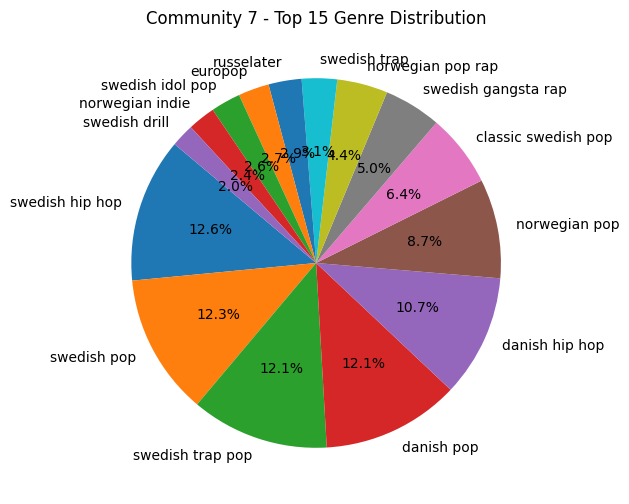

Global clustering coefficient for Community 7: 0.15543135159789417
Diameter for Community 7: 15
Density for Community 7: 0.006511064236021791

Comparable random graph diameter: 8
Comparable random graph global clustering: 0.004420776442437092

Comparable random graph diameter: 9
Comparable random graph global clustering: 0.0067034449705929856

Comparable random graph diameter: 8
Comparable random graph global clustering: 0.0077293210867218085

Edge count: 2278
Node count: 837
k = 6
Comparable regular lattice diameter: 140
Comparable regular lattice global clustering: 0.6


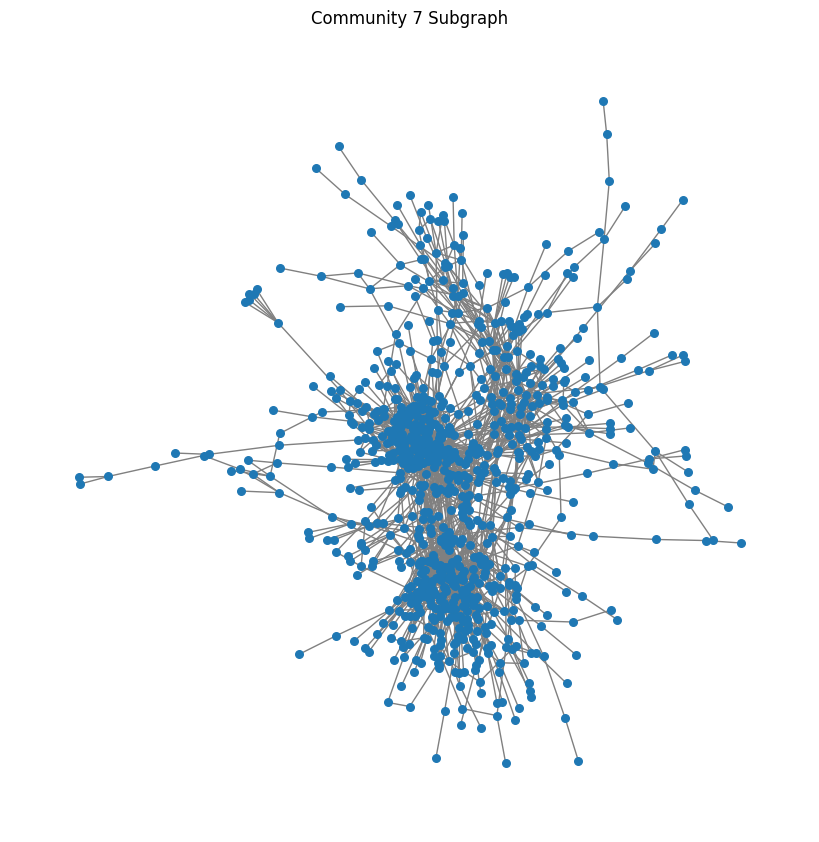

Artists in Community 3:
- Lisandro Cuxi
- Vitor e Luan
- Matias Damásio
- Tati Zaqui
- Projota
- Cristiano Araújo
- Turma da Bregadeira
- Salvador Da Rima
- Juliette
- Thiago Brava
- Pisadinha De Luxo
- MC WM
- Braão
- Kell Smith
- Danni Gato
- KVSH
- Mc Pepeu
- Mc Frog
- Mc Jhey
- Dj Ademar
- ZAAC
- Whadi Gama
- 9 Miller
- Sorriso Maroto
- DJ Dollynho Da Lapa
- Clau
- Hugo & Vitor
- Taty pink
- MC Yuri
- Cláudia Pascoal
- Daniel Caon
- Minguito 283
- Jojo Maronttinni
- Supercombo
- Malta
- WC no Beat
- Mc Gui
- Mc Livinho
- Mc Cyclope
- Richie Campbell
- Zé Vaqueiro
- Pezão
- Matheus & Kauan
- Luccas Carlos
- Rui Orlando
- Nivaldo Marques
- Mc Pikachu
- Rennan da Penha
- Mc Neguinho do ITR
- Mc Paiva ZS
- Shevchenko e Elloco
- Dj Bruninho Pzs
- Gabi Martins
- Dan Ventura
- Ventura
- POLLO
- Biel
- VMZ
- Apollo G
- Pixote
- Matuê
- MC Braz
- Jeff Costa
- Felipe Amorim
- Cláudio Ismael
- L7NNON
- Ana Castela
- Yasmine
- Mc Kevin
- Biu do Piseiro
- Mc Dricka
- 7 Minutoz
- Taty Girl
- MC 

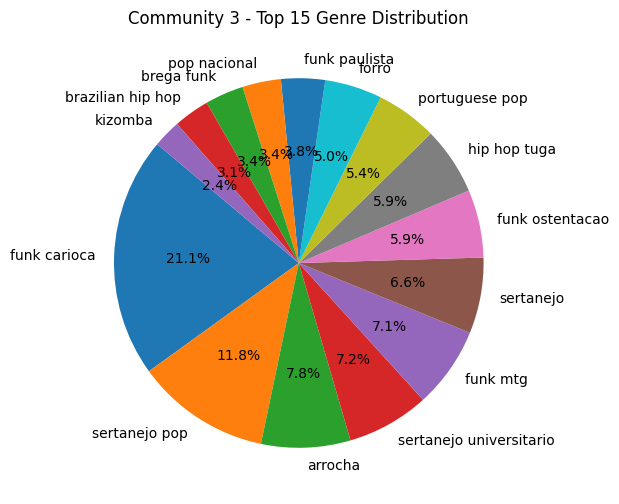

Global clustering coefficient for Community 3: 0.23271125496832928
Diameter for Community 3: 10
Density for Community 3: 0.01990343322515232

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.018053387551903163

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.019441000148383767

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.020636334524321228

Edge count: 4250
Node count: 654
k = 12
Comparable regular lattice diameter: 55
Comparable regular lattice global clustering: 0.6818181818181818


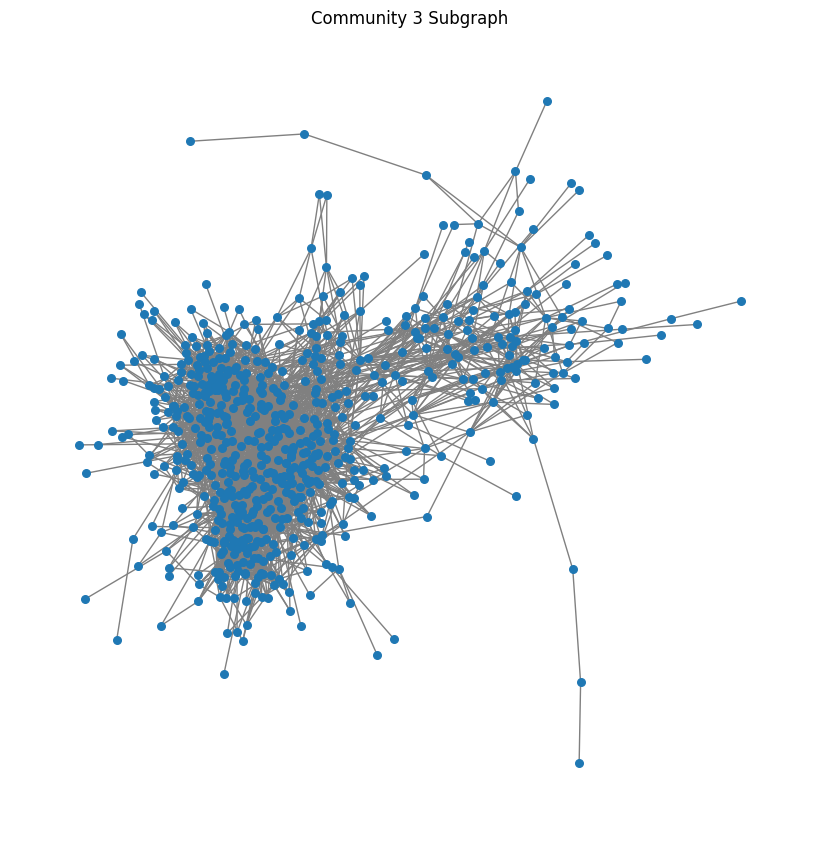

Artists in Community 51:
- Patrickananda
- JOEY PHUWASIT
- Bunkface
- Woro Widowati
- Potato
- theBOYKOR
- Ninja
- Room 39
- Better Weather
- Aicelle Santos
- 2T FLOW
- Atta Halilintar
- Donnalyn
- ILUX
- Ice Paris
- Ndarboy Genk
- Spuds
- NONT TANONT
- Rizky Febian
- ต้าเหนิง กัญญาวีร์
- Haneri
- Stamp
- Bright Vachirawit
- KH
- Endah N Rhesa
- Gloc 9
- Matthaios
- Bedroom Audio
- Ecko Show
- Rayi Putra
- Twenty-Nine Eleven
- MASKETEER
- CLR
- Sitti
- SonaOne
- Pee Wee Gaskins
- NYK
- เขียนไขและวานิช
- K6Y
- Pearwah
- As'ad Motawh
- YOUNGOHM
- อุ๋ย บุดดาเบลส
- Rap Against Dictatorship
- Fynn Jamal
- Billkin
- MEYOU
- fellow fellow
- ETC.
- Namm Ronnadet
- Ramengvrl
- Aziz Harun
- PDL
- Gavin D
- Sam Concepcion
- Judika
- Kinkaworn
- Bird Thongchai
- Nik Qistina
- Bo Saris
- Arthur Nery
- Nabila Razali
- Jill Vidal
- Skusta Clee
- Dewa 19
- BANKK CA$H
- Elizabeth Tan
- Songkarn Rangsant
- Lula
- Ann Thitima
- Khel Pangilinan
- PUN
- Clash
- MEAN
- Brisia Jodie
- Keng Tachaya
- Kathryn 

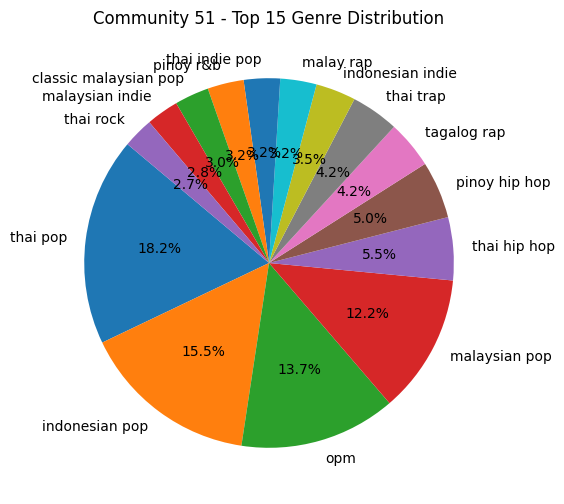

Global clustering coefficient for Community 51: 0.15856054251171364
Diameter for Community 51: 18
Density for Community 51: 0.006677227587851534

Comparable random graph diameter: 11
Comparable random graph global clustering: 0.00947190121028331

Comparable random graph diameter: 10
Comparable random graph global clustering: 0.002863102009859689

Comparable random graph diameter: 11
Comparable random graph global clustering: 0.006861151741697816

Edge count: 1176
Node count: 594
k = 4
Comparable regular lattice diameter: 149
Comparable regular lattice global clustering: 0.5


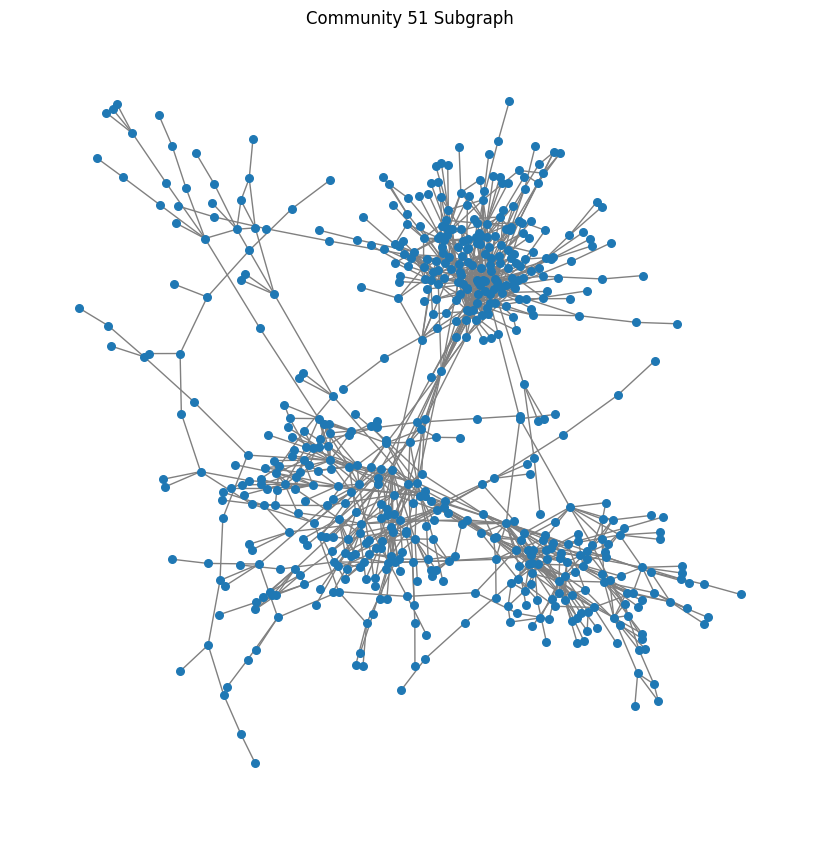

Artists in Community 110:
- Fynn Kliemann
- Die Fantastischen Vier
- Paula Dalla Corte
- Seeed
- Celo & Abdi
- Kasalla
- Mathea
- t-low
- Mia Julia
- Romeo Veshaj
- LUIS
- ASD
- KazOnDaBeat
- Liba
- Peter Power
- Milonair
- Miksu / Macloud
- METRICKZ
- CALO
- Azet
- Big Pat
- Isong
- Lennon & Maisy
- IAM
- Bligg
- Malle Anja
- Xidir
- Veysel
- Ado Kojo
- Coup
- Eagles Of Death Metal
- MoTrip
- LX
- Chakuza
- $OHO BANI
- Casar
- Lorenz Büffel
- Ledri Vula
- Max + Johann
- Eight O
- Mudi
- Relja
- WIER
- Trailerpark
- Dabu Fantastic
- Xen
- Bosse
- Gzuz
- The Common Linnets
- Eunique
- Montez
- CESO
- Nucci
- Monk
- Revolverheld
- L Loko
- POWERKRYNER
- Severina
- Dafina Zeqiri
- EREN CAN
- Nimo
- Bonez MC
- Lil Lano
- Jazeek
- DILOMAN
- SANTOS
- Capo
- Paula Hartmann
- Riccardo
- Fake Pictures
- BOY
- Moe Phoenix
- Samo104
- Kaizers Orchestra
- Fler
- Coby
- Zera
- Kraftklub
- Lo & Leduc
- Knossi
- Majoe
- No Skool
- Phil The Beat
- Joshi Mizu
- Payy
- Olexesh
- Bato
- Maxwell
- Twelve


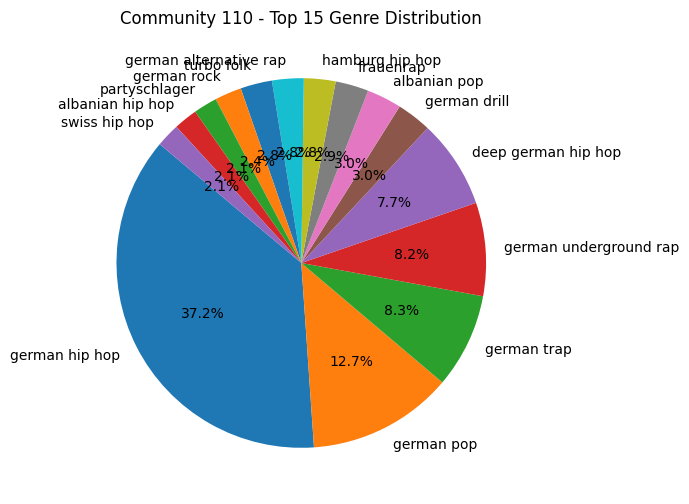

Global clustering coefficient for Community 110: 0.2368713292194602
Diameter for Community 110: 11
Density for Community 110: 0.016489905443393814

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.014840511670868814

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.016802424994043746

Comparable random graph diameter: 6
Comparable random graph global clustering: 0.019056851961125512

Edge count: 2581
Node count: 560
k = 10
Comparable regular lattice diameter: 56
Comparable regular lattice global clustering: 0.6666666666666666


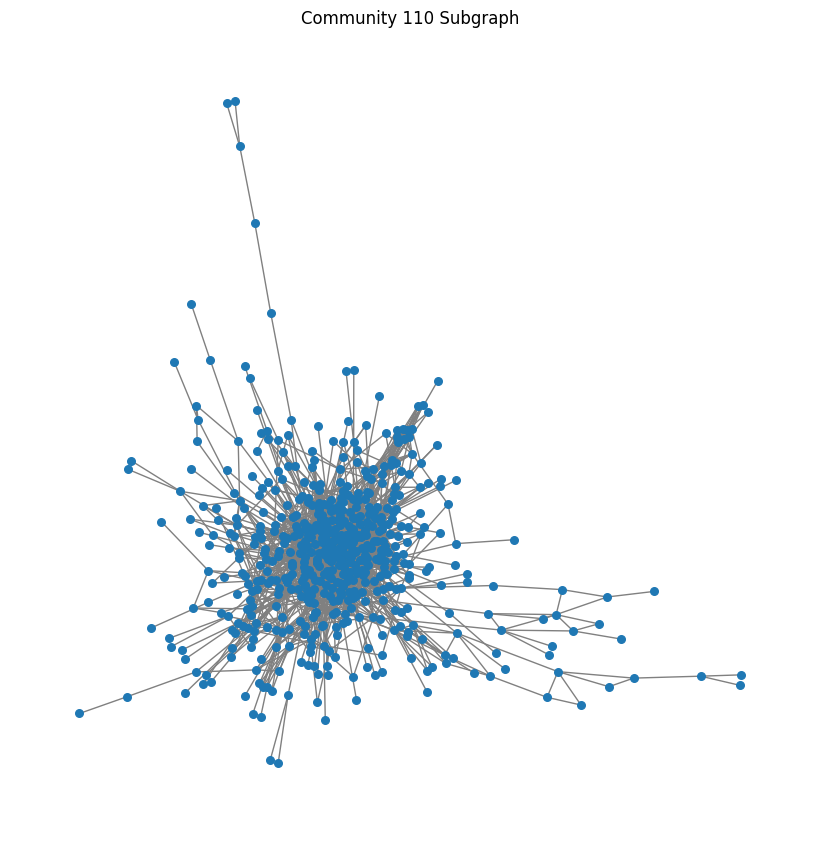

Artists in Community 80:
- Lynda
- Guy2bezbar
- Assala Nasri
- Badjer
- Leila AD
- Luv Resval
- Juliette Armanet
- Therapie TAXI
- Louane
- Naza
- Hös Copperfield
- Alain Souchon
- Le Motif
- Chily
- Yanns
- Breezy
- Bengous
- Diddi Trix
- Saad Lamjarred
- S-Pion
- Still Fresh
- Zina Daoudia
- Zaz
- Bilal Hassani
- L7or
- Benab
- Mouh Milano
- Dollypran
- Osirus Jack
- RIDSA
- Seezy
- Lartiste
- Diva Faune
- Vitaa
- DJ Abdel
- Shaniz
- Calogero
- HMZ
- Klem Schen
- Kpoint
- Cheb Houssem
- Dabs
- Nessbeal
- Jeanne Added
- Dj Quick
- Sasso
- kouz1
- Imany
- Balqees
- T Garcia
- 13 Block
- Eddy de Pretto
- Boostee
- Idrissi
- Sneazzy
- Tayc
- Marouane
- A2h
- Amine
- Scridge
- Doums
- Didou Parisien
- RYM
- Joé Dwèt Filé
- حسونوف
- Yes Mccan
- 100 Blaze
- Loud
- Raid
- Mr. Crazy
- VAN
- D.A.V
- Mac Tyer
- Cinco
- PNL
- Mons
- Magic System
- Carbozo
- Set&Match
- Christine and the Queens
- Khaled
- Douzi
- Khaled Abdul Rahman
- Squidji
- BEN plg
- Imen Es
- The Shin Sekaï
- L'Allemand
- Me

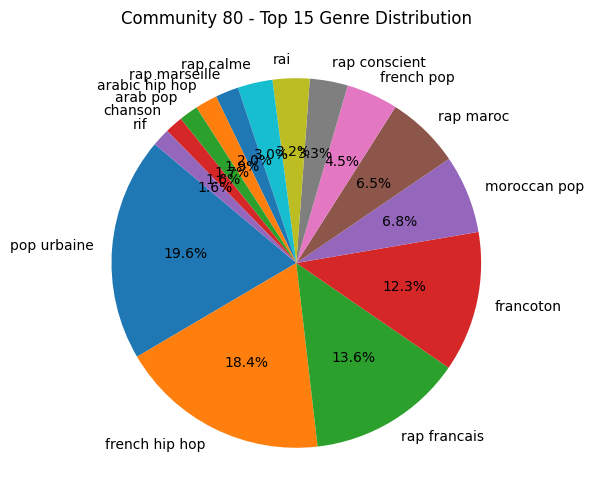

Global clustering coefficient for Community 80: 0.2500790480271541
Diameter for Community 80: 10
Density for Community 80: 0.019985765672187277

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.021520068721644955

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.018759688360977706

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.019581048347286446

Edge count: 3117
Node count: 559
k = 12
Comparable regular lattice diameter: 47
Comparable regular lattice global clustering: 0.6818181818181818


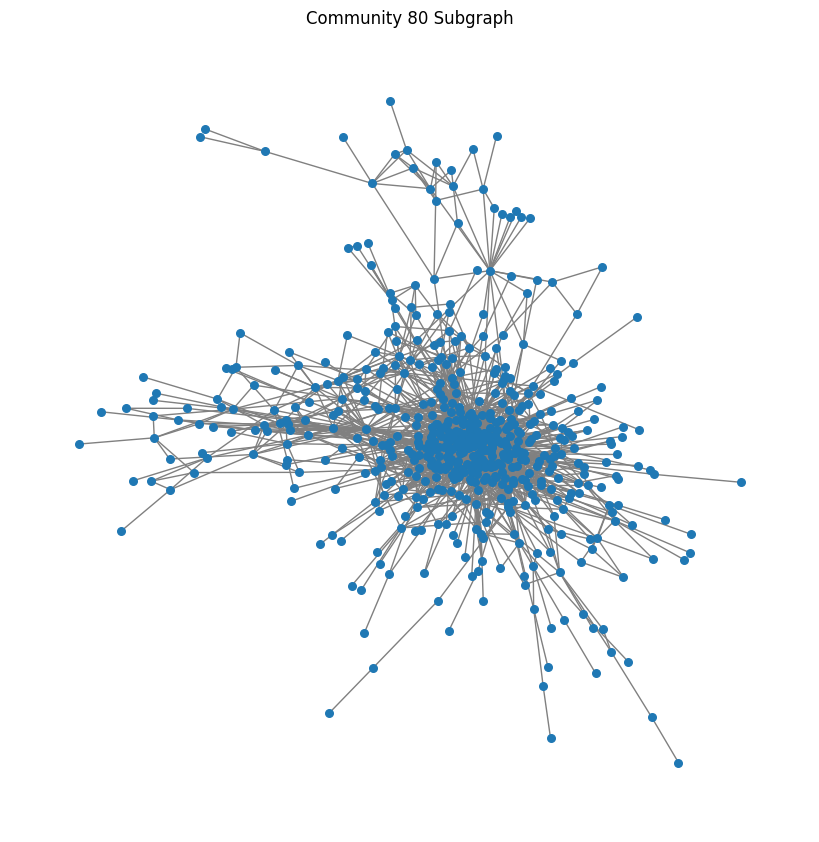

Artists in Community 59:
- Pets Tseng
- Chantel 姚焯菲
- Vincent Wong
- Justin Lo
- Edan 呂爵安
- 艾薇
- Cath Wong
- Dave Wong
- Hello Nico
- JC 陳詠桐
- Yamazaru
- Rosie Yang
- 洪杰
- 馬念先
- 王ADEN
- Tyson Yoshi
- Yen-J
- Jacky Cheung
- Pakho Chau
- Robynn & Kendy
- Def Tech
- Macdella
- NICKTHEREAL
- Angela Hui
- 梁釗峰
- Stefanie Sun
- Feanna Wong
- Luantan Ascent
- Diana Wang
- CHEHON
- EggPlantEgg
- MC HotDog
- Tiab
- R.O.O.T
- Supper Moment
- Julia Wu
- Charlene Choi
- Phil Chang
- SOPHY
- TANK 呂建忠
- S.H.E
- Butterfly Chien
- Koala Liu
- Matzka
- Nan Quan Mama
- A-Lin
- Keeva Mak
- Cindy Yen
- DJ Didilong
- 大淵 MUTA
- LION
- Kenji Wu
- Di Ma
- Kay Tse
- Wilfred Lau
- 唐貓 SUGARCAT
- Landy Wen
- 老王樂隊
- 黃偉晉
- SG
- Vincy Chan
- HANA
- Yvonne
- WONFU
- 區子琳
- 采子
- Sandy Lam
- Leo Ku
- Cosmos People
- Andrew Tan
- 宋楚琳
- Dizzy Dizzo
- 陳健安
- 蔡明仁
- Harlem Yu
- Kenny Kwan
- Mavis Fan
- Magic Power
- Miriam Yeung
- Ashin Chen
- 新寶島康樂隊
- Serrini
- Jordan Chan
- LaLa Hsu
- J.Arie
- 唐禹哲
- 陳嫺靜
- Crispy脆樂團
- 小男孩樂團
-

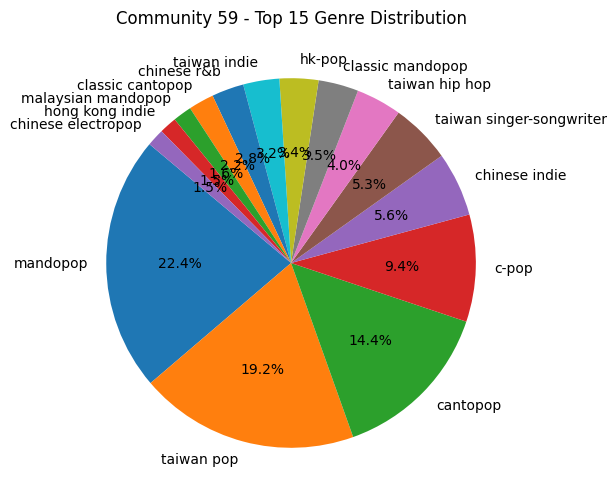

Global clustering coefficient for Community 59: 0.09634387385141532
Diameter for Community 59: 18
Density for Community 59: 0.00808945990958839

Comparable random graph diameter: 11
Comparable random graph global clustering: 0.006209150326797386

Comparable random graph diameter: 10
Comparable random graph global clustering: 0.005788056779246206

Comparable random graph diameter: 10
Comparable random graph global clustering: 0.006698167482481208

Edge count: 884
Node count: 468
k = 4
Comparable regular lattice diameter: 117
Comparable regular lattice global clustering: 0.5


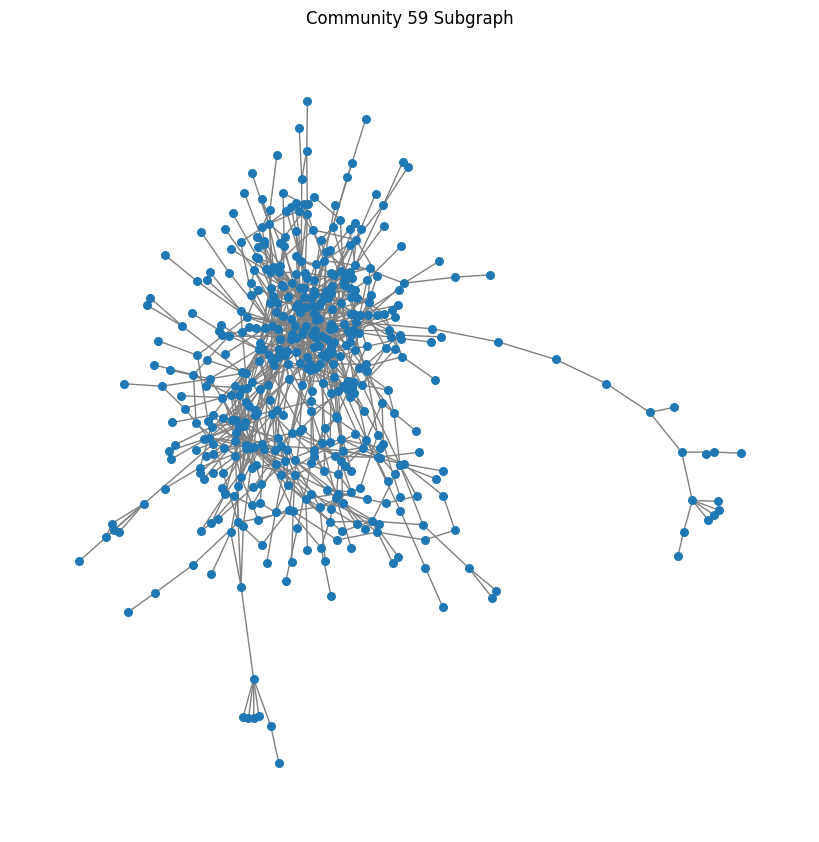

Artists in Community 0:
- Petra
- Turisti
- Danny
- Mokoma
- Kristiina Wheeler
- Marilii
- Setä Tamu
- Mäk Gälis
- Kube
- Suvi Teräsniska
- Andre
- Fatboy L
- Luntti
- Arttu Lindeman
- Anna Eriksson
- Daniel Okas
- Prinssi Jusuf
- Lärvinen
- eetu
- Aste
- OG Ulla-Maija
- The Second Level
- F
- Sani
- Elias Gould
- Roope Salminen
- Lika-Aki
- Juulia
- Juju
- Klass1kko
- Anna Puu
- TheoFuego
- Cavallini
- Pesso
- Klamydia
- Dilemma
- Jemme
- edi
- 2nen
- Kymppilinja
- Töölön Ketterä
- Henriguez
- Nomi
- Tuuli
- 90's FIN Cover Boyz & Girlz!
- Pyhimys
- Pasi ja Anssi
- Erin
- Averagekidluke
- MIRO KANTH
- Haloo Helsinki!
- SONNY
- KUUMAA
- Jesse Kaikuranta
- Sara Siipola
- Kerava
- Jonne Aaron
- Nelma U
- Joe L
- Iisa
- Erika Vikman
- SINI YASEMIN
- Vesta
- Hector
- Portion Boys
- Jimi Pääkallo
- Lahti United
- Konsta
- ANI
- Räpfaija
- Mansesteri
- Ed Caspian
- Sini Sabotage
- Paul Elias
- Samuli Heimo
- Frans Harju
- Julma Henri
- Ellips
- Överi
- Poju
- SHRTY
- Nuppu Oinas
- Satin Circu

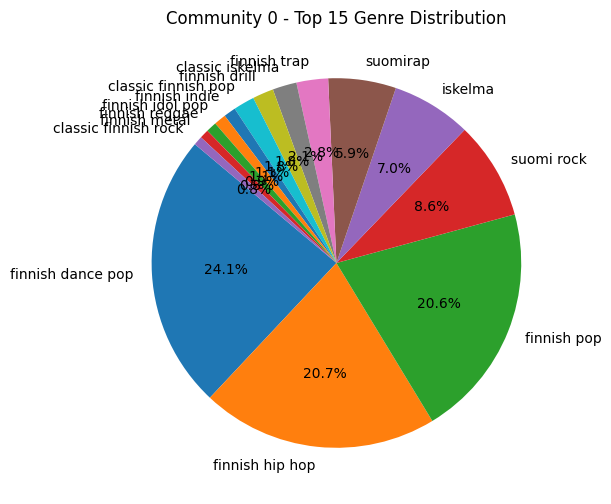

Global clustering coefficient for Community 0: 0.14877116123012127
Diameter for Community 0: 11
Density for Community 0: 0.014788182647799365

Comparable random graph diameter: 6
Comparable random graph global clustering: 0.0165313299116116

Comparable random graph diameter: 7
Comparable random graph global clustering: 0.015513901716731905

Comparable random graph diameter: 6
Comparable random graph global clustering: 0.01665931877199483

Edge count: 1345
Node count: 427
k = 6
Comparable regular lattice diameter: 72
Comparable regular lattice global clustering: 0.6


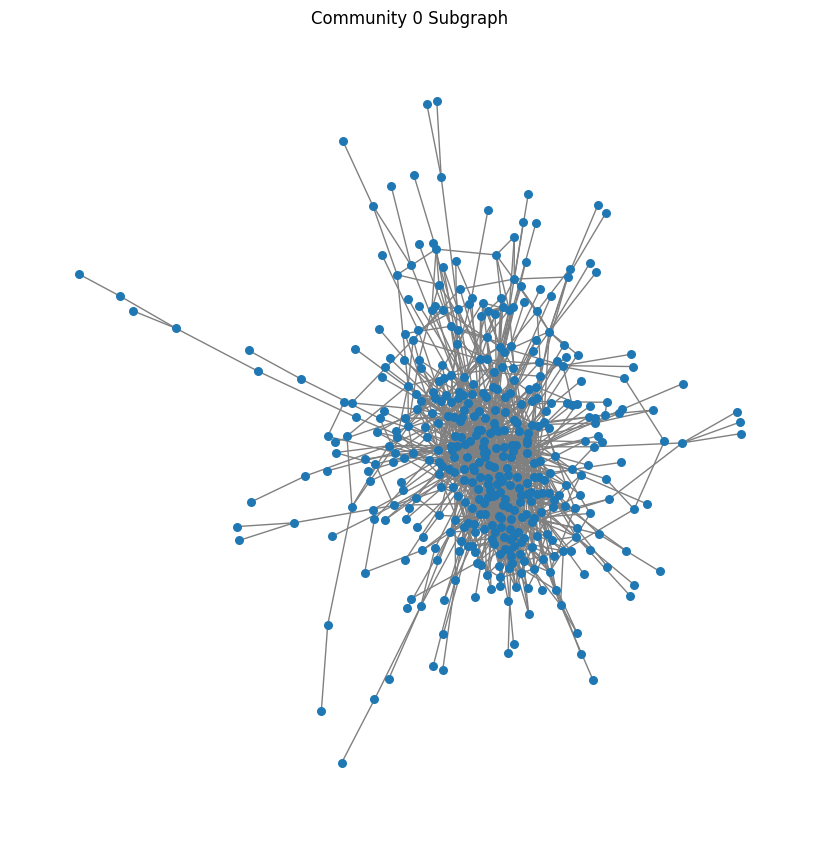

Artists in Community 33:
- Qucee
- Rotjoch United
- Lijpe
- OG3NE
- Trijntje Oosterhuis
- Jericho Rosales
- Bigidagoe
- Quatro Vision
- Suzan & Freek
- Ndee Kundu
- Fatah
- Oathmademedoit
- Moeman
- Ismo
- Sef
- Saaff
- Frsh
- Yung Internet
- Kid de Blits
- Danique
- Adje
- The Boy Next Door
- Figo Gang
- Kav Verhouzer
- Ayoub Maach
- JOJO AIR
- Woody
- Jayh
- Broederliefde
- Spanker
- KILATE TESLA
- Young Ellens
- Jeroen van Koningsbrugge
- Bankzitters
- Emms
- Diaz & Bruno
- Giocatori
- Trobi
- Tino Martin
- 5NAPBACK
- Funk D
- IDA
- Billy The Kit
- Clouseau
- SFB
- The voice of Holland
- Karen Damen
- LA$$A
- Feis
- Def Major
- Koen
- Dyna
- Tabitha
- Narco Polo
- Zoë-Jadha
- Mrabet
- Momi
- Jozo
- Boyce Avenue
- Hef
- GLOWINTHEDARK
- Qlas & Blacka
- DJ D-Train
- DODO
- Bryan Mg
- Remy
- Makkie
- Nick & Simon
- Lucass
- Supergaande
- Turfy Gang
- Kaka
- Pietju Bell
- Mafe
- Aliyah
- The Subs
- Trustt
- Dio
- Tourist LeMC
- Kingsize
- DJ Drivah
- KA
- Dorentina
- Skiezo
- Dopebwoy
- 

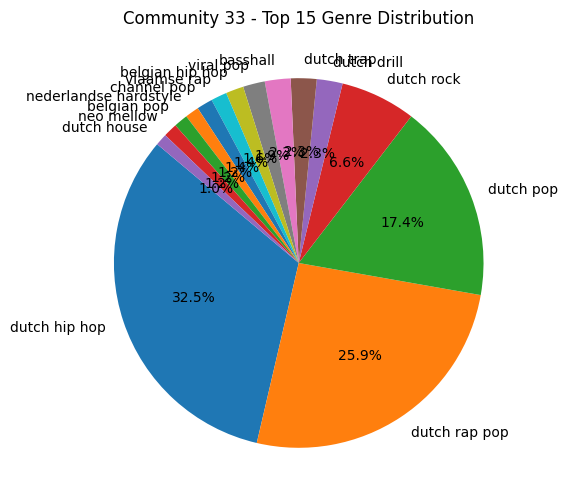

Global clustering coefficient for Community 33: 0.28522425337591206
Diameter for Community 33: 10
Density for Community 33: 0.035005549389567146

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.038003232171137345

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.0342764937957514

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.033516926833663314

Edge count: 3154
Node count: 425
k = 14
Comparable regular lattice diameter: 31
Comparable regular lattice global clustering: 0.6923076923076923


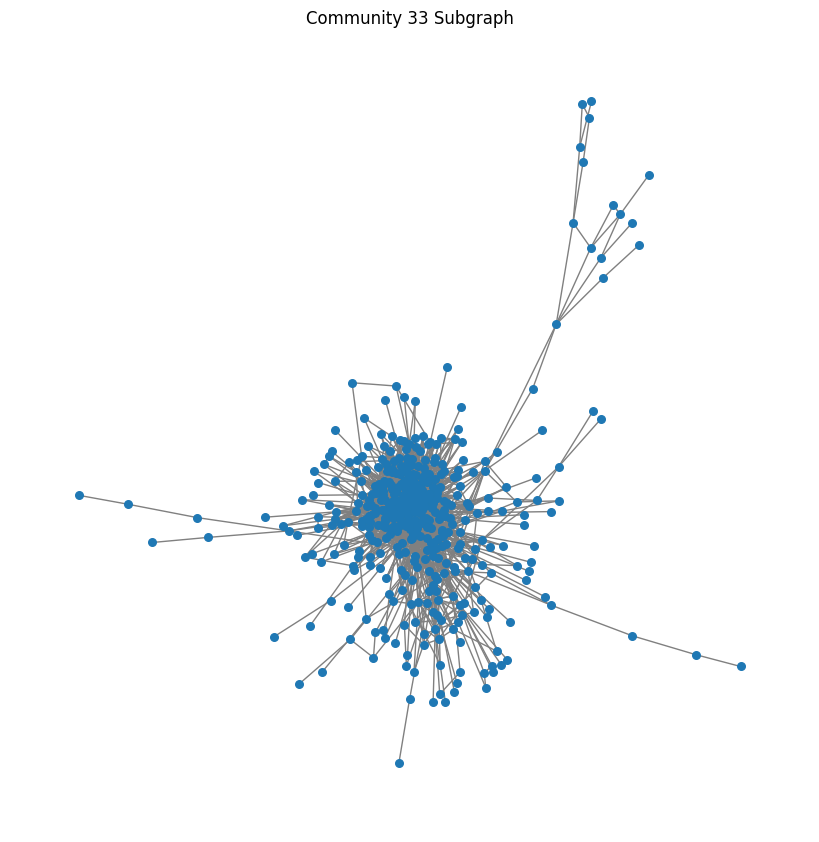

Artists in Community 15:
- Ernia
- Marïna
- Piero Pelù
- Fabrizio Moro
- Luna
- Irene Grandi
- Frah Quintale
- Tecla
- Tommaso Paradiso
- Ermal Meta
- Mango
- Tosca
- Bello Figo
- Fabri Fibra
- FSK SATELLITE
- Dani Faiv
- Carl Brave
- Willie Peyote
- Domiziana
- Zoda
- Noyz Narcos & Fritz Da Cat
- Paolo Jannacci
- Calcutta 
- DANDY TURNER
- Marco Masini
- EXTRALISCIO
- Niko Pandetta
- Loredana Bertè
- Biondo
- Enzo Avitabile
- Venerus
- Mara Sattei
- Gallagher
- Neffa
- Franco Battiato
- Raige
- Mr.Rain
- Nabi
- Frenetik&Orang3
- Cancun
- Jesto
- Daniele Silvestri
- Ornella Vanoni
- Alfa
- Luca Maris
- Noyz Narcos
- SLF
- Federica Carta
- Nayt
- Ditonellapiaga
- Lo Stato Sociale
- Dark Polo Gang
- The Kolors
- Roshelle
- Gli Autogol
- G.bit
- Coez
- ARIETE
- Max Pezzali
- Rondodasosa
- Speranza
- Radical
- NDG
- Alice
- I Cani
- Rocco Hunt
- Subsonica
- Nina Zilli
- SEVEN 7oo
- Nerone
- Simba La Rue
- gIANMARIA
- Inoki
- Dolcenera
- Zano
- Francesco Renga
- Carmen
- Taxi B
- Reggie Mil

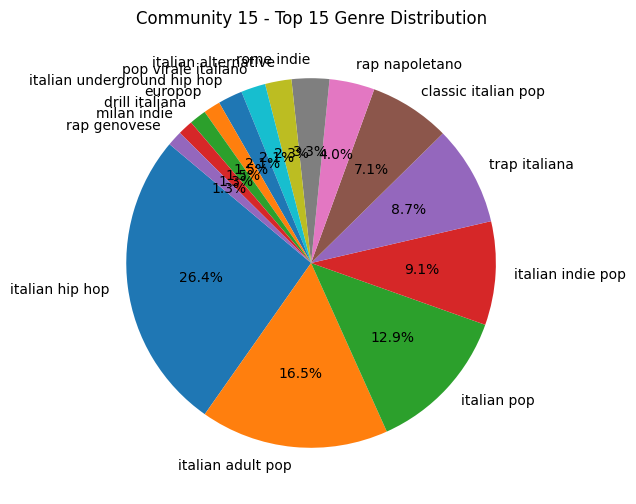

Global clustering coefficient for Community 15: 0.2322361562440574
Diameter for Community 15: 7
Density for Community 15: 0.027614672137188906

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.02602407629171722

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.03255317898169567

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.026825370632720478

Edge count: 2248
Node count: 404
k = 12
Comparable regular lattice diameter: 34
Comparable regular lattice global clustering: 0.6818181818181818


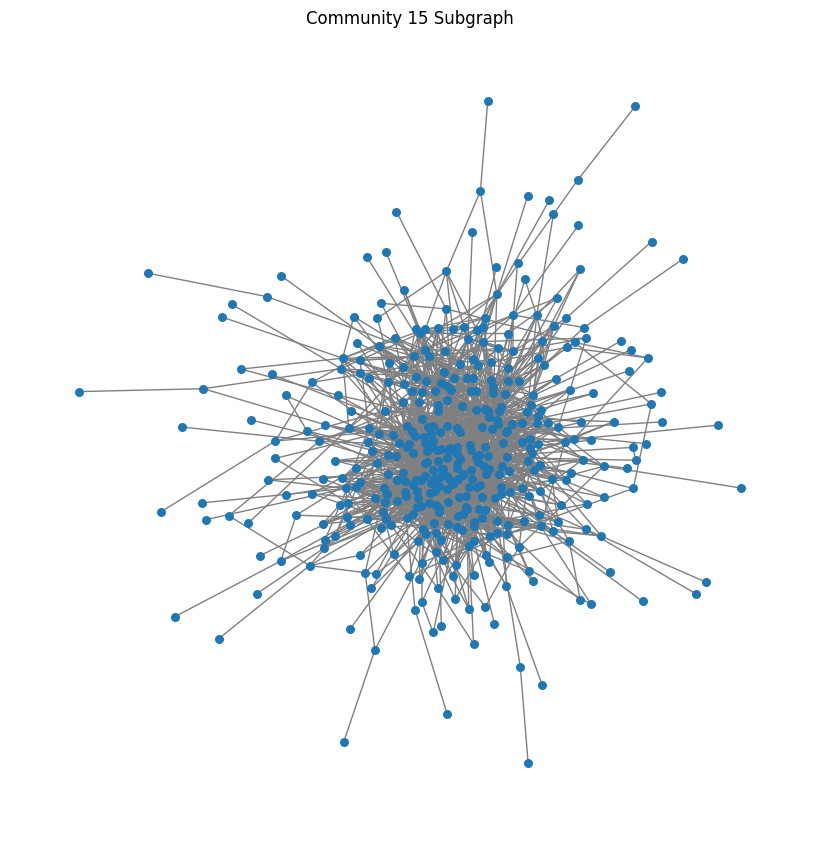

Artists in Community 17:
- Dj. Volkan Uça
- Medusa
- Rümeysa
- Bahadır Tatlıöz
- Kaan Boşnak
- Ziynet Sali
- Zakkum
- Şehinşah
- Ayşegül Aldinç
- Tuğba Yurt
- Ayben
- Ece Seçkin
- Yener Çevik
- Şam
- Elif Kaya
- Yalın
- Hakan Altun
- Rozz Kalliope
- Tuna Kiremitçi
- GOKO!
- Rope
- Berksan
- Aydilge
- Anıl Piyancı
- Gece Yolcuları
- Özgün
- Mustafa Ceceli
- Sehabe
- Sinan Ceceli
- Bossy
- Joker
- Zeynep Baksi Karatağ
- Clower
- Umut Timur
- Cihan Mürtezaoğlu
- GNG
- Asena
- Mehmet Erdem
- Murda
- Canozan
- Zeynep Bastık
- Kezzo
- Erdem Kınay
- Hande Yener
- Can Yüce
- Ayla Dikmen
- Sena Şener
- Gökhan Tepe
- Serdar Ortaç
- Ragheb Alama
- Hypzex
- Funda Arar
- Vega
- No.1
- Pamela
- İrem Derici
- Gökhan Türkmen
- Tuğçe Kandemir
- Sokrat St
- Maestro
- Sezen Aksu
- Turac Berkay
- Bedo
- Bengü
- Şebnem Ferah
- Killa Hakan
- Rafet El Roman
- Bekom
- Ebru Yaşar
- Misha
- Xir
- Ceg
- Sancak
- Asil Slang
- Ahiyan
- Metth
- Bora Duran
- Serkan Kaya
- KÖFN
- Dolu Kadehi Ters Tut
- Farazi
- Yaşar

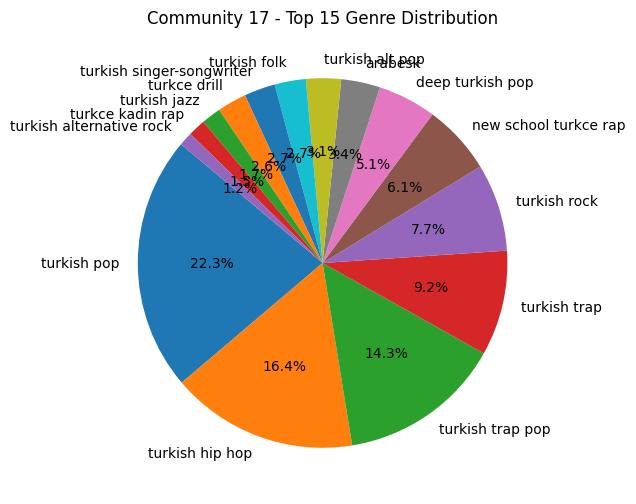

Global clustering coefficient for Community 17: 0.19164262765948406
Diameter for Community 17: 10
Density for Community 17: 0.01700709219858156

Comparable random graph diameter: 6
Comparable random graph global clustering: 0.01700166706815643

Comparable random graph diameter: 7
Comparable random graph global clustering: 0.015268626172881493

Comparable random graph diameter: 7
Comparable random graph global clustering: 0.019613064921375913

Edge count: 1199
Node count: 376
k = 6
Comparable regular lattice diameter: 63
Comparable regular lattice global clustering: 0.6


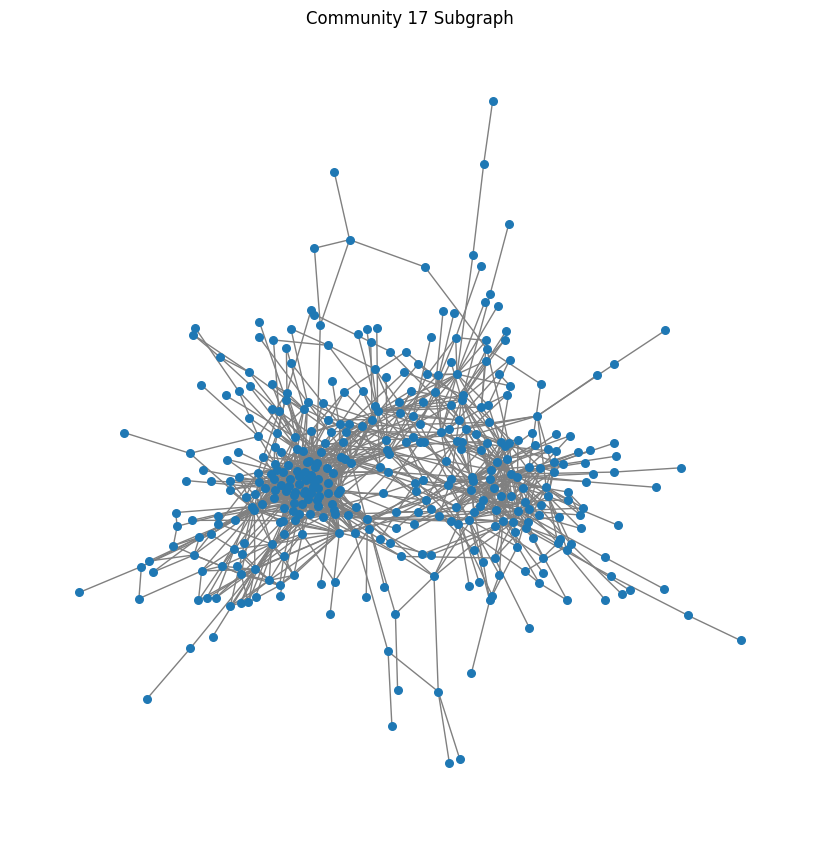

Artists in Community 203:
- SEUNGRI
- natsumi
- IU
- milet
- Paloalto
- 4Minute
- Zion.T
- MIYEON
- AMBER
- AKMU
- meenoi
- Crush
- GIRIBOY
- JEON MI DO
- Sunny Day Service
- Jeff Bernat
- Daichi Miura
- Creep Hyp
- Yang Yoseob
- Ahn Ye Eun
- KOONTA
- Kim MinSeok
- Uru
- Eddy Kim
- So!YoON!
- Sung Si Kyung
- Baek Ji Young
- YUJU
- KYUHYUN
- Ken Hirai
- Tani Yuuki
- Motohiro Hata
- K.Will
- yama
- YOONA
- Tiger JK
- Royal 44
- Yang Da Il
- Rin音
- SALU
- KIMMUSEUM
- Phum Viphurit
- C JAMM
- MAN WITH A MISSION
- ONEW
- SEVENTEEN
- A夏目
- Lim Seul Ong
- AKB48
- Aoi Teshima
- BAEKHYUN
- HIGH4
- PARK JI HOON
- Ryota Fujimaki
- Straightener
- Han Suji
- Sukima Switch
- meiyo
- Solar
- PATEKO
- Ikimonogakari
- Jukjae
- LEX
- MC MONG
- LiSA
- 10cm
- HA SUNG WOON
- KANGDANIEL
- Mom
- Thelma Aoyama
- Crystal Kay
- Junichi Inagaki
- Shinsei Kamattechan
- Yo Hitoto
- back number
- Vanilla Acoustic
- T-ARA
- indigo la End
- John Park
- Mirani
- Taichi Mukai
- kZm
- Ai Otsuka
- iKON
- Hwa Sa
- Raiden


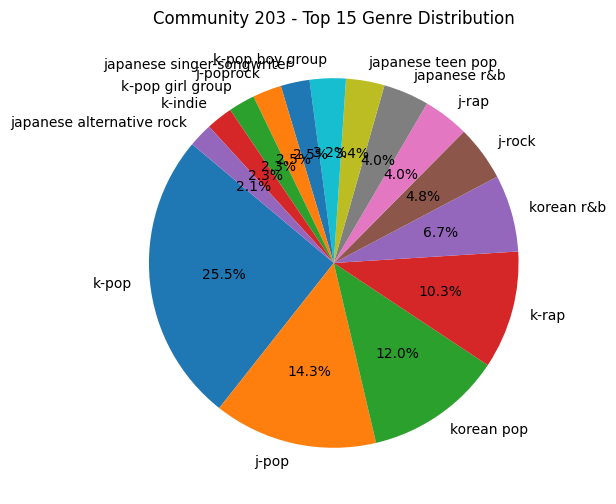

Global clustering coefficient for Community 203: 0.11675156285878044
Diameter for Community 203: 16
Density for Community 203: 0.013788950775252145

Comparable random graph diameter: 7
Comparable random graph global clustering: 0.012569459392663813

Comparable random graph diameter: 8
Comparable random graph global clustering: 0.015907784570737216

Comparable random graph diameter: 8
Comparable random graph global clustering: 0.01344243540376137

Edge count: 916
Node count: 365
k = 6
Comparable regular lattice diameter: 61
Comparable regular lattice global clustering: 0.6


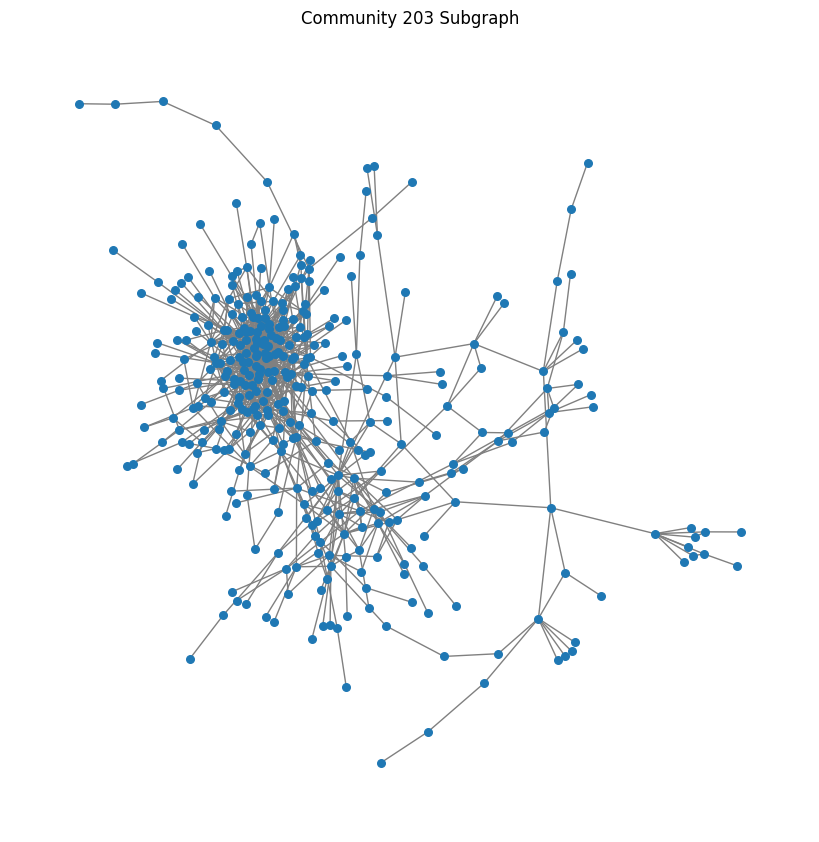

Artists in Community 29:
- Abhay Jodhpurkar
- Raghav Chaitanya
- Renuka Panwar
- Akull
- Afsana Khan
- Jasmine Sandlas
- Vishal Chandrashekhar
- Ali Zafar
- Deepak Blue
- Millind Gaba
- Nitin Mukesh
- Jakes Bejoy
- Navigator
- Jaz Dhami
- Javed-Mohsin
- Jigar Saraiya
- Shankar-Ehsaan-Loy
- Pritam
- Kaam Bhaari
- Dub Sharma
- Varinder Brar
- Arjan Dhillon
- Sumit Goswami
- Rochak Kohli
- Gajendra Verma
- Garry Sandhu
- Lijo George
- MC STAN
- Sarath Santosh
- Adel Ebrahim
- VA
- Nikhita Gandhi
- Achint
- Zaeden
- Manan Bhardwaj
- King
- Amrita Singh
- Udit Narayan
- Sunil Kamath
- Meet Bros.
- Arunraja Kamaraj
- TUSHAR JOSHI
- Hommie Dilliwala
- Amrinder Gill
- Axel Thesleff
- Siddharth Basrur
- Sweetaj Brar
- Sidhu Moose Wala
- Shreya Ghoshal
- Chinmayi
- Mohit Chauhan
- Nakash Aziz
- Avvy Sra
- Mika Singh
- Lisa Mishra
- Rahul Sipligunj
- Rashid Ali
- Shooter Kahlon
- Dhibu Ninan Thomas
- Jyotica Tangri
- Ranjit Bawa
- Vishal
- Naezy
- Neha Nair
- Arun Chiluveru
- Sanjay Leela Bhansal

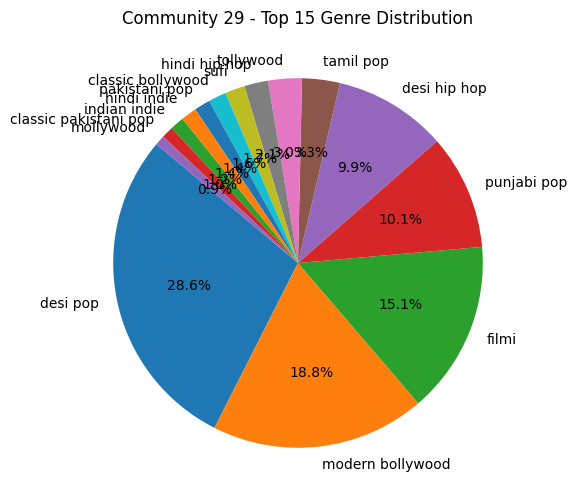

Global clustering coefficient for Community 29: 0.270786811472866
Diameter for Community 29: 8
Density for Community 29: 0.042336021681638365

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.04502814074509199

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.043254016058012705

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.0431371573472905

Edge count: 1937
Node count: 303
k = 12
Comparable regular lattice diameter: 26
Comparable regular lattice global clustering: 0.6818181818181818


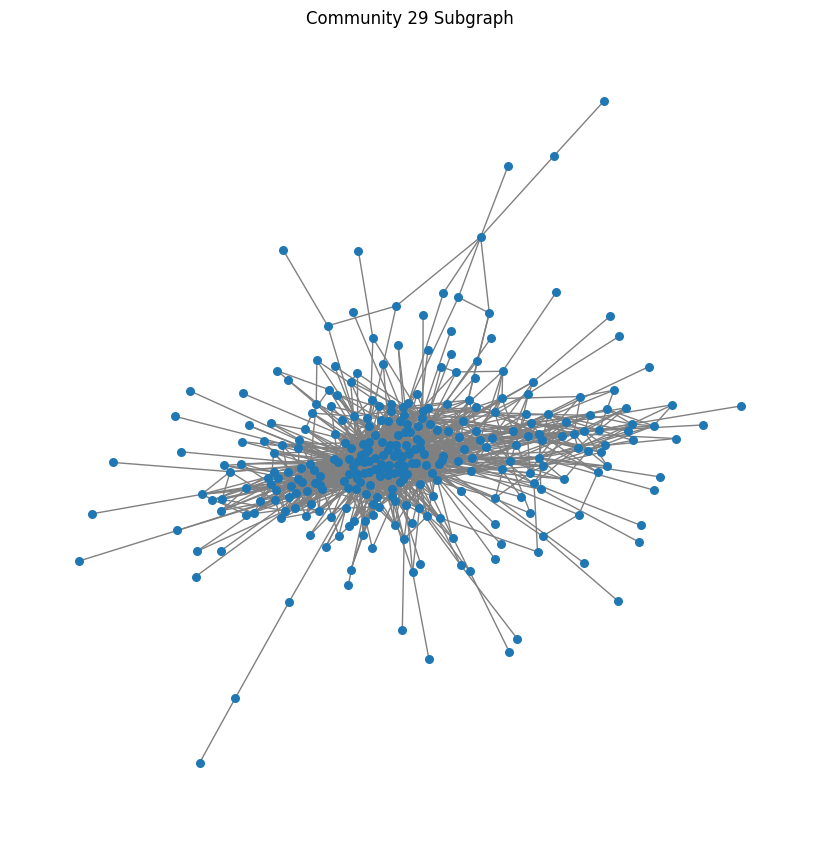

Artists in Community 11:
- Horkýže Slíže
- Jana Kirschner
- Dominika Mirgova
- Fobia Kid
- Amco
- Emily & Justice
- Martin Agh
- Sanna Nielsen
- DJ Kadr
- Kruel
- Forgen
- Rein Alexander
- Peter Pann
- Loko Loko
- Kapitán Demo
- HILLS 97
- Dan Bárta
- Dame
- TKX
- WEN
- XINDL X
- Hana Zagorová
- Sabaton
- Lars-Erik Larsson
- nan
- Rybičky 48
- Alan Menken
- Momo
- Poetika
- Floor Jansen
- DeepThought
- Michal Dočolomanský
- Koky
- Cico Band
- Sheen & Jickson
- Nerieš
- Tři Sestry
- Václav Neckář
- Ludovico Einaudi
- Anders Glenmark
- Lukáš Adamec
- Vec
- Tarja
- Rytmus
- Aneta Langerová
- Lucie Bílá
- P.A.T.
- Desmod
- Logic
- Sebastian
- John Williams
- Yzomandias
- Rest
- KHANS
- Pil C
- Grey256
- Dario Moreno
- Marpo
- Skelly
- Decky
- Sima Martausová
- Labello
- BYU Vocal Point
- John Tesh
- Michal Hruza
- Hugo Toxxx
- P T K
- Sensey
- Dano Kapitán
- Frank Wild
- Cocoman
- Robo Opatovsky
- Katie Melua
- Neno
- Frayer Flexking
- Cavalier
- The Others
- Mike Oldfield
- JCKPT
- Johny 

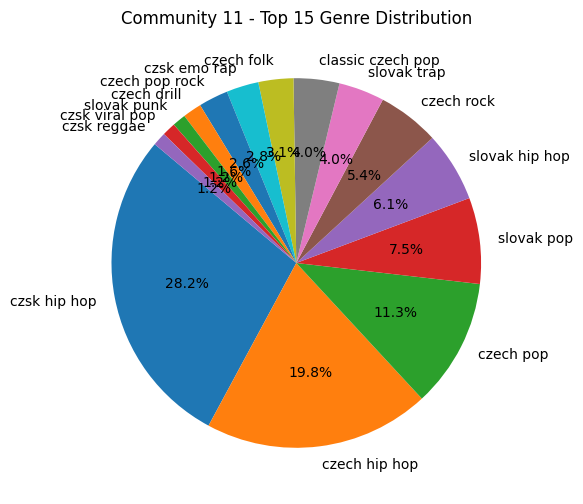

Global clustering coefficient for Community 11: 0.25842909738553077
Diameter for Community 11: 12
Density for Community 11: 0.02676056338028169

Comparable random graph diameter: 6
Comparable random graph global clustering: 0.034434979651697915

Comparable random graph diameter: 6
Comparable random graph global clustering: 0.0281426869197767

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.026739111135395965

Edge count: 1083
Node count: 285
k = 8
Comparable regular lattice diameter: 36
Comparable regular lattice global clustering: 0.6428571428571429


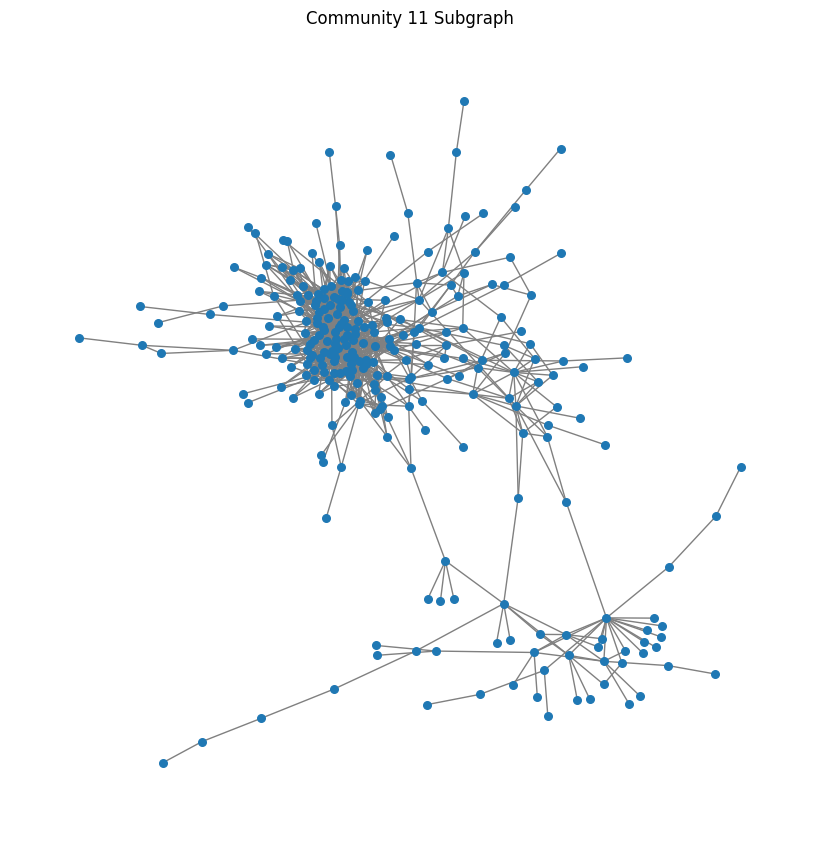

Artists in Community 709:
- Ильич да Софья
- CAPTOWN
- shadowraze
- BOOKER
- HammAli
- Vitya AK
- FACE
- VELIAL SQUAD
- хочуспать
- Nyusha
- Max Hurrell
- Молодой Платон
- Xcho
- Tyler Bates
- Платина
- Ruki Vverh!
- IOWA
- Нервы
- The Hatters
- Сёстры
- Magnum Opus
- ALIZADE
- Шайни
- Arut
- КОСМОНАВТОВ НЕТ
- Malbec
- LIZER
- Truwer
- DJ SMASH
- дипинс
- Husky
- ZOLOTO
- 25/17
- Poshlaya Molly
- Dxrk ダーク
- Timati
- Diskoteka Avariya
- Александр Гудков
- HENSY
- Mnogoznaal
- LOBODA
- Monetochka
- MONEYKEN
- VISXGE
- HEALTH
- The Citizens of Halloween
- White Punk
- THRILL PILL
- akha
- Ivan Dorn
- Pharmacist
- Mikhail Shufutinsky
- Tima Belorusskih
- Boulevard Depo
- ONUKA
- MAX BARSKIH
- Lesha Svik
- SHADXWBXRN
- zhanulka
- Andro
- CREAM SODA
- Jah Khalib
- INSTASAMKA
- ELMAN
- SHTERN
- Sorry Jesus
- DK
- Кореш
- Anacondaz
- MC ORSEN
- Clonnex
- Куок
- Navai
- Niman
- NLO
- Mav-d
- DAVA
- uniqe
- Милана Хаметова
- FrozenGangBeatz
- NILETTO
- G4OUR
- Mumiy Troll
- MiyaGi
- Andy Panda
-

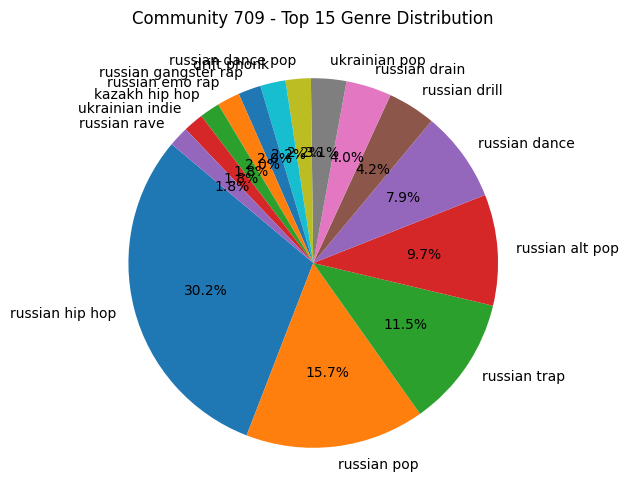

Global clustering coefficient for Community 709: 0.1838382599993919
Diameter for Community 709: 14
Density for Community 709: 0.019509281839446575

Comparable random graph diameter: 6
Comparable random graph global clustering: 0.02324522748551017

Comparable random graph diameter: 8
Comparable random graph global clustering: 0.023679860827748152

Comparable random graph diameter: 6
Comparable random graph global clustering: 0.027854375726716153

Edge count: 784
Node count: 284
k = 6
Comparable regular lattice diameter: 48
Comparable regular lattice global clustering: 0.6


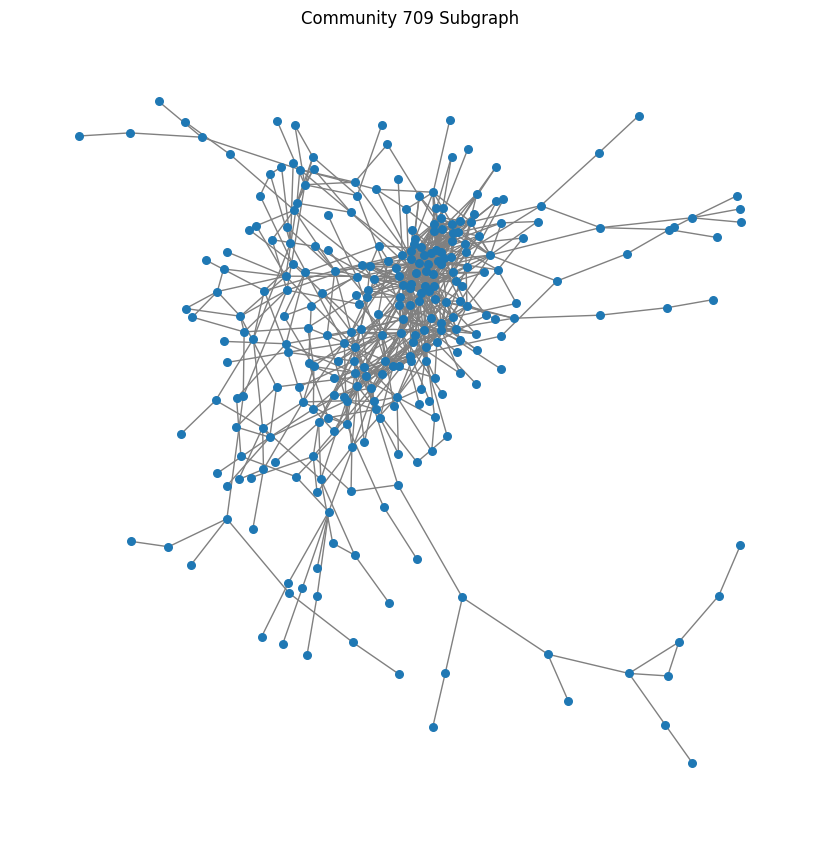

Artists in Community 4:
- Trill Pem
- Margaret
- Jacuś
- Tember Blanche
- Kamerzysta
- Pusher
- Solar
- Gromee
- Quebonafide
- Kuki
- MOZGI
- Anna Wyszkoni
- Kayah
- Oki
- Miyo
- Urszula
- Maciej Musiałowski
- Donguralesko
- PROBASS ∆ HARDI
- Zeamsone
- Brennan Savage
- Japczan
- White Widow
- BORCREW
- Reto
- Piotr Zioła
- Maciej Zielinski
- Buka / Rahim
- White 2115
- Deemz
- Waima
- 2115
- Natalia Szroeder
- Małpa
- Kubi Producent
- Abel de Jong
- Louis Villain
- Malik Montana
- schafter
- Tulia
- Borixon
- Ania Dabrowska
- Sara James
- Mate.O
- Qbik
- Muniek Staszczyk
- SKUTE BOBO
- Kali
- Zdechły Osa
- Olszakumpel
- Popkiller Młode Wilki
- Ralph Kaminski
- Tromba
- Dj.Frodo
- Julia Rocka
- Favst
- Kamil Bednarek
- Natalia Nykiel
- Tribbs
- Bibič
- Taco Hemingway
- Kaśka Sochacka
- Dawid Kwiatkowski
- Białas
- FRIZ
- Gruby AK47
- Mlodyskiny
- Łona I Webber
- Paweł Domagała
- Otsochodzi
- Zeju POG
- Męskie Granie Orkiestra 2022
- Płomień 81
- Kinny Zimmer
- Oliwka Brazil
- Zeppy Zep

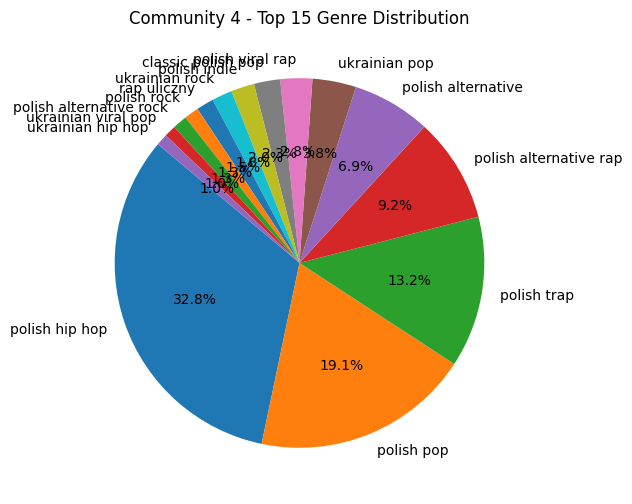

Global clustering coefficient for Community 4: 0.2243724330219775
Diameter for Community 4: 10
Density for Community 4: 0.03467720685111989

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.03158187424491773

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.03529740252717773

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.03745106568922022

Edge count: 1316
Node count: 276
k = 10
Comparable regular lattice diameter: 28
Comparable regular lattice global clustering: 0.6666666666666666


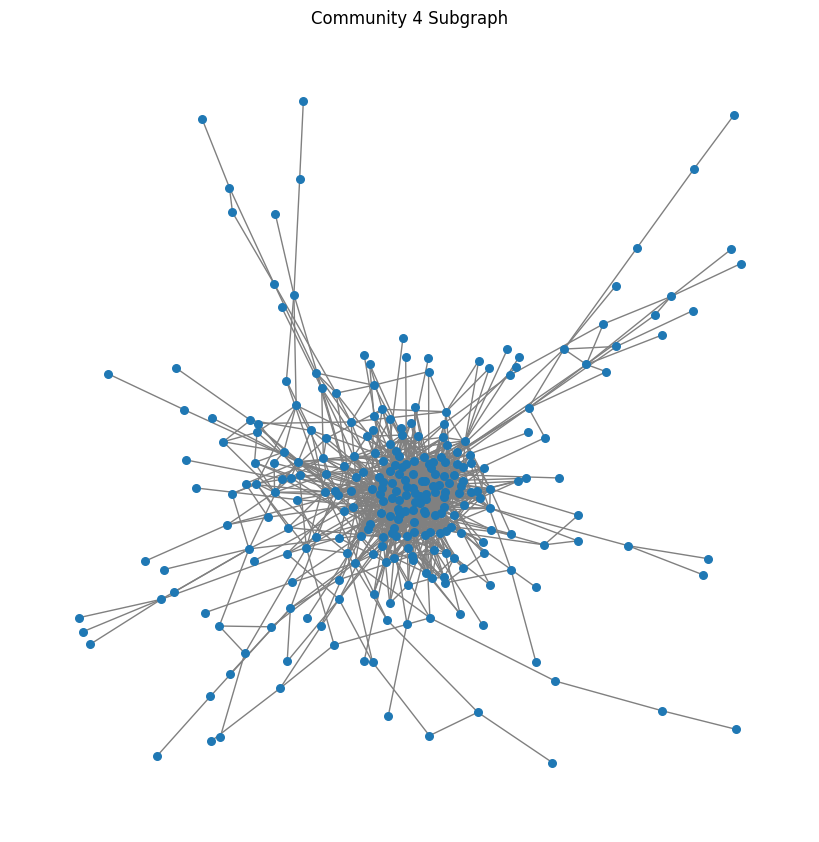

Artists in Community 39:
- Tzanca Uraganu
- Toni Storaro
- Galena
- Ioana Ignat
- DENIS TEOFIKOV
- Iuliana Beregoi
- MBT
- Alex Robov
- DARA
- Satra B.E.N.Z.
- Milioni
- Djena
- Timebelle
- Florian Rus
- PAMELA
- Gocata Kangal
- Pascal Junior
- Emilian
- Culita Sterp
- Marko Glass
- El Nino
- Roxen
- MurdaBoyz
- Smiley
- Berechet
- Dim4ou
- Medi
- Milko Kalaydzhiev
- Andrea
- Dani Mocanu
- Marso
- Doddy
- Ustata
- Galin
- ghosty punk
- Emanuela
- Boris Dali
- Costel Biju
- Pavell & Venci Venc'
- F.O.
- Boro Purvi
- Billy Hlapeto
- Costel Biju
- Fly Project
- Fiki
- Tzanca Uraganu
- Itzo Hazarta
- Parazitii
- Juno
- Ian
- Anelia
- Alina Eremia
- George Talent
- Alberto Grasu
- Yung Mici
- Azis
- Alex Velea
- Jluch
- Gery-Nikol
- The Motans
- Alisia
- Alex & Vladi
- Niku X Aron
- Mom4eto
- Petre Stefan
- OG Eastbull
- PAX Paradise Auxiliary
- Petre Stefan
- Lidia Buble
- Tedi Aleksandrova
- Basshunter
- Bogdan DLP
- Dan Balan
- Mihaela Fileva
- Plamen & Ivo
- Eva-Marty
- Theo Rose
- Jado

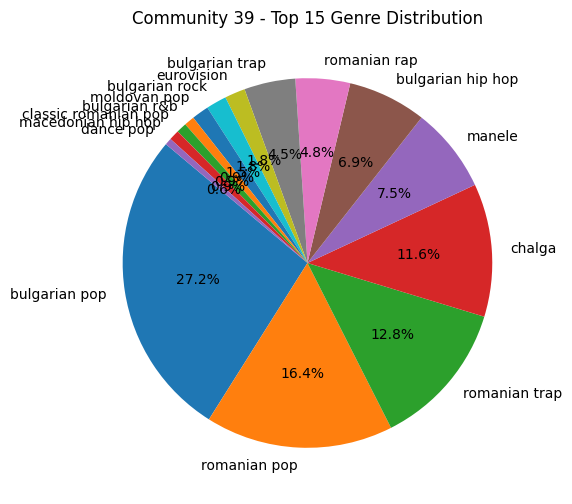

Global clustering coefficient for Community 39: 0.23800889299024708
Diameter for Community 39: 11
Density for Community 39: 0.02424600827912478

Comparable random graph diameter: 6
Comparable random graph global clustering: 0.016596408169441877

Comparable random graph diameter: 6
Comparable random graph global clustering: 0.02191217303999259

Comparable random graph diameter: 7
Comparable random graph global clustering: 0.02410652185933085

Edge count: 861
Node count: 267
k = 6
Comparable regular lattice diameter: 45
Comparable regular lattice global clustering: 0.6


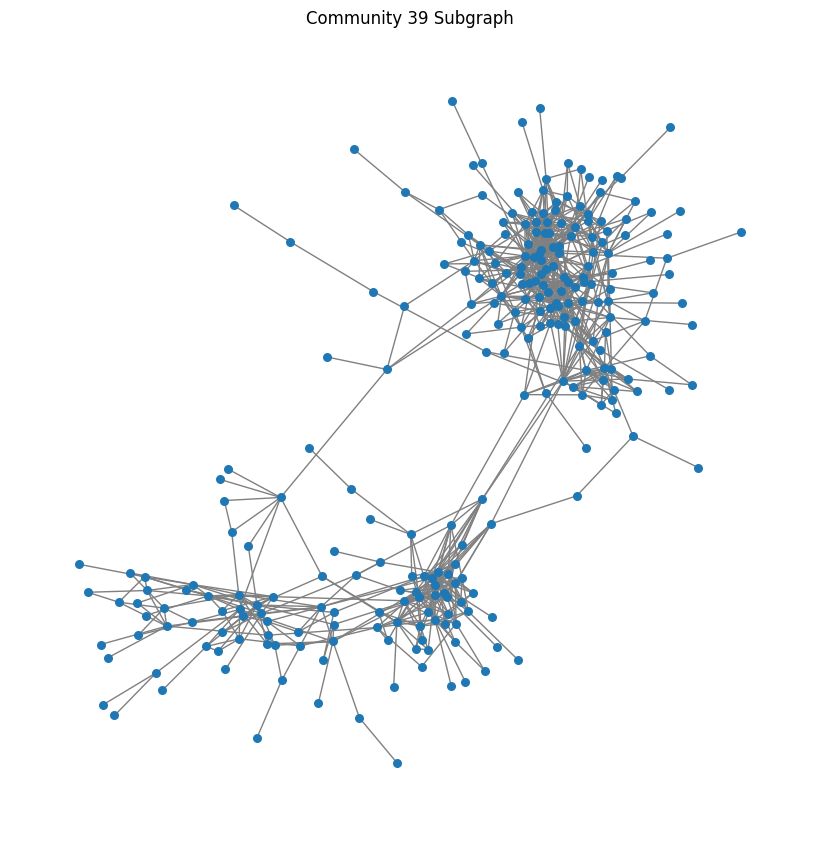

Artists in Community 34:
- Đức Phúc
- Dai Nhan
- Truc Nhan
- Rtee
- Quang Hùng MasterD
- JustaTee
- RAP VIỆT
- Ngơ
- 16 Typh
- Tóc Tiên
- Khoi My
- Miu Lê
- Hoà Minzy
- The Sheep
- Blondie
- Lyly
- Big Daddy
- Lệ Quyên
- My Anh
- SPACESPEAKERS
- Da LAB
- Alma
- Táo
- Bùi Anh Tuấn
- Mr T
- Vicky Nhung
- Khói
- VY Jacko
- Thu Minh
- Quoc-Bao
- Vu Cat Tuong
- Ai Phuong
- Nguyen Ha
- Văn Mai Hương
- traitimtrongvang
- B-OK
- HuyR
- Jun Phạm
- buitruonglinh
- Suboi
- Sol7
- Ngọt
- Phạm Toàn Thắng
- Lê Hiếu
- Mỹ Linh
- Touliver
- Khoi Vu
- Quân A.P
- Pháo
- Masew
- Hoài Lâm
- Sean
- nân
- Ira Losco
- Ung Hoang Phuc
- Phuc Du
- Juky San
- TRANG
- Masiu
- 黃齡
- Phuong Ly
- T.R.I
- Freak D
- Wxrdie
- Cao Thai Son
- Michela
- Khac Viet
- Wanbi Tuan Anh
- Osad
- Bằng Kiều
- Ngô Anh Đạt
- Suni Hạ Linh
- Đen
- Karik
- Hồ Quang Hiếu
- Phuong Linh
- Phan Mạnh Quỳnh
- Phạm Nguyên Ngọc
- Mỹ Tâm
- GREY D
- Tăng Duy Tân
- Tien Cookie
- Wowy
- PC
- VSTRA
- Orange
- Bảo Thy
- Freaky
- RPT MCK
- W/N
- Hoang 

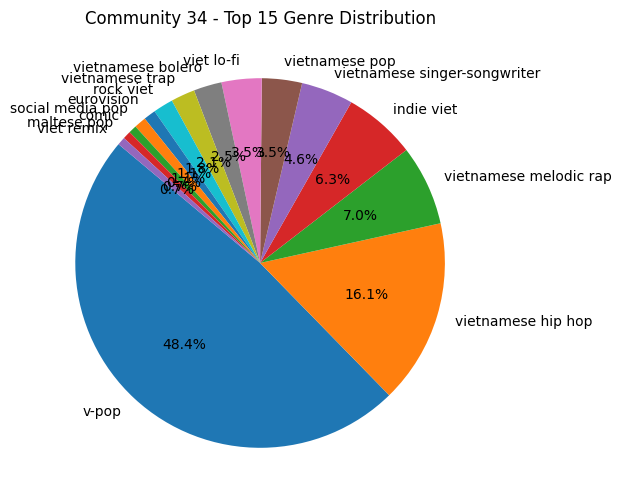

Global clustering coefficient for Community 34: 0.12924129149175728
Diameter for Community 34: 10
Density for Community 34: 0.02007404360345537

Comparable random graph diameter: 9
Comparable random graph global clustering: 0.017710371819960862

Comparable random graph diameter: 7
Comparable random graph global clustering: 0.036173145850565205

Comparable random graph diameter: 7
Comparable random graph global clustering: 0.02874286773369342

Edge count: 488
Node count: 221
k = 4
Comparable regular lattice diameter: 56
Comparable regular lattice global clustering: 0.5


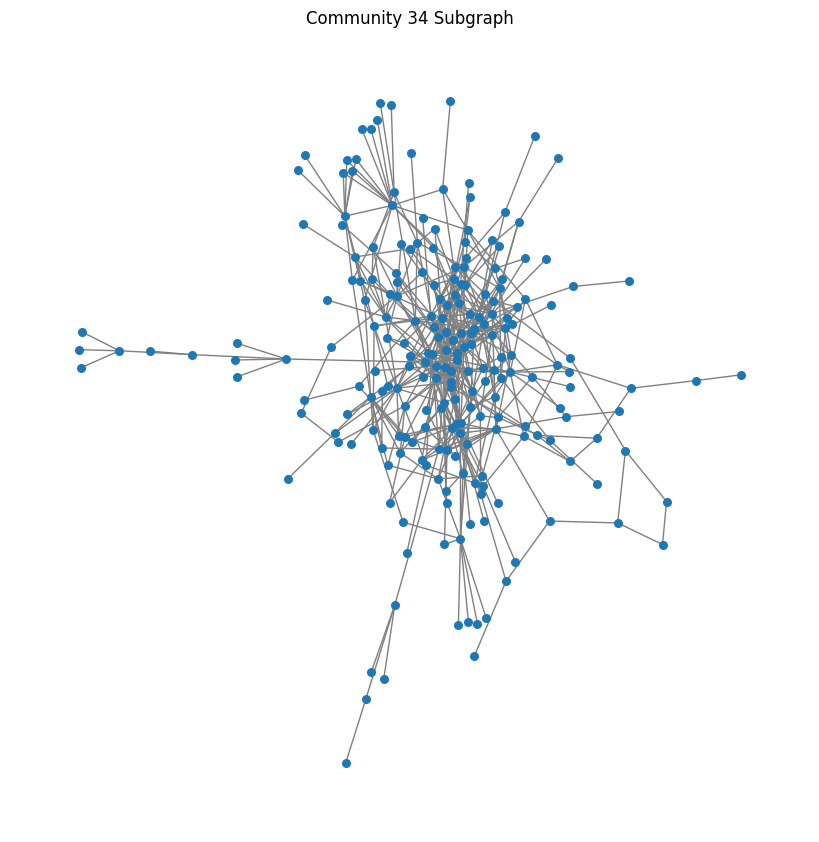

Artists in Community 54:
- DJ Tune
- Mad Clip
- Tzamal
- EPITHE
- Mente Fuerte
- Ggreco
- Th Mark
- Aias
- Billy Sio
- Aspa
- SALVA
- Kings
- TOQUEL
- Sin Laurent
- Baghdad
- George Dalaras
- Panos Kiamos
- Sin Boy
- KG
- Lil PoP
- Lau Jr
- Claydee
- Thitis
- Ripen
- Wang
- Anastasios Rammos
- Grazia Di Michele
- Rina
- Khay Be
- TSE
- Sin Boy
- ATC Taff
- Despina Vandi
- Zoro&Buzz
- Raps On The Run
- Konstantinos Argiros
- Flare
- GAB
- Yanni Bravo
- Michalis Hatzigiannis
- Diablo
- Ilias Vrettos
- Lil Koni
- Dennis Green
- FLY LO
- Mani
- Rein van Duivenboden
- Yolte
- Popayedi
- Block 93
- Lindo
- Display
- Natasha Kay
- RICTA
- Josephine
- ItsOnlySkillz
- Alcatrash
- Panos Mouzourakis
- Spine
- Ν.Ο.Ε.
- Novel 729
- Mariotube Doody
- Xenia Ghali
- 12os Pithikos
- Karpouzis
- HGEMONA$
- Slogan
- Ofili
- Helena Paparizou
- Κako
- Dj The Boy
- Efta
- Giorgos Papadopoulos
- Negros Tou Moria
- Gio Melody
- Immune
- Jitano
- VLOSPA
- Vasilis Karras
- Sophia
- Christos Mastoras
- WNCfam
- 

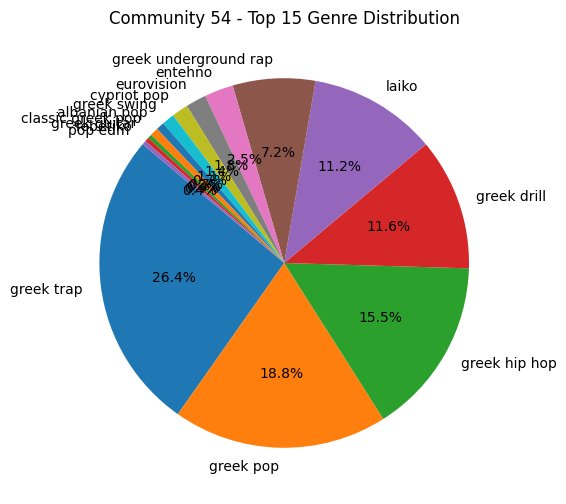

Global clustering coefficient for Community 54: 0.26878222098184545
Diameter for Community 54: 9
Density for Community 54: 0.03679848448969927

Comparable random graph diameter: 6
Comparable random graph global clustering: 0.0385219958035492

Comparable random graph diameter: 6
Comparable random graph global clustering: 0.03553305949079793

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.03814966047975756

Edge count: 777
Node count: 206
k = 8
Comparable regular lattice diameter: 26
Comparable regular lattice global clustering: 0.6428571428571429


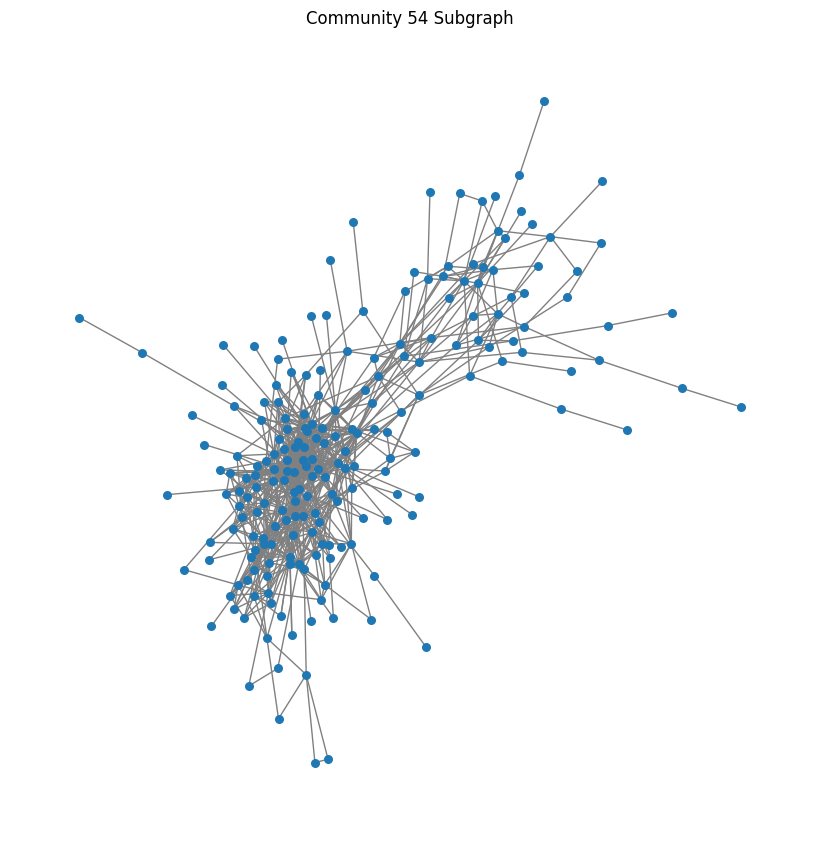

Artists in Community 20:
- TDK Macassette
- Musketeers
- Mi Casa
- Major League Djz
- Appel
- Emtee
- Da Les
- Mapara A Jazz
- Emotionz DJ
- Gaba Cannal
- Hanujay
- Yanga Chief
- Mr JazziQ
- Early B
- Black Coffee
- DJ Stokie
- Dinky Kunene
- Steve Hofmeyr
- Sjava
- Nkulee501
- Young Stunna
- William Last KRM
- Nomfundo Moh
- DJ Sumbody
- Villosoul
- Lebza TheVillain
- Dlala Regal
- Wanitwa Mos
- Cyfred
- Lwah Ndlunkulu
- DJ Cleo
- Tyler ICU
- Kelly Khumalo
- TuksinSA
- Kwesta
- Daliwonga
- Djy Zan SA
- Aymos
- Bernice West
- Jub Jub
- Tellaman
- 9umba
- Soweto's Finest
- Big Zulu
- Nasty C
- Uncle Waffles
- Luu Nineleven
- Zoocci Coke Dope
- Jobe London
- KayGee DaKing
- Vetkuk
- Vigro Deep
- Lady Du
- HENNYBELIT
- JazziDisciples
- Tee Jay
- Mellow & Sleazy
- The Lowkeys
- DJ Big Sky
- Droomsindroom
- UNLIMITED SOUL
- Riky Rick
- Dlala Thukzin
- Ami Faku
- Snotkop
- Musa Keys
- Mas Musiq
- MashBeatz
- Alfa Kat
- K.O
- DJ Hlo
- Teejay
- Biggy
- Pabi Cooper
- Kabza De Small
- KDDO
- Dj 

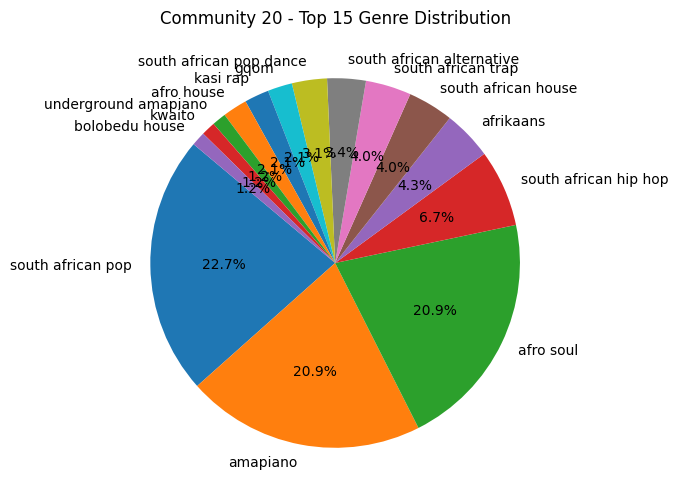

Global clustering coefficient for Community 20: 0.2586445033614655
Diameter for Community 20: 12
Density for Community 20: 0.04295354908625191

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.046588339344600264

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.05083166202851701

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.038655376526663655

Edge count: 872
Node count: 202
k = 8
Comparable regular lattice diameter: 26
Comparable regular lattice global clustering: 0.6428571428571429


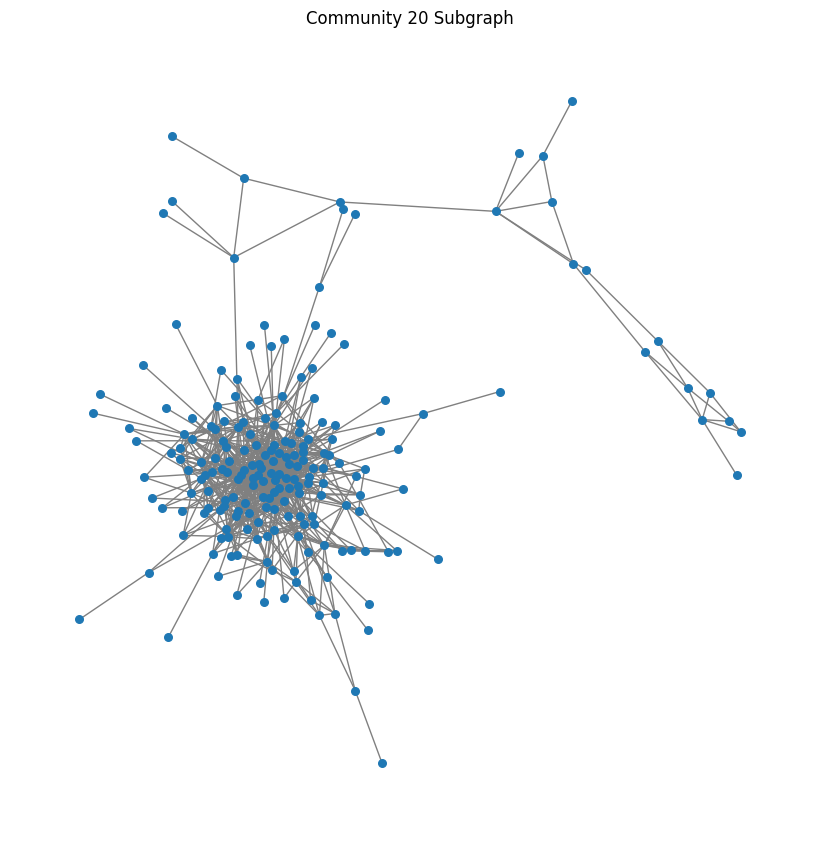

Artists in Community 22:
- Kór Öldutúnsskóla
- Egill Ólafsson
- Venjulegir Gaurar
- Kjartan Ólafsson
- Bigtoy & Stender
- Montaigne
- Sigríður Beinteinsdóttir
- krassasig
- Luigi
- Birnir
- Björgvin Halldórsson
- Rúnar Eff
- Svala
- Daniil
- ClubDub
- Albatross
- Hreimur
- Bassi Maraj
- Plasticboy
- M Can
- September
- FLUGFÉLAGIÐ
- Daughters of Reykjavík
- GCD
- Sigurður Guðmundsson
- Emilíana Torrini
- Doctor Victor
- SZK
- Andrea Gylfadóttir
- Greta Salóme
- Villi Neto
- Friðrik Ómar
- Huginn
- Ouse
- Laddi
- Jón Jónsson
- Ingi Bauer
- Fjallabræður
- Helgi B
- Skítamórall
- Ragga Gröndal
- THØR
- Ragnar Bjarnason
- Birgitta Haukdal
- Stuðlabandið
- Rikard Nordraak
- Shakespeare verður ástfanginn
- Hulda Björk Garðarsdóttir
- FM95BLÖ
- Skálmöld
- Hatari
- Sælan
- BLAFFI
- Sdóri
- Bjartmar Guðlaugsson
- HÚGÓ
- Júlí Heiðar
- XXX Rottweiler hundar
- Egill Stolz
- Vilhjálmur Vilhjálmsson
- Iceland Symphony Orchestra
- Hjálmar
- Gústi B
- Sigga Beinteins
- Floni
- Haki
- JóiPé
- Moses Hig

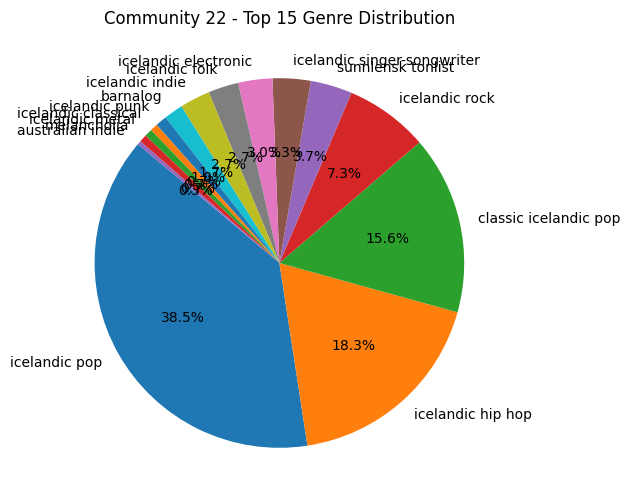

Global clustering coefficient for Community 22: 0.16101912733743132
Diameter for Community 22: 9
Density for Community 22: 0.023205221174764323

Comparable random graph diameter: 8
Comparable random graph global clustering: 0.018103523460666317

Comparable random graph diameter: 9
Comparable random graph global clustering: 0.01993424673837045

Comparable random graph diameter: 6
Comparable random graph global clustering: 0.031217938547781477

Edge count: 448
Node count: 197
k = 4
Comparable regular lattice diameter: 50
Comparable regular lattice global clustering: 0.5


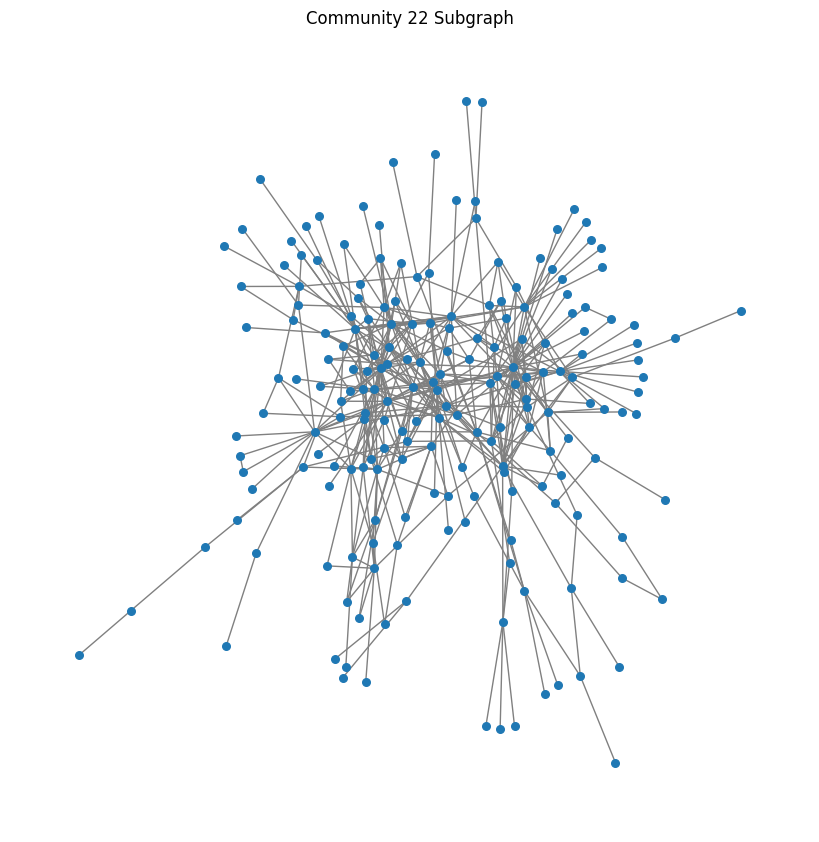

Artists in Community 53:
- Yung Filly
- Kojo Funds
- Fekky
- Lisi
- Dappy
- Not3s
- Kenny Allstar
- OFB
- M24
- Bina Butta
- MIST
- Cadet
- Private Zero
- Liilz
- Dave
- Belly Squad
- Headie One
- DJ Noiz
- JAE5
- Frisco
- Big Shaq
- Dizzee Rascal
- Swarmz
- Crayon
- Afro B
- Mena Massoud
- James Morrison
- Young T & Bugsey
- Frosty
- Ricegum
- Rema
- Unknown T
- Central Cee
- Koomz
- iLL BLU
- Kate Nash
- A1 x J1
- Darkoo
- J Hus
- Jamie xx
- Bailey
- Wes Nelson
- Mahalia
- Steel Banglez
- Fumez The Engineer
- Skepta
- Maverick Sabre
- Robinson
- King Promise
- M.O
- SR
- M1llionz
- Lady Leshurr
- Youngn Lipz
- Yxng Bane
- Open Till L8
- Giggs
- Stefflon Don
- SL
- Toddla T
- Amindi
- Geko
- Kano
- GRM Daily
- S-X
- Trinidad Cardona
- MoStack
- Tion Wayne
- N-Dubz
- Hardy Caprio
- WSTRN
- dutchavelli
- HAZEY
- Day1
- E1 (3x3)
- Young Adz
- Rv
- Sonder
- Ramz
- Russ Millions
- Cat Burns
- Potter Payper
- Aitch
- Silky
- Jorja Smith
- Stylo G
- LAUREN
- Wretch 32
- The xx
- Mastermind
-

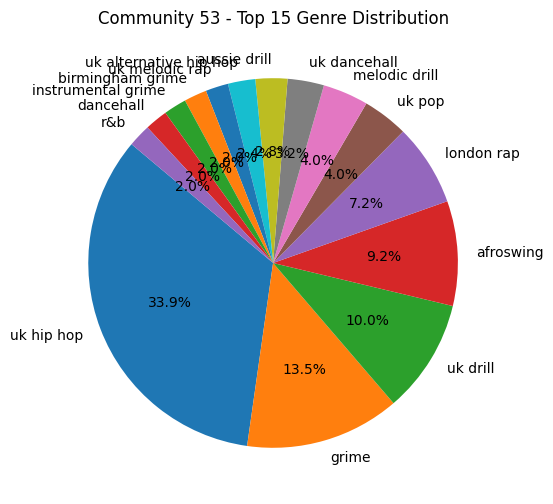

Global clustering coefficient for Community 53: 0.2738920302451447
Diameter for Community 53: 9
Density for Community 53: 0.06577227382180943

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.07050391496103299

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.06605162410115971

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.07124451357790122

Edge count: 956
Node count: 171
k = 12
Comparable regular lattice diameter: 15
Comparable regular lattice global clustering: 0.6818181818181818


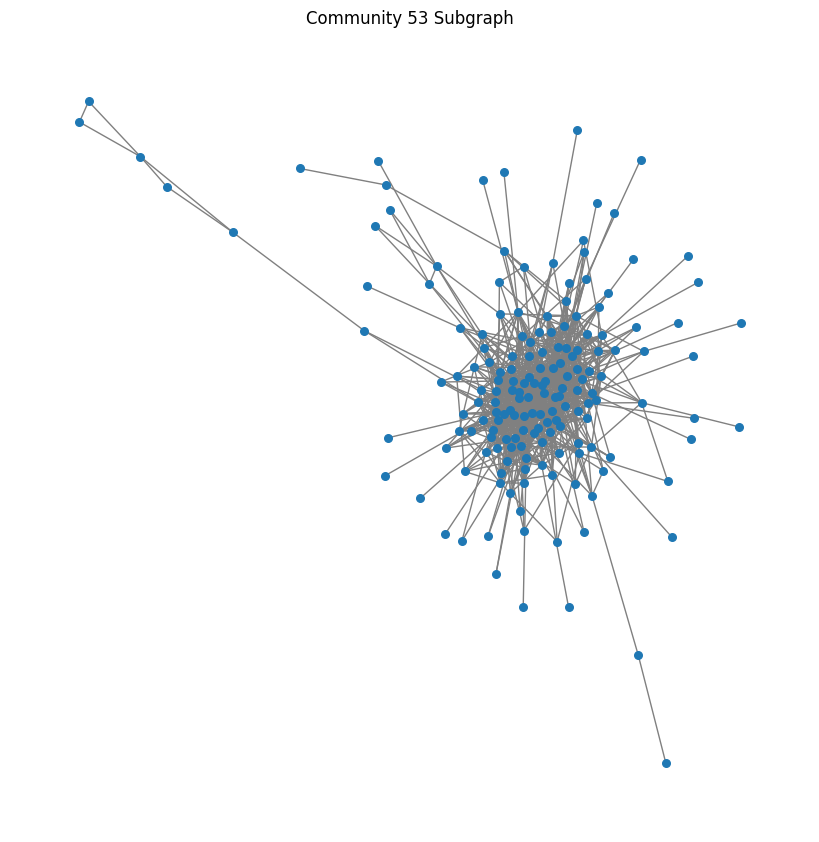

Artists in Community 35:
- Meir Ariel
- Beit Habubot
- Kobi Marimi
- Ella Lee
- E-Z
- Alma Zohar
- Zehava Ben
- Mark Eliyahu
- Hanan Ben Ari
- יושי
- Dikla
- Moshiko Mor
- Ivri Lider
- Gal Adam
- Geva Alon
- Akiva
- Shlomi Shabat
- Niv Demirel
- Nasrin Kadri
- Nadav Guedj
- Mergui
- Jane Bordeaux
- Riff Cohen
- Kobi Peretz
- Yishay Swissa
- Tomer Yosef
- Doli & Penn
- Peled
- Eden Alene
- Harel Skaat
- Shaked Komemy
- Agam Buhbut
- Tuna
- Nofar Salman
- Berry Sakharof
- Shlomo Gronich
- Benaia Barabi
- Mor
- Odeya
- Idan Raichel
- הכוכב הבא
- Guy & Yahel
- Shlomo Artzi
- Eden Ben Zaken
- Maya Dadon
- Orr Amrami Brockman
- Osher Cohen
- Elai Botner
- Carakukly
- Hadag Nahash
- Elai Botner and Yaldei Hachutz
- Amir Dadon
- Liran Danino
- Eviatar Banai
- Full Trunk
- Matti Caspi
- Daniela Spector
- Eden Hason
- Noy Fadlon
- Sarit Hadad
- Peer Tasi
- Ido Shoam
- Avior Malasa
- Adir Getz
- Noga Erez
- ECHO
- Regev Hod
- Alin Golan
- שם טוב האבי
- Nathan Goshen
- Hatikva 6
- Dudu Faruk
- Yuv

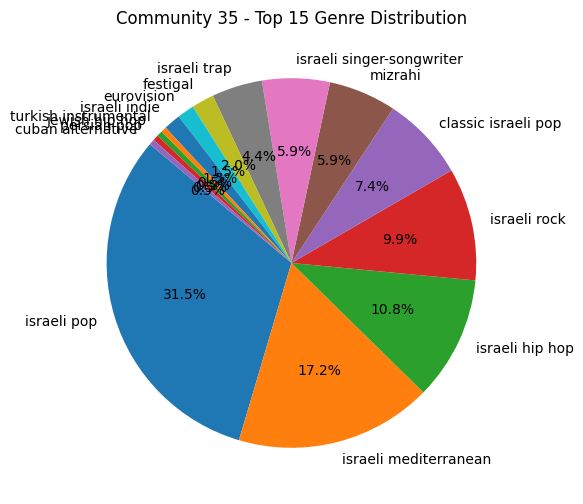

Global clustering coefficient for Community 35: 0.13597076964724025
Diameter for Community 35: 8
Density for Community 35: 0.03392167677881964

Comparable random graph diameter: 6
Comparable random graph global clustering: 0.03634584593488703

Comparable random graph diameter: 9
Comparable random graph global clustering: 0.02363792363792364

Comparable random graph diameter: 6
Comparable random graph global clustering: 0.04214235464235464

Edge count: 369
Node count: 148
k = 4
Comparable regular lattice diameter: 37
Comparable regular lattice global clustering: 0.5


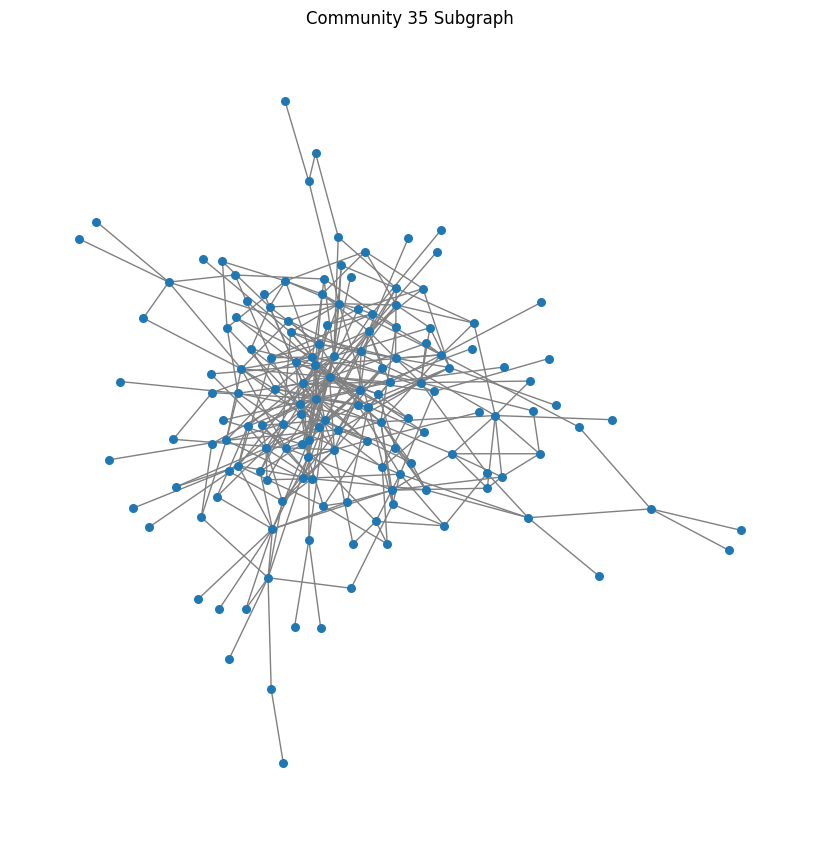

Artists in Community 1241:
- Leon Somov & Jazzu
- Kreisais Krasts
- Citi Zēni
- Ojārs Grīnbergs
- Marijonas Mikutavičius
- Arturs Skrastins
- Radistai Dj's
- Miks Galvanovskis
- Ten Walls
- Bäsello
- VIŅA
- Edgars Liepiņš
- Mark Les
- Bet Bet
- Harijs Spanovskis
- Aija Andrejeva
- Kastrācija
- Ozols
- Ieva Zasimauskaitė
- Zoliukas
- Jumprava
- Daddy Was a Milkman
- Kylok
- New Wavy
- Andrius Mamontovas
- Maarja
- G&G Sindikatas
- Urbanstep
- Manizha
- Apsi
- Remis Retro
- Trench Mafia Locco
- Prāta Vētra
- Singapūras Satīns
- Steps
- Ainars Mielavs
- 8 Kambarys
- Otra Puse
- Leon Somov
- EVASHA
- Edavārdi
- Imants Kalniņš
- Iglė
- Autobuss debesis
- BANDA BANDA
- Labvēlīgais Tips
- Karolina Meschino
- Lucky Luke
- Antis
- Remix
- Dons
- Jurijus
- Gabrielė Vilkickytė
- Rokas
- Alberto Ciccarini
- Mart Inc.
- Sudden Lights
- Kaspars Dimiters
- Mesa
- Triana Park
- Jazzu
- Flying Saucer Gang
- Giedrė
- ZeBrene
- Instrumenti
- Evgenya Redko
- Dzintars Čīča
- Samanta Tina
- Jovani
- Gabriel

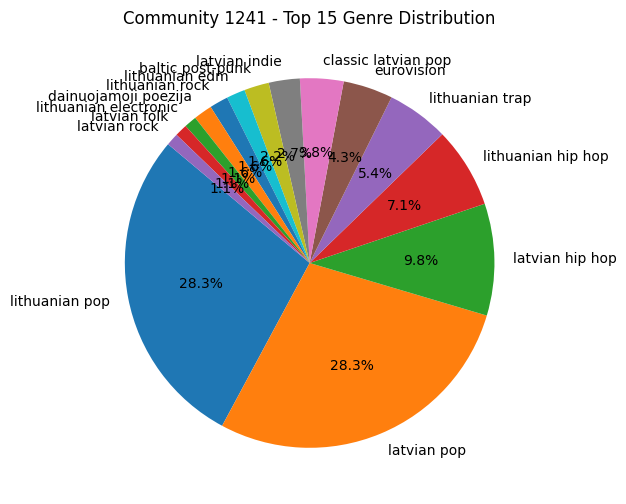

Global clustering coefficient for Community 1241: 0.18735471425126596
Diameter for Community 1241: 14
Density for Community 1241: 0.020306513409961684

Comparable random graph diameter: 13
Comparable random graph global clustering: 0.009382716049382716

Comparable random graph diameter: 11
Comparable random graph global clustering: 0.011188811188811187

Comparable random graph diameter: 9
Comparable random graph global clustering: 0.018448098663926

Edge count: 212
Node count: 145
k = 2
Comparable regular lattice diameter: 73
Comparable regular lattice global clustering: 0.0


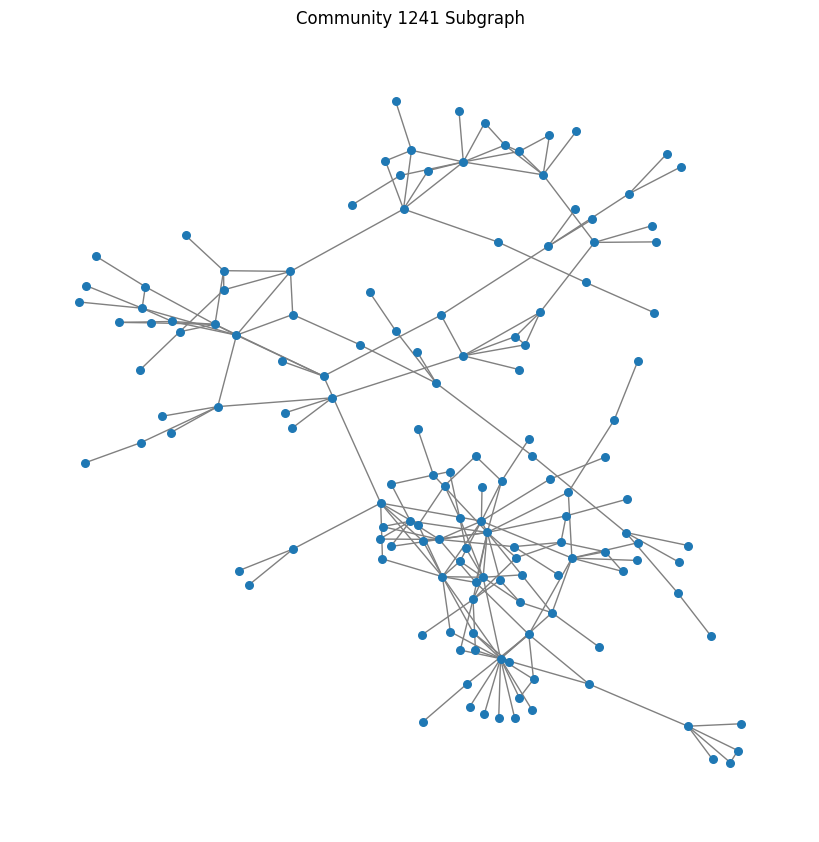

Artists in Community 44:
- Mody Amin
- Nasrat Al Badr
- Oka Wi Ortega
- Shabjdeed
- Ali Samara
- Nasrat Al Bader
- Hamo ElTikha
- Moustafa Hagag
- Karim Medhat
- Al Nather
- Sadat
- Sherine
- Mohamed Zizo
- Hamada Abo El Soud
- Muslim
- Mamun Alnattah
- Abo El Shouk
- Abo El Anwar
- Donia Wael
- Habeeb Ali
- Resha Costa
- Samer Elmedany
- D1M1K
- Dar El-Salam
- Aseel Hameem
- Humood AlKhudher
- Mido Gad
- Essam Saasa
- El Sawareekh
- Ramy Gamal
- Abo Lila
- Muhab
- Afroto
- Shahyn
- Mustafa Al-Abdullah
- Ahmed Basyoni
- Molotof
- Lil Eazy
- Nancy Ajram
- احمد موزه
- Wama
- Marwan Moussa
- Omar Kamal
- Mahmoud El Leithy
- G. Oka
- Intomymind
- Mousv
- Memaar Al Morshedy
- Ameen Khattab
- Hamza Namira
- Mahmoud El Esseily
- Ali Loka
- 3enba
- Bahaa Sultan
- Daffy
- Essa Almarzoug
- Mostafa el Degwy
- حماده الاسمر
- L5VAV
- Wegz
- Cairokee
- Abu
- Ahmed Al Maslawi
- Aida el Ayoubi
- Ghaliaa
- Hamo Bika
- Arsenik
- حلقولو
- Dalia
- Lil Baba
- Nasrat Albader
- Ahmed Abdo
- Mahmoud Al Turky


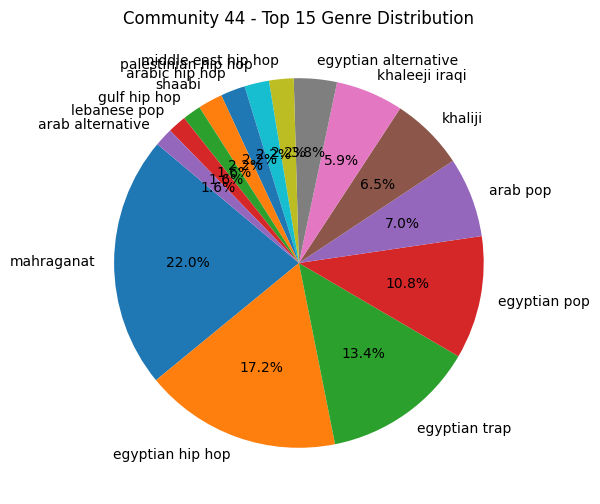

Global clustering coefficient for Community 44: 0.14005072353488643
Diameter for Community 44: 16
Density for Community 44: 0.026494632128434944

Comparable random graph diameter: 12
Comparable random graph global clustering: 0.01004703115814227

Comparable random graph diameter: 9
Comparable random graph global clustering: 0.028228076100416527

Comparable random graph diameter: 9
Comparable random graph global clustering: 0.024444444444444442

Edge count: 269
Node count: 143
k = 4
Comparable regular lattice diameter: 36
Comparable regular lattice global clustering: 0.5


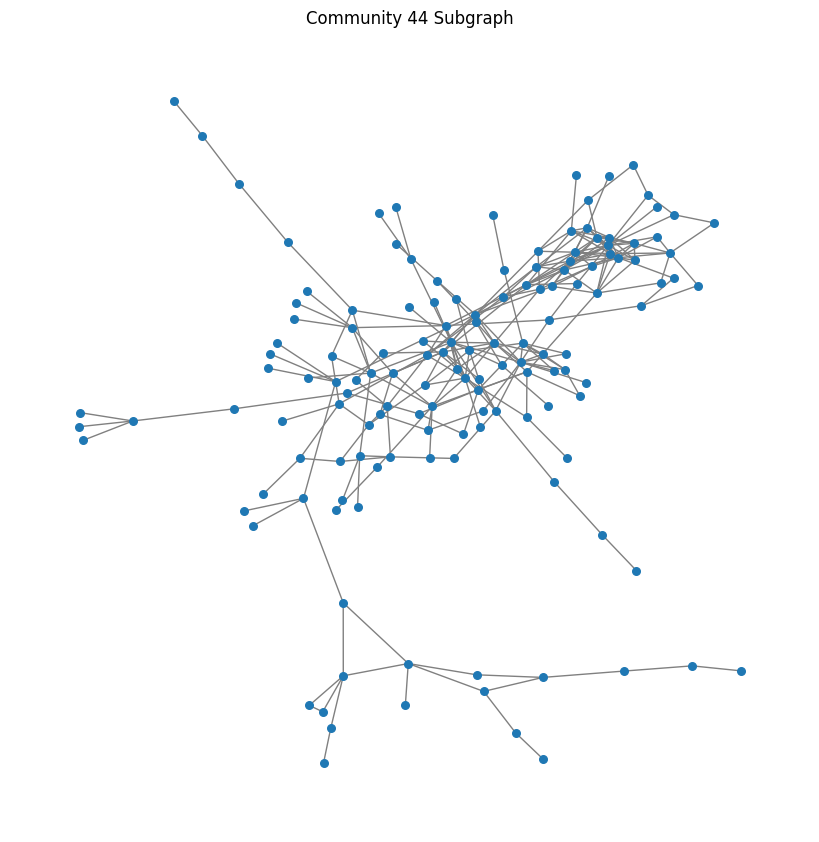

Artists in Community 102:
- Bruno X Spacc
- DR BRS
- Kollányi Zsuzsi
- Dzsúdló
- Nemazalány
- Rúzsa Magdolna
- Apu
- Paulina
- ibbigang
- AK26
- Rácz Gergõ
- Konyha
- Egs
- Mehringer
- Bereczki Zoltán
- DESH
- Kállay Saunders
- King Monroe
- Soulwave
- Zaporozsec
- Nági
- Beton.Hofi
- Krúbi
- Majka
- AWS
- Strongi
- frendz
- Ekhoe
- gyuris
- Young Fly
- Halott Pénz
- Zséda
- Dash Uciha
- Senkise
- Misshmusic
- Falkon
- Essemm
- Mikee Mykanic
- Follow The Flow
- Brains
- Lil Tib
- Kelemen Kabátban
- Opitz Barbara
- Figura
- Azahriah
- Kasza Tibi
- Zubi
- Red Bull Pilvaker
- Hiro
- ALEE
- Tiah
- The Biebers
- LMEN PRALA
- Tirpa
- Leander Kills
- ScarcityBP
- Lotfi Begi
- Kisé
- HoneyBeast
- Irie Maffia
- AKC Kretta
- HRflow
- Manuel
- Mario
- Tóth Andi
- New Level Empire
- Kolg8eight
- Killakikitt
- Ákos
- Republic
- Zävodi
- Pixa
- T. Danny
- VALMAR
- Nks
- AKC Misi
- Szakács Gergő
- Dé:Nash
- USNK
- Reza
- SuperStereo
- Kis Grófo
- G.w.M.
- Freddie
- KKevin
- Curtis
- Horváth Tamás
- S

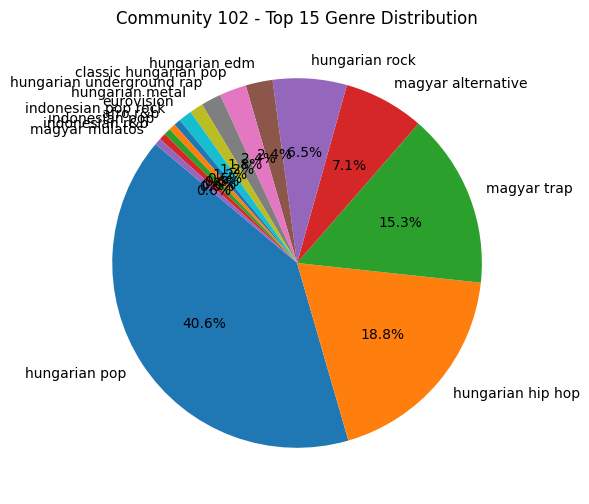

Global clustering coefficient for Community 102: 0.2135377463207652
Diameter for Community 102: 11
Density for Community 102: 0.03845462713387242

Comparable random graph diameter: 7
Comparable random graph global clustering: 0.03108974358974359

Comparable random graph diameter: 7
Comparable random graph global clustering: 0.030303724053724054

Comparable random graph diameter: 8
Comparable random graph global clustering: 0.032547169811320754

Edge count: 214
Node count: 106
k = 4
Comparable regular lattice diameter: 27
Comparable regular lattice global clustering: 0.5


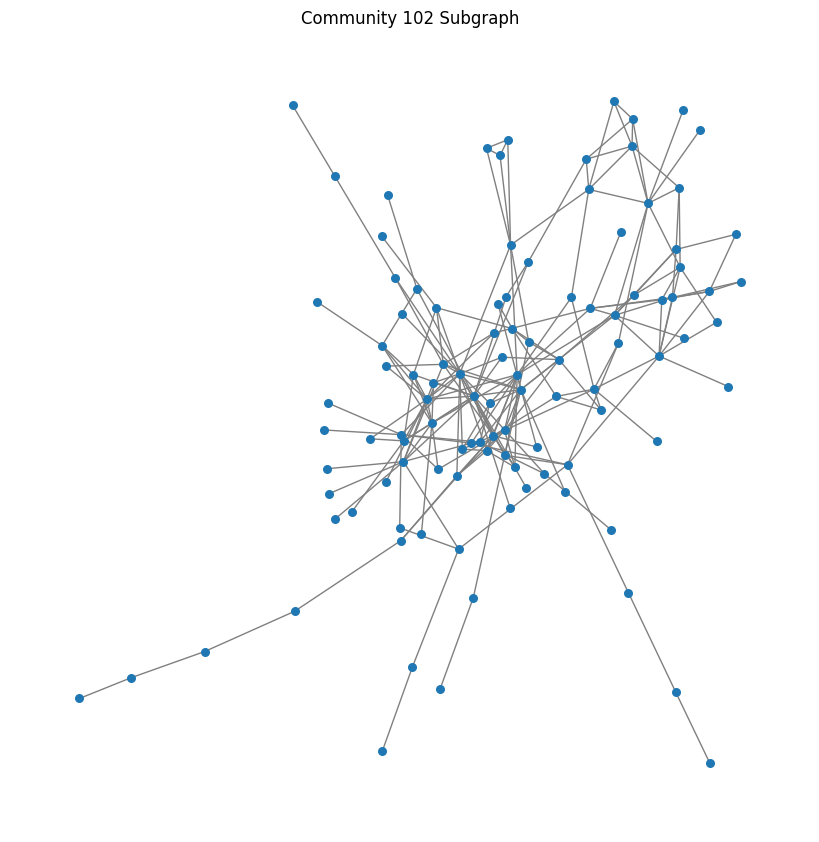

Artists in Community 83:
- Planeet
- Púr Múdd
- Beebilõust
- Gram-Of-Fun
- Kadiah
- Öed
- Tigran
- Black Velvet
- Suured tüdrukud
- Anett
- Maxtract
- fenkii
- Leis
- Grete Paia
- An-Marlen
- Sip€lga 14
- Meisterjaan
- Ott Lepland
- pluuto
- Karl-Kristjan
- Pitsa
- Beatrice
- Arop
- Kõik Boyz
- villemdrillem
- NOËP
- okeiokei
- Heleza
- Andrei Zevakin
- Lumevärv
- Karl-Erik Taukar
- Trad.Attack!
- Iiris
- Siimi
- Merilin Mälk
- Ariadne
- nublu
- Elina Born
- Sander Mölder
- Getter Jaani
- KOIT TOOME
- INGER
- Shira
- Genka
- 5MIINUST
- marp$
- Raul Ojamaa
- Kadri Voorand
- NEXUS
- Ewert and the Two Dragons
- KiROT
- Leslie Da Bass
- Clicherik & Mäx
- Jozels
- Karl Killing
- kaw
- AG
- Ivo Linna
- margiiela
- Bad Art
- Katie Sky
- Daniel Levi
- Kerli Kivilaan
- Angeelia
- Lenna
- Jüri Pootsmann
- Frankie Animal
- Stig Rästa
- Uudo Sepp
- Metsakutsu
- Reket
- STEFAN
- WATEVA
- Põhja-Tallinn
- Suur Papa
- Merlyn Uusküla
- Whogaux
- Elina Nechayeva
- Mick Pedaja
- Xtra Basic
- Tanel Padar


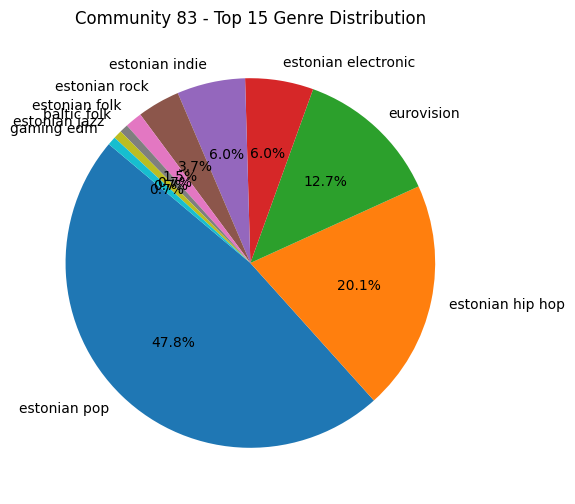

Global clustering coefficient for Community 83: 0.22343156197390196
Diameter for Community 83: 7
Density for Community 83: 0.0442002442002442

Comparable random graph diameter: 10
Comparable random graph global clustering: 0.020224719101123598

Comparable random graph diameter: 6
Comparable random graph global clustering: 0.03884379509379509

Comparable random graph diameter: 7
Comparable random graph global clustering: 0.03702200577200577

Edge count: 181
Node count: 91
k = 4
Comparable regular lattice diameter: 23
Comparable regular lattice global clustering: 0.5


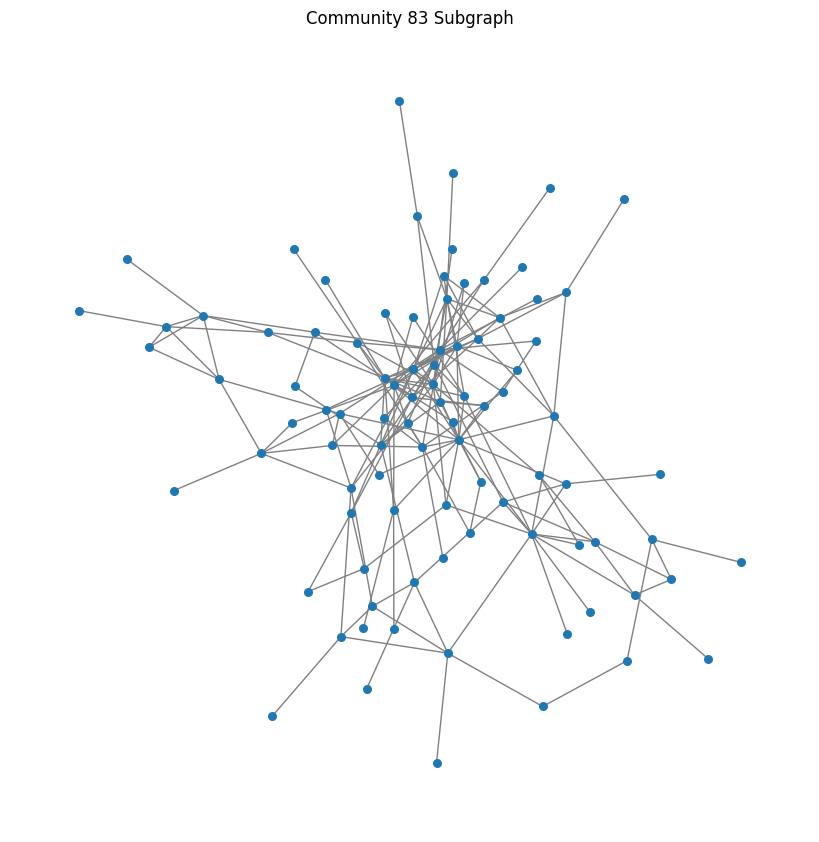

Artists in Community 693:
- Fahed Bin Fasla
- منصور الوايلي
- فلاح المسردي
- محمد ال دلبج
- بدر العزي
- دحام العبيوي
- Abdullah Al Farwan
- غريب ال مخلص
- بندر بن عوير
- Faisal Abdulkareem
- Abdullah Al Mukhles
- سلطان الفهادي

Community 693 Top 15 Genre Distribution:
- sheilat: 8 artist(s)
- khaliji: 5 artist(s)
- khaleeji iraqi: 1 artist(s)


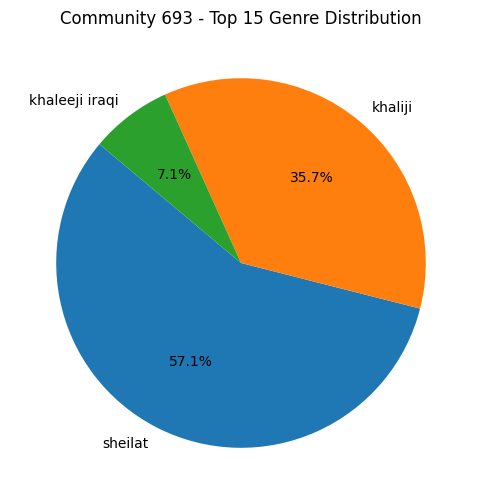

Global clustering coefficient for Community 693: 0.13888888888888887
Diameter for Community 693: 5
Density for Community 693: 0.25757575757575757

Comparable random graph diameter: 3
Comparable random graph global clustering: 0.3611111111111111

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.40952380952380957

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.2696969696969697

Edge count: 17
Node count: 12
k = 2
Comparable regular lattice diameter: 6
Comparable regular lattice global clustering: 0.0


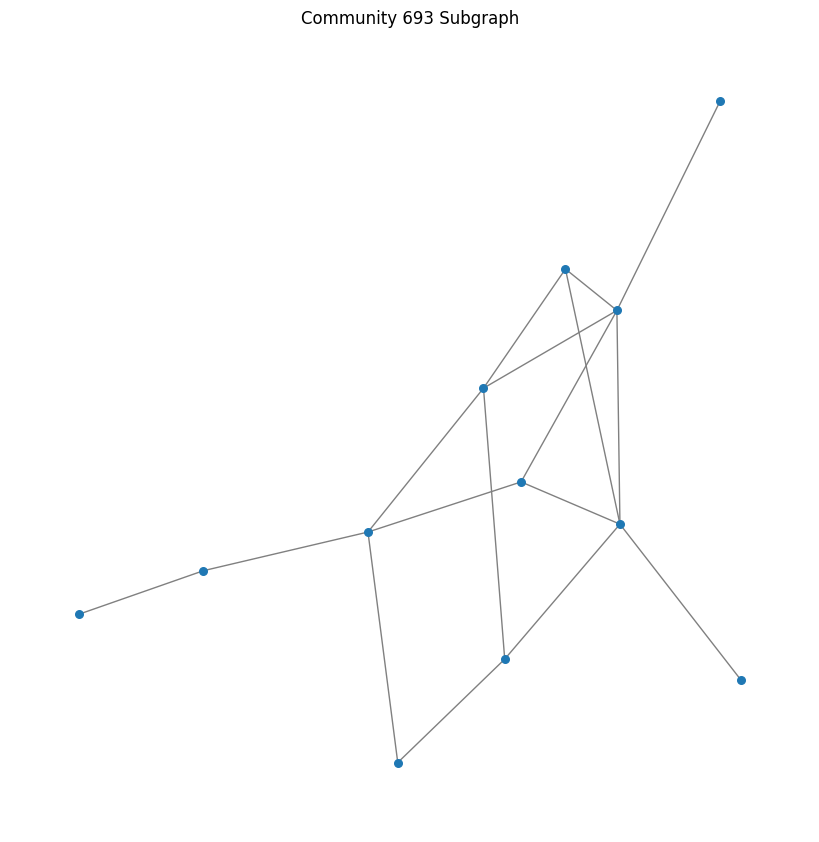

Artists in Community 165:
- Joe Arroyo
- The Latin Brothers
- Fruko Y Sus Tesos
- Armando Hernandez
- Calixto Ochoa
- Aniceto Molina
- Los Corraleros De Majagual
- Lisandro Meza
- La Luz Roja De San Marcos
- Calixto Ochoa y Su Conjunto
- Bobby Cruz

Community 165 Top 15 Genre Distribution:
- cumbia: 9 artist(s)
- tropical: 7 artist(s)
- salsa: 4 artist(s)
- salsa colombiana: 3 artist(s)
- chicha: 2 artist(s)
- cumbia salvadorena: 2 artist(s)
- porro: 1 artist(s)
- folclor afrocolombiano: 1 artist(s)
- folclor colombiano: 1 artist(s)
- musica andina colombiana: 1 artist(s)
- musica costena: 1 artist(s)
- boogaloo: 1 artist(s)
- latin jazz: 1 artist(s)
- salsa international: 1 artist(s)


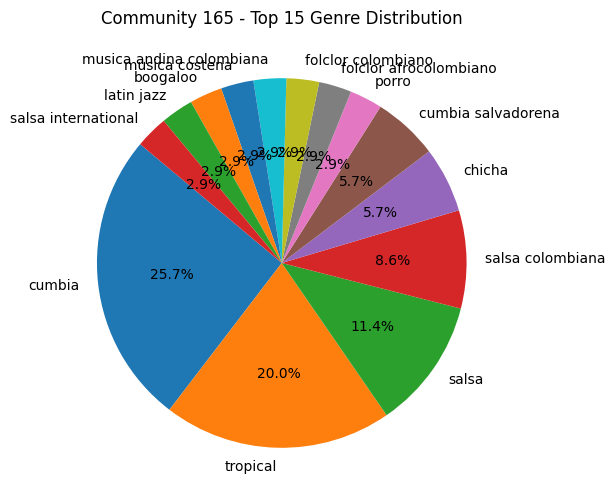

Global clustering coefficient for Community 165: 0.1515151515151515
Diameter for Community 165: 6
Density for Community 165: 0.2

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.0

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.35333333333333333

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.0

Edge count: 11
Node count: 11
k = 2
Comparable regular lattice diameter: 6
Comparable regular lattice global clustering: 0.0


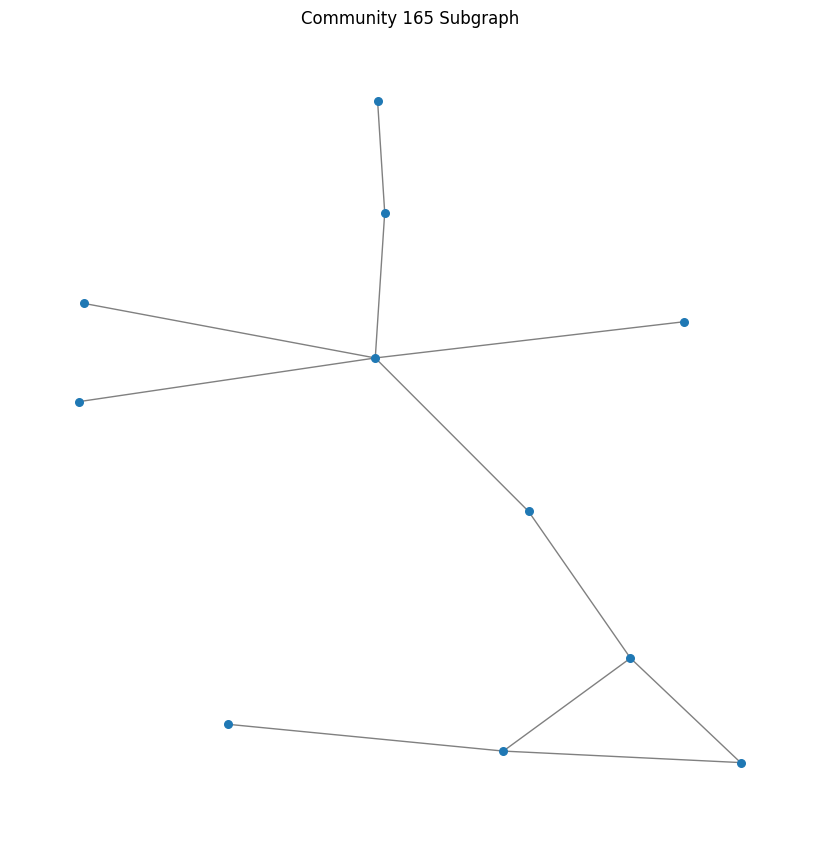

Artists in Community 351:
- LaNuestra
- Qmbia Juan
- Los Verduleros
- Diego Ríos
- Talento de Barrio
- Rumberos
- Japiaguar
- Chapa C
- Cumbia Juan
- La De Roberto

Community 351 Top 15 Genre Distribution:
- cumbia paraguaya: 6 artist(s)
- paraguayan rock: 3 artist(s)
- pop paraguayo: 3 artist(s)
- cumbia pop: 3 artist(s)
- cumbia boliviana: 1 artist(s)
- latin hip hop: 1 artist(s)
- reggaeton: 1 artist(s)


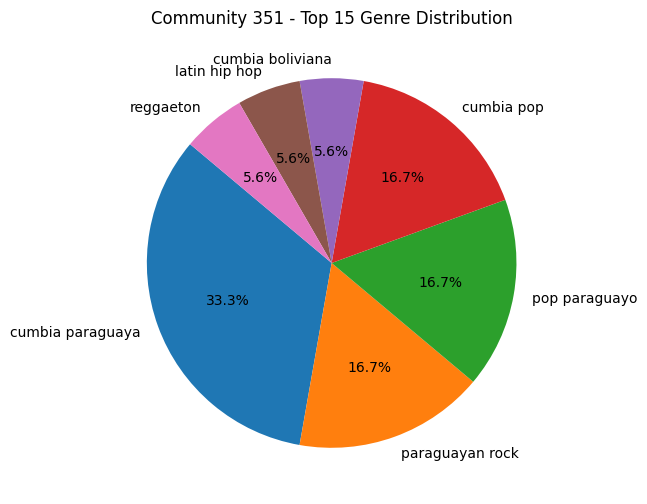

Global clustering coefficient for Community 351: 0.23333333333333334
Diameter for Community 351: 5
Density for Community 351: 0.2222222222222222

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.29166666666666663

Comparable random graph diameter: 6
Comparable random graph global clustering: 0.0

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.14814814814814814

Edge count: 10
Node count: 10
k = 2
Comparable regular lattice diameter: 5
Comparable regular lattice global clustering: 0.0


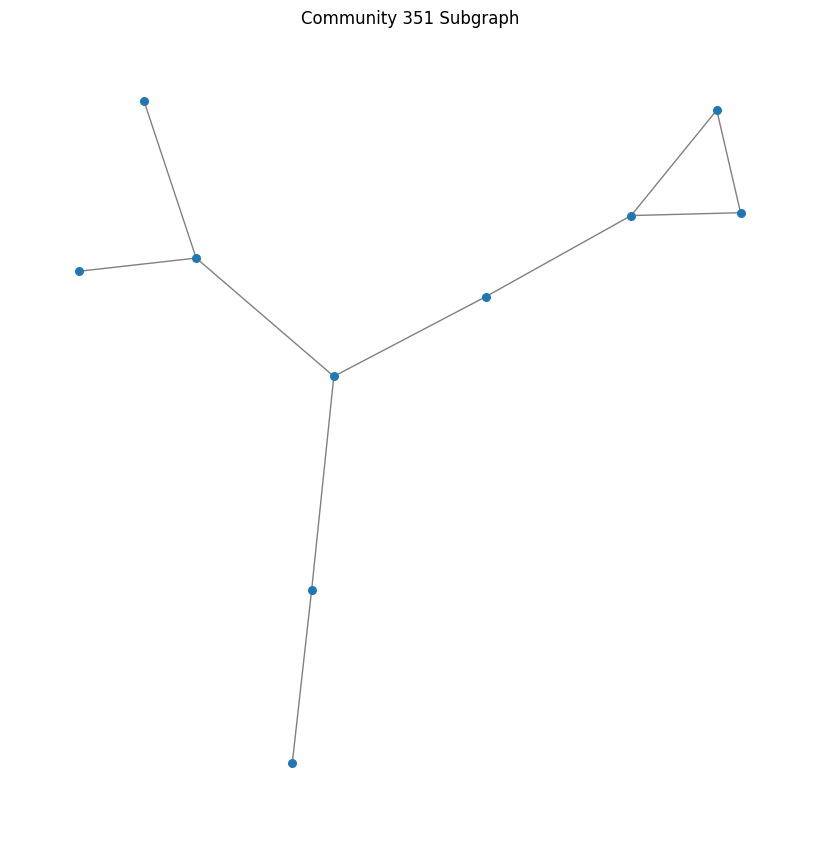

Artists in Community 245:
- Elevation Worship
- Kari Jobe
- Alex Zurdo
- Julio Melgar
- Lead
- Gabriela Rocha
- Redimi2
- Miel San Marcos
- Aliento

Community 245 Top 15 Genre Distribution:
- latin worship: 5 artist(s)
- latin christian: 4 artist(s)
- ccm: 2 artist(s)
- christian music: 2 artist(s)
- worship: 2 artist(s)
- rap cristiano: 2 artist(s)
- christian alternative rock: 1 artist(s)
- world worship: 1 artist(s)
- reggaeton cristiano: 1 artist(s)
- adoracao: 1 artist(s)
- brazilian gospel: 1 artist(s)
- rap conciencia: 1 artist(s)


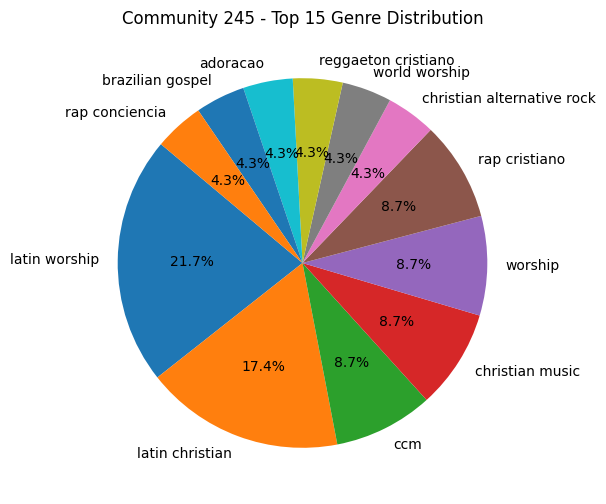

Global clustering coefficient for Community 245: 0.37037037037037035
Diameter for Community 245: 4
Density for Community 245: 0.3333333333333333

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.2518518518518518

Comparable random graph diameter: 3
Comparable random graph global clustering: 0.3111111111111111

Comparable random graph diameter: 3
Comparable random graph global clustering: 0.08333333333333333

Edge count: 12
Node count: 9
k = 2
Comparable regular lattice diameter: 5
Comparable regular lattice global clustering: 0.0


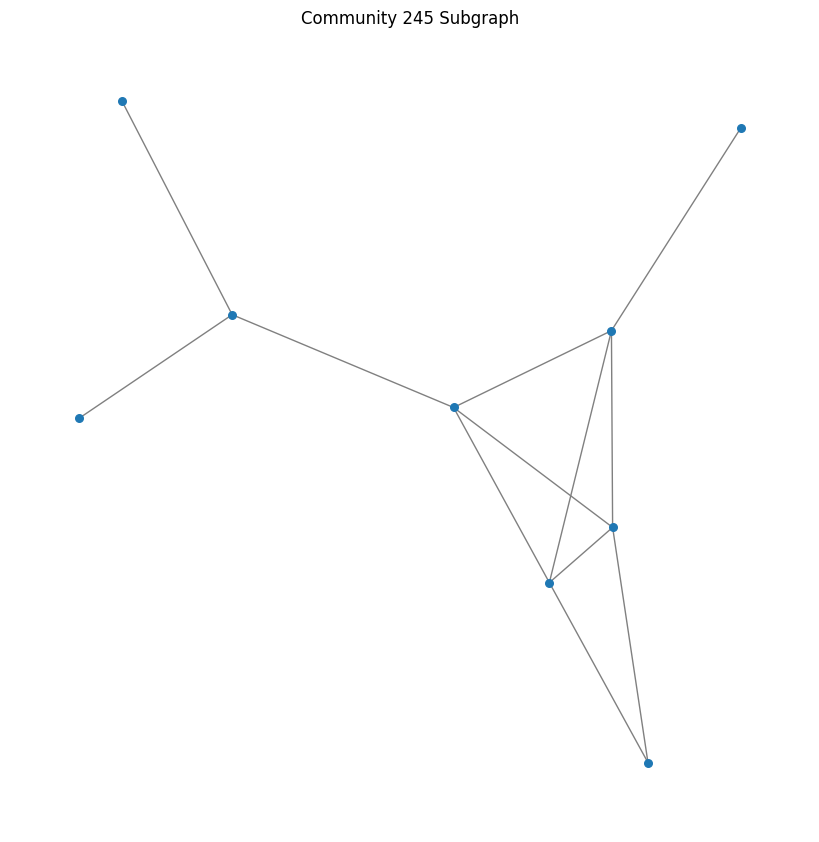

Artists in Community 1736:
- Lost Identities
- 8D Tunes
- The FifthGuys
- JESSIA
- Simock
- Hanzy
- 5HOW
- EQRIC
- Wikw

Community 1736 Top 15 Genre Distribution:
- covertronica: 2 artist(s)
- 8d: 1 artist(s)
- traprun: 1 artist(s)
- alt z: 1 artist(s)
- pop edm: 1 artist(s)
- sad rap: 1 artist(s)


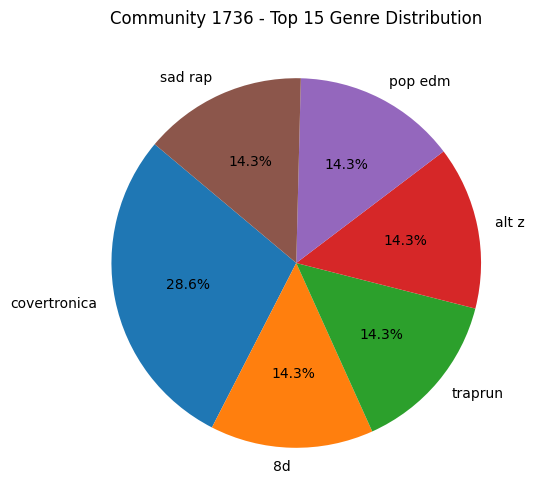

Global clustering coefficient for Community 1736: 0.16666666666666666
Diameter for Community 1736: 4
Density for Community 1736: 0.25

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.462962962962963

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.5208333333333334

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.3125

Edge count: 9
Node count: 9
k = 2
Comparable regular lattice diameter: 5
Comparable regular lattice global clustering: 0.0


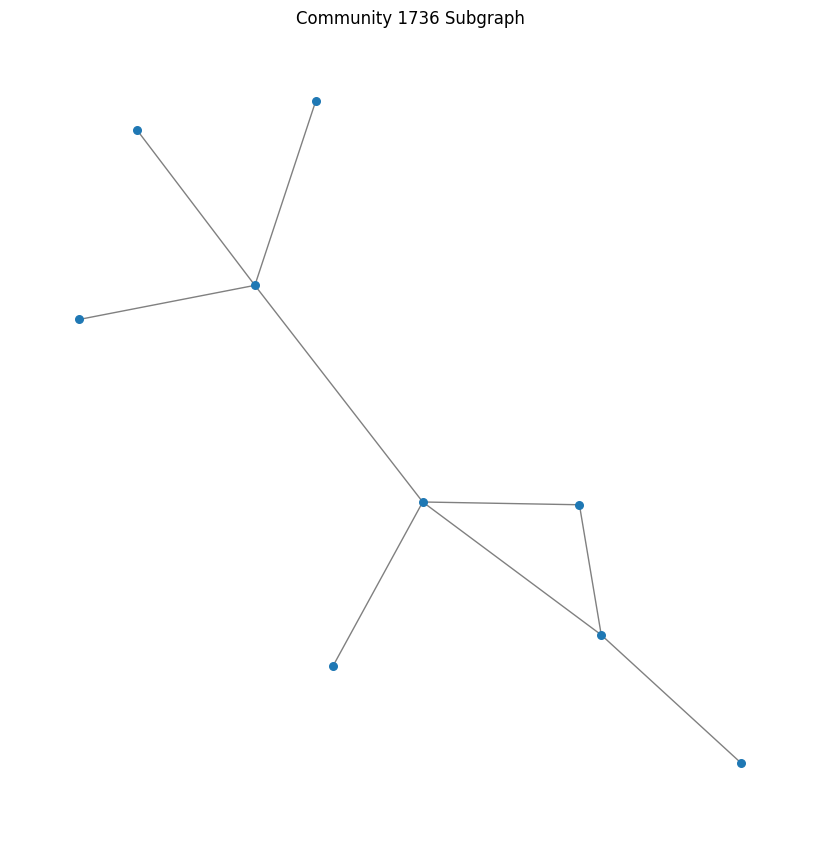

Artists in Community 10:
- J Calix
- Nassir Chahin
- Juan Oliva
- Capi
- Steven Pineda
- JWolfy
- Stayleave
- Jesus Aguilar

Community 10 Top 15 Genre Distribution:
- pop catracho: 7 artist(s)
- indie nica: 1 artist(s)


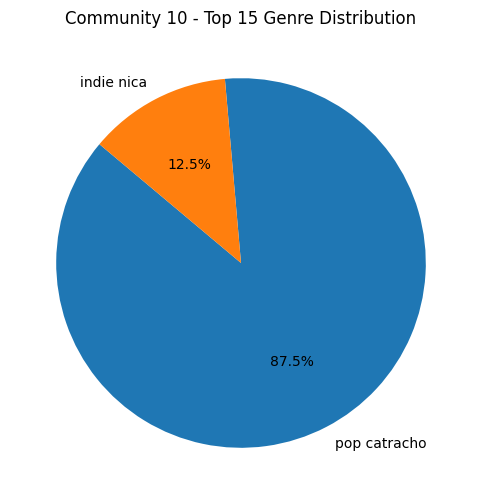

Global clustering coefficient for Community 10: 0.1875
Diameter for Community 10: 4
Density for Community 10: 0.35714285714285715

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.0

Comparable random graph diameter: 3
Comparable random graph global clustering: 0.4666666666666667

Comparable random graph diameter: 3
Comparable random graph global clustering: 0.5916666666666667

Edge count: 10
Node count: 8
k = 2
Comparable regular lattice diameter: 4
Comparable regular lattice global clustering: 0.0


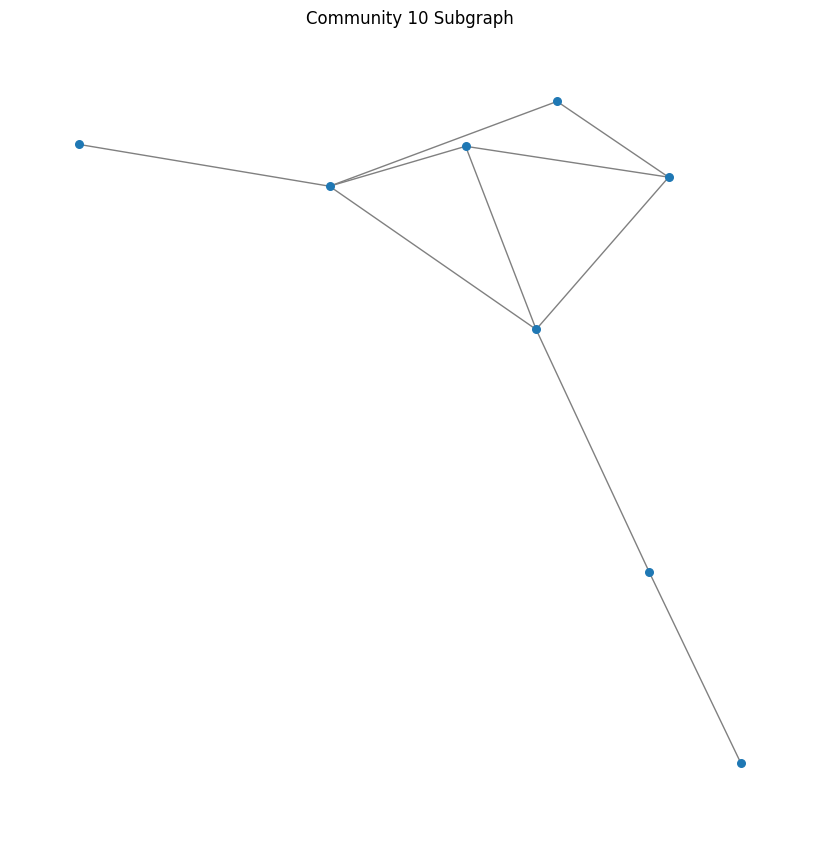

Artists in Community 629:
- хейтспіч
- Epolets
- Олександр Пономарьов
- Tartak
- СТРУКТУРА ЩАСТЯ
- Arsen Mirzoyan
- Нумер 482
- Motor'Rolla

Community 629 Top 15 Genre Distribution:
- ukrainian rock: 7 artist(s)
- ukrainian pop: 6 artist(s)
- ukrainian folk rock: 2 artist(s)
- ukrainian viral pop: 1 artist(s)
- ukrainian alternative rock: 1 artist(s)
- ukrainian indie: 1 artist(s)


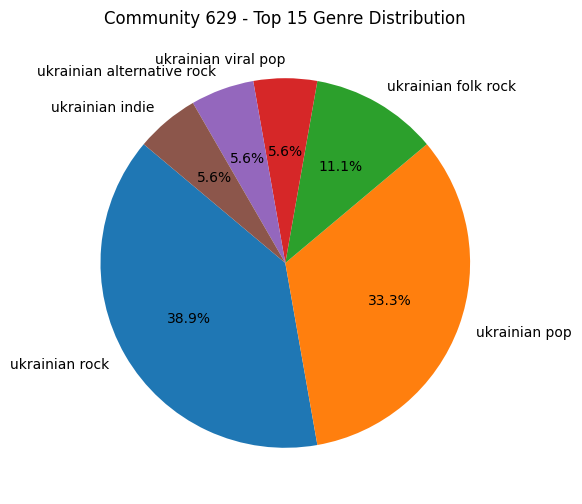

Global clustering coefficient for Community 629: 0.0
Diameter for Community 629: 5
Density for Community 629: 0.25

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.0

Comparable random graph diameter: 3
Comparable random graph global clustering: 0.4666666666666667

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.33333333333333337

Edge count: 7
Node count: 8
k = 2
Comparable regular lattice diameter: 4
Comparable regular lattice global clustering: 0.0


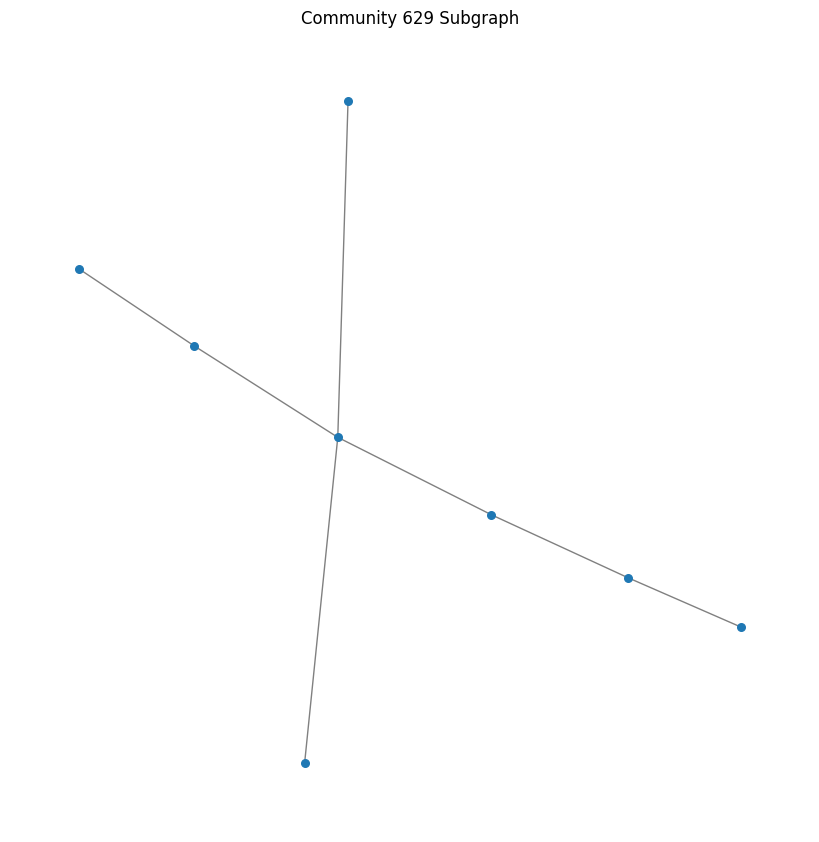

Artists in Community 2959:
- Sufian Suhaimi
- Yazid Izaham
- Luqman Faiz
- Fieya Julia
- Aiman Tino
- Fara Hezel

Community 2959 Top 15 Genre Distribution:
- malaysian pop: 6 artist(s)
- malay rap: 1 artist(s)


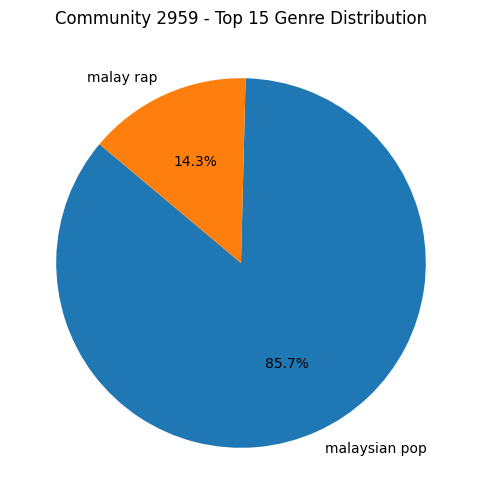

Global clustering coefficient for Community 2959: 0.9333333333333332
Diameter for Community 2959: 2
Density for Community 2959: 0.9333333333333333

Comparable random graph diameter: 2
Comparable random graph global clustering: 0.9

Comparable random graph diameter: 1
Comparable random graph global clustering: 1.0

Comparable random graph diameter: 2
Comparable random graph global clustering: 0.9

Edge count: 14
Node count: 6
k = 4
Comparable regular lattice diameter: 2
Comparable regular lattice global clustering: 0.6666666666666666


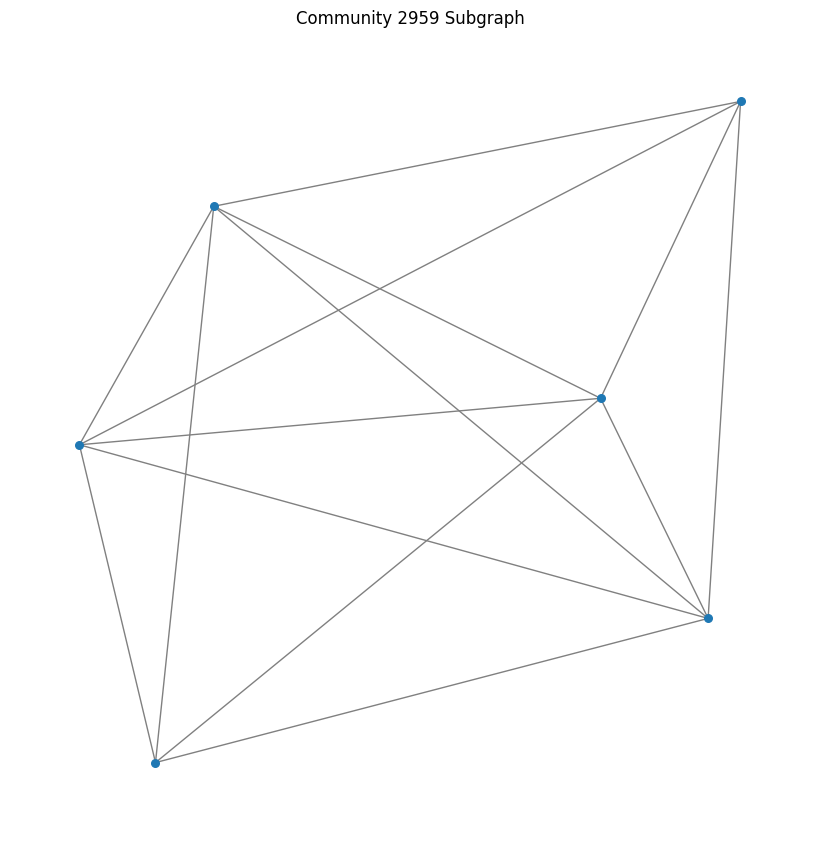

Artists in Community 885:
- Kolaba
- ENLEO
- EeOneGuy
- To Eternity
- Маша Кондратенко

Community 885 Top 15 Genre Distribution:
- ukrainian viral pop: 1 artist(s)
- russian viral rap: 1 artist(s)


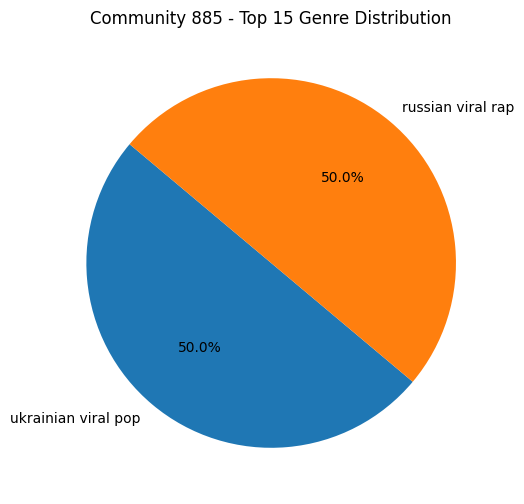

Global clustering coefficient for Community 885: 0.4666666666666667
Diameter for Community 885: 3
Density for Community 885: 0.5

Comparable random graph diameter: 2
Comparable random graph global clustering: 0.5833333333333334

Comparable random graph diameter: 3
Comparable random graph global clustering: 0.4666666666666667

Comparable random graph diameter: 1
Comparable random graph global clustering: 0.0

Edge count: 5
Node count: 5
k = 2
Comparable regular lattice diameter: 3
Comparable regular lattice global clustering: 0.0


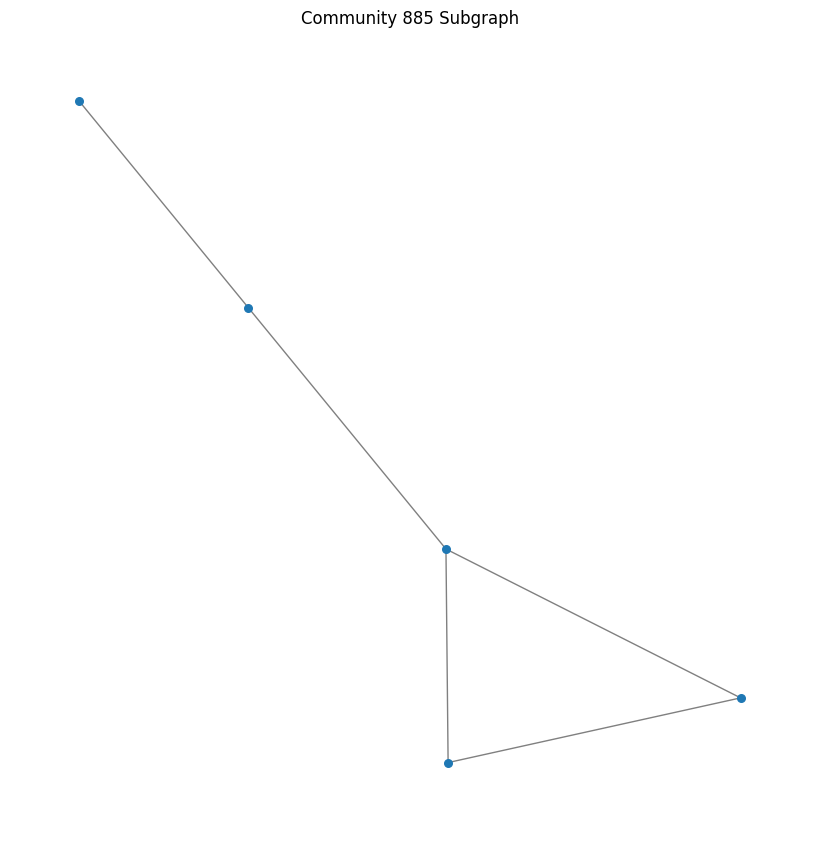

Artists in Community 1122:
- Kinderliedjes
- Pietenkidz
- Telekids Musicalschool
- Sint Kids
- Sinterklaasliedjes

Community 1122 Top 15 Genre Distribution:
- muziek voor kinderen: 2 artist(s)
- christmas product: 1 artist(s)


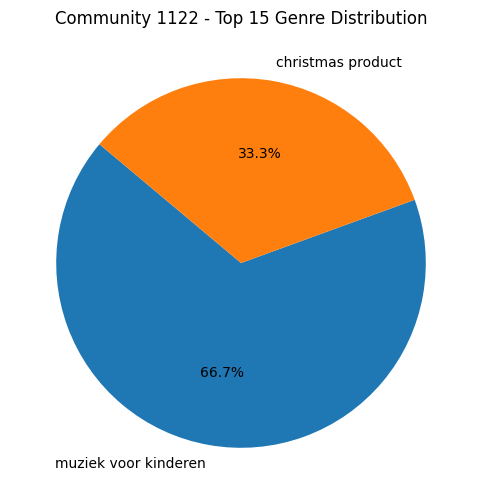

Global clustering coefficient for Community 1122: 0.0
Diameter for Community 1122: 2
Density for Community 1122: 0.4

Comparable random graph diameter: 3
Comparable random graph global clustering: 0.4666666666666667

Comparable random graph diameter: 2
Comparable random graph global clustering: 0.4333333333333333

Comparable random graph diameter: 3
Comparable random graph global clustering: 0.0

Edge count: 4
Node count: 5
k = 2
Comparable regular lattice diameter: 3
Comparable regular lattice global clustering: 0.0


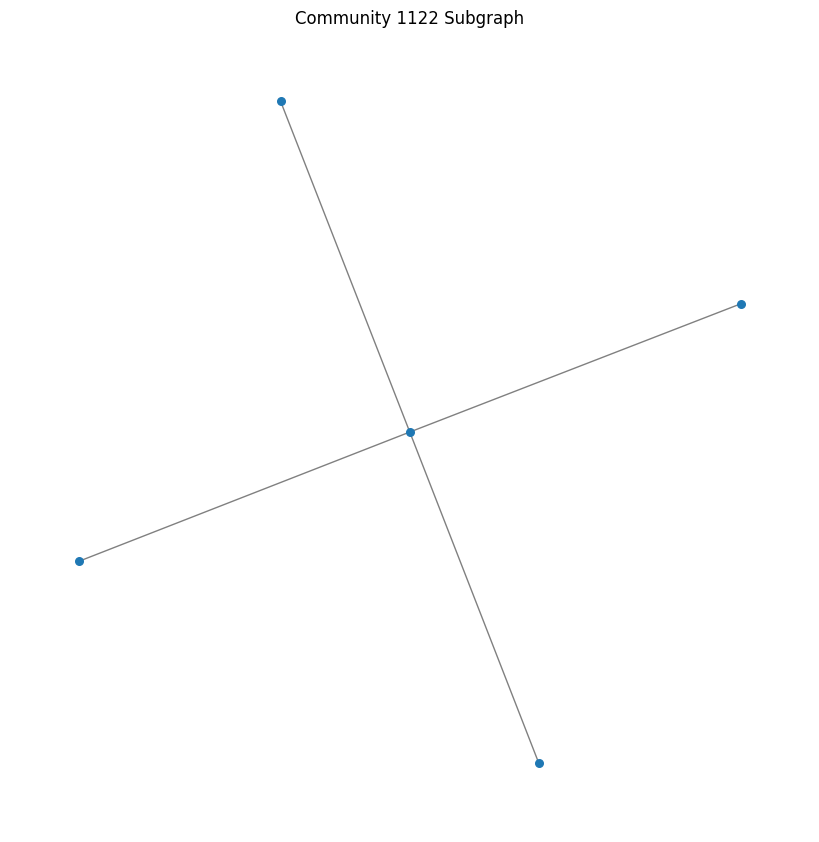

In [54]:
# loop through each community w/ at least 5 members & analyze:
for community_id, members in sorted(community_groups.items(), key=lambda x: len(x[1]), reverse=True):
    
    # process only if there are 5+ artists in the community:
    if len(members) < 5:
        continue
    
    # subgraph:
    community_subgraph = subgraph.subgraph(members).copy()
    
    genre_count = defaultdict(int)
    artist_names = []
    
    # count genres:
    for node in members:
        genres = G.nodes[node].get('genres', [])
        for genre in genres:
            genre_count[genre] += 1

        artist_name = G.nodes[node].get('name', 'Unknown')
        artist_names.append(artist_name)

    # print artists:
    print(f"Artists in Community {community_id}:")
    for artist in artist_names:
        print(f"- {artist}")

    # sort genres & select top 15:
    sorted_genres = sorted(genre_count.items(), key=lambda x: x[1], reverse=True)[:15]
    
    # only process if there are genres in this community:
    if sorted_genres:
        genres, counts = zip(*sorted_genres)
        print(f"\nCommunity {community_id} Top 15 Genre Distribution:")
        
        # display genre distribution:
        for genre, count in zip(genres, counts):
            print(f"- {genre}: {count} artist(s)")
        
        # plot pie chart:
        plt.figure(figsize=(6, 6))
        plt.pie(counts, labels=genres, autopct='%1.1f%%', startangle=140)
        plt.title(f"Community {community_id} - Top 15 Genre Distribution")
        plt.show()

    # global clustering:
    clustering_coefficient = nx.average_clustering(community_subgraph)
    print(f"Global clustering coefficient for Community {community_id}: {clustering_coefficient}")

    # diameter:
    diameter = nx.diameter(community_subgraph)
    print(f"Diameter for Community {community_id}: {diameter}")

    # density:
    density = nx.density(community_subgraph)
    print(f"Density for Community {community_id}: {density}\n")

    # COMPARABLE RANDOM GRAPHS:
    n = len(community_subgraph)
    p = density

    # generate & draw 3 samples:
    random_graphs = generate_graphs(n, p, 3)

    # analyze each random graph:
    for random_G in random_graphs:
        # check if random graph sample is connected. if not, use largest connected component:
        if not nx.is_connected(random_G):
            largest_cc = max(nx.connected_components(random_G), key=len)
            random_G = random_G.subgraph(largest_cc).copy()
            
        # approximate diameter calculation using largest connected component:
        randomG_diameter = nx.diameter(random_G)
        print(f"Comparable random graph diameter: {randomG_diameter}")
            
        # global clustering coefficient:
        randomG_clustering = nx.average_clustering(random_G)
        print(f"Comparable random graph global clustering: {randomG_clustering}")

        print('')

    # COMPARABLE REGULAR LATTICE:
    edge_count = community_subgraph.number_of_edges()
    print("Edge count:", edge_count)

    node_count = community_subgraph.number_of_nodes()
    print("Node count:", node_count)

    # decide k:
    k = (2 * edge_count) / len(community_subgraph)
    k = int(k)
    if k % 2 != 0:
        k += 1  # make k even
    print(f"k = {k}")

    if n > k:
        # generate regular lattice:
        reg_lat = nx.watts_strogatz_graph(n, k, 0)

        # diameter calculation:
        reg_lat_diameter = ceil(n / k)
        print(f"Comparable regular lattice diameter: {reg_lat_diameter}")
                
        # calculate global clustering coefficient:
        reg_lat_clustering = nx.average_clustering(reg_lat)
        print(f"Comparable regular lattice global clustering: {reg_lat_clustering}")
    else:
        print(f"Skipping regular lattice for Community {community_id} because n < k.\n")
        continue

    # plot subgraph:
    pos = nx.spring_layout(community_subgraph, seed=42)
    plt.figure(figsize=(8, 8))
    nx.draw(community_subgraph, pos, with_labels=False, node_size=30, edge_color='gray')
    plt.title(f"Community {community_id} Subgraph")
    plt.show()

Here's the top 20 visualized:

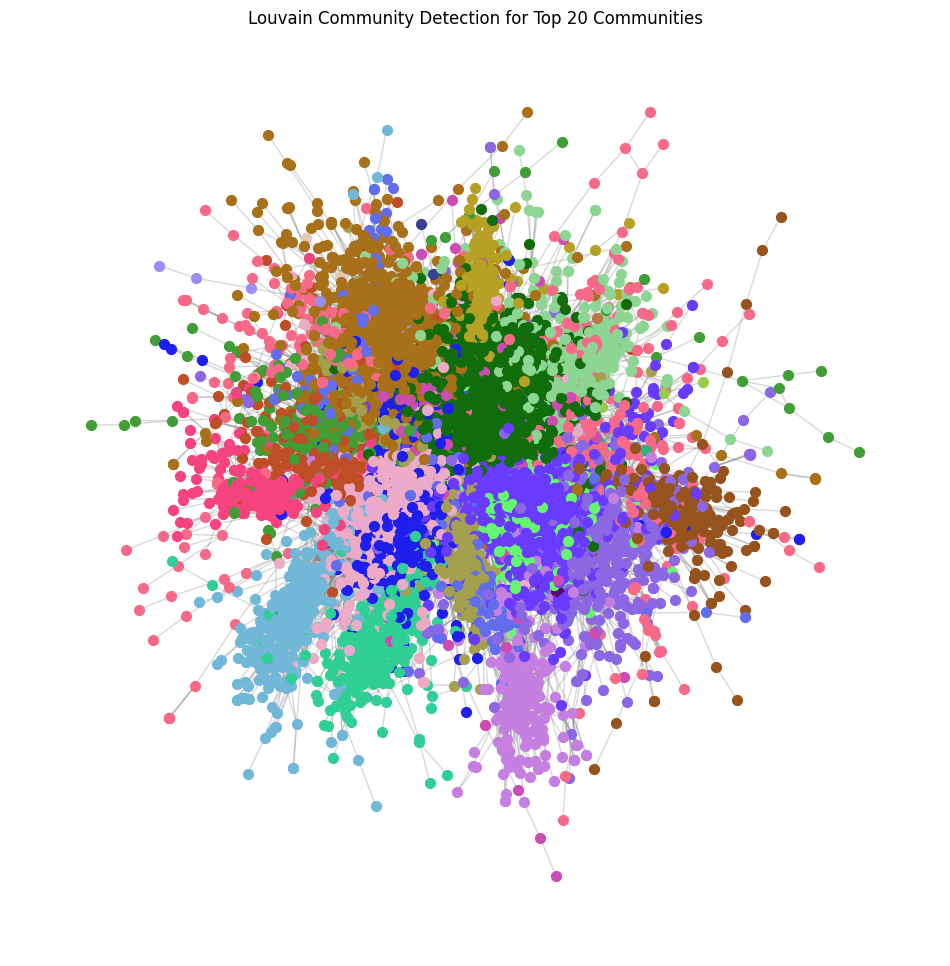

In [55]:
# runtime ~5min

# choose top 20 communities based on size:
top_20_communities = sorted(community_groups.items(), key=lambda x: len(x[1]), reverse=True)[:20]

# create graph w/ only nodes from top 20 communities:
top_20_nodes = [node for community_id, members in top_20_communities for node in members]
top_20_subgraph = G.subgraph(top_20_nodes).copy()

# apply Louvain partitioning on top 20 subgraph:
top_20_partition = community_louvain.best_partition(top_20_subgraph)

# generate colors for each community:
unique_communities = list(set(top_20_partition.values()))
community_colors = {community_id: (random.random(), random.random(), random.random()) for community_id in unique_communities}

# positioning:
pos = nx.spring_layout(top_20_subgraph, seed=42)

# plot graph w/ communities colored:
plt.figure(figsize=(12, 12))
for node, community_id in top_20_partition.items():
    nx.draw_networkx_nodes(top_20_subgraph, pos, nodelist=[node], node_size=50, node_color=[community_colors[community_id]])

nx.draw_networkx_edges(top_20_subgraph, pos, alpha=0.3, edge_color="gray")
plt.title("Louvain Community Detection for Top 20 Communities")
plt.axis("off")
plt.show()

**A look at genre distributions:**

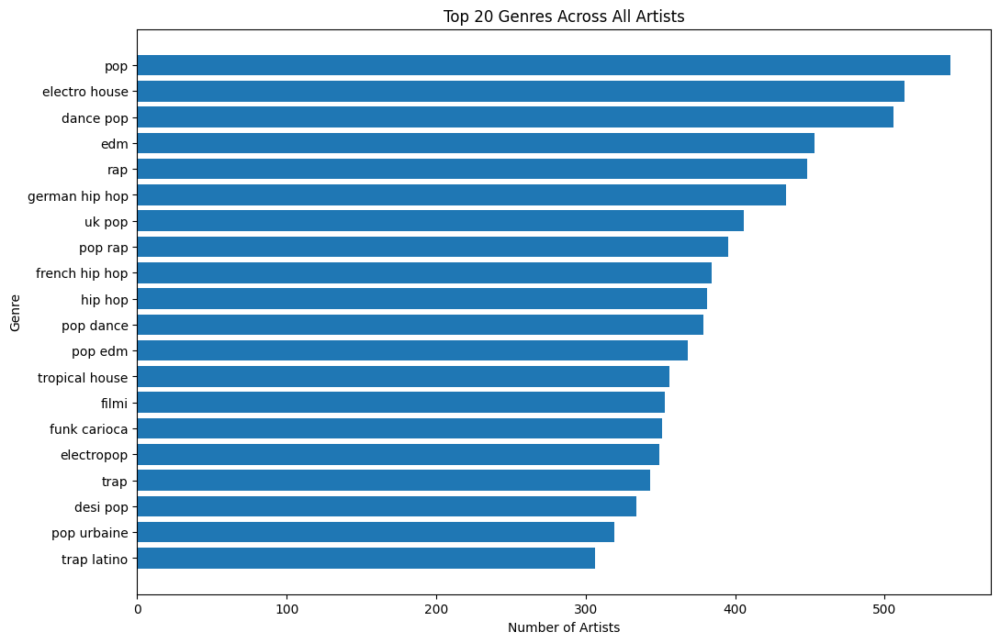

[('pop', 544),
 ('electro house', 513),
 ('dance pop', 506),
 ('edm', 453),
 ('rap', 448),
 ('german hip hop', 434),
 ('uk pop', 406),
 ('pop rap', 395),
 ('french hip hop', 384),
 ('hip hop', 381),
 ('pop dance', 379),
 ('pop edm', 368),
 ('tropical house', 356),
 ('filmi', 353),
 ('funk carioca', 351),
 ('electropop', 349),
 ('trap', 343),
 ('desi pop', 334),
 ('pop urbaine', 319),
 ('trap latino', 306)]

In [56]:
# extract genres from all artists (including non-seed/non-chart-toppers)
nodes_df['genres'] = nodes_df['genres'].fillna('[]').apply(
    lambda x: ast.literal_eval(x) if isinstance(x, str) else x
)
all_genres = [genre for genres in nodes_df['genres'] for genre in genres]

# count occurrences of each genre:
genre_counts = Counter(all_genres)

# identify top 20 genres:
top_genres = genre_counts.most_common(20)

# plot top genres:
genres, counts = zip(*top_genres)
plt.figure(figsize=(12, 8))
plt.barh(genres, counts)
plt.xlabel("Number of Artists")
plt.ylabel("Genre")
plt.title("Top 20 Genres Across All Artists")
plt.gca().invert_yaxis()
plt.show()

# return top 20 genres:
top_genres

**Looking at only chart topper artists:**

Let's look at some of their graph properties and compare them to G(n, p) and regular lattice:

In [5]:
# runtime ~15 min

import ast

# replace NaN values in 'chart_hits' with empty lists:
nodes_df['chart_hits'] = nodes_df['chart_hits'].fillna('[]')

# convert 'chart_hits' strings to lists:
nodes_df['chart_hits'] = nodes_df['chart_hits'].apply(
    lambda x: ast.literal_eval(x) if isinstance(x, str) else x
)

# filter nodes to include only those w/ non-empty 'chart_hits':
chart_toppers = nodes_df[nodes_df['chart_hits'].apply(lambda x: len(x) > 0)]

# remove duplicates in 'spotify_id' column:
chart_toppers = chart_toppers.drop_duplicates(subset='spotify_id')

# get set of filtered artist IDs:
filtered_artist_ids = set(chart_toppers['spotify_id'])

# filter edges to include only those where both endpoints are in filtered artist list:
filtered_edges = edges_df[
    (edges_df['id_0'].isin(filtered_artist_ids)) & (edges_df['id_1'].isin(filtered_artist_ids))
]

# create subgraph:
chart_toppers_G = nx.Graph()
chart_toppers_G.add_edges_from(filtered_edges.values)  # Add edges
chart_toppers_G.add_nodes_from([  # Add nodes with attributes
    (node_id, attr) for node_id, attr in chart_toppers.set_index('spotify_id').to_dict('index').items()
])

# info:
num_nodes = chart_toppers_G.number_of_nodes()
num_edges = chart_toppers_G.number_of_edges()
print(f"Subgraph created with {num_nodes} nodes and {num_edges} edges.")

# analyze global clustering of subgraph:
clustering_coefficient = nx.average_clustering(chart_toppers_G)
print(f"Global clustering coefficient for chart topper artists: {clustering_coefficient}")

# analyze diameter of subgraph:
largest_cc_nodes = max(nx.connected_components(chart_toppers_G), key=len)
largest_cc_subgraph = chart_toppers_G.subgraph(largest_cc_nodes).copy()
diameter = nx.diameter(largest_cc_subgraph)
print(f"Diameter for chart topper artists: {diameter}")

# find density:
density = nx.density(chart_toppers_G)
print(f"Density for chart topper artists: {density}\n")

# COMPARABLE RANDOM GRAPHS:
n = len(chart_toppers_G)
p = density

# generate & draw 3 samples:
random_graphs = generate_graphs(n, p, 3)

# analyze each:
for random_G in random_graphs:
    # check if random graph sample is connected. if not, use largest connected component:
    if not nx.is_connected(random_G):
        largest_cc_nodes = max(nx.connected_components(random_G), key=len)
        random_G = random_G.subgraph(largest_cc_nodes).copy()
    
    # density:
    random_G_density = nx.density(random_G)
    print(f"Comparable random graph density: {random_G_density}\n")
        
    # approximate diameter calculation using largest connected component:
    randomG_diameter = nx.diameter(random_G)
    print(f"Comparable random graph diameter: {randomG_diameter}")
        
    #global clustering coefficient:
    randomG_clustering = nx.average_clustering(random_G)
    print(f"Comparable random graph global clustering: {randomG_clustering}")

    print('')

# COMPARABLE REGULAR LATTICE:
# count nodes & edges:    
edge_count = chart_toppers_G.number_of_edges()
print("Edge count:", edge_count)

node_count = chart_toppers_G.number_of_nodes()
print("Node count:", node_count)

# decide k:
k = (2 * edge_count) / len(chart_toppers_G)
k = int(k)
if k % 2 != 0:
    k += 1  # make k even
print(f"k = {k}")

# generate regular lattice:
reg_lat = nx.watts_strogatz_graph(n, k, 0)

# density:
reg_lat_density = nx.density(reg_lat)
print(f"Comparable regular.lattice density: {reg_lat_density}\n")

# diameter calculation:
reg_lat_diameter = nx.diameter(reg_lat)
print(f"Comparable regular lattice diameter: {reg_lat_diameter}")
        
# calculate global clustering coefficient:
reg_lat_clustering = nx.average_clustering(reg_lat)
print(f"Comparable regular lattice global clustering: {reg_lat_clustering}")


Subgraph created with 19562 nodes and 72207 edges.
Global clustering coefficient for chart topper artists: 0.12147760596271856
Diameter for chart topper artists: 18
Density for chart topper artists: 0.0003774026885327709

Comparable random graph density: 0.00037871602340994875

Comparable random graph diameter: 9
Comparable random graph global clustering: 0.00035817337981131525

Comparable random graph density: 0.000378500402782232

Comparable random graph diameter: 10
Comparable random graph global clustering: 0.00035223242868616893

Comparable random graph density: 0.0003791565661897319

Comparable random graph diameter: 9
Comparable random graph global clustering: 0.0003870331646554918

Edge count: 72207
Node count: 19562
k = 8
Comparable random graph density: 0.00040897704616328406

Comparable regular lattice diameter: 2446
Comparable regular lattice global clustering: 0.6428571428571429


Vertex degree distribution again, but just for the chart-toppers:

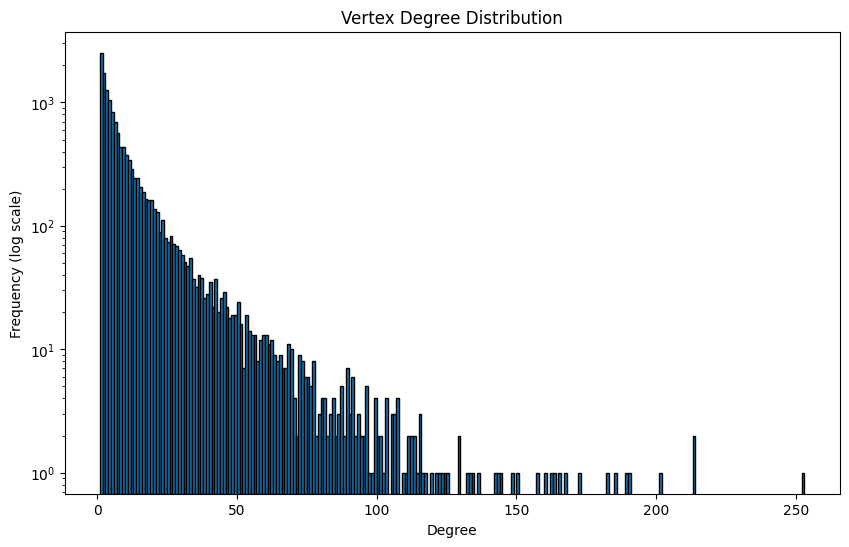

In [58]:
# graph vertex degree dist:
degrees = [degree for node, degree in chart_toppers_G.degree()]
plt.figure(figsize=(10, 6))
plt.hist(degrees, bins=range(1, max(degrees) + 1), edgecolor='black')
plt.yscale('log')
plt.xlabel("Degree")
plt.ylabel("Frequency (log scale)")
plt.title("Vertex Degree Distribution")
plt.show()

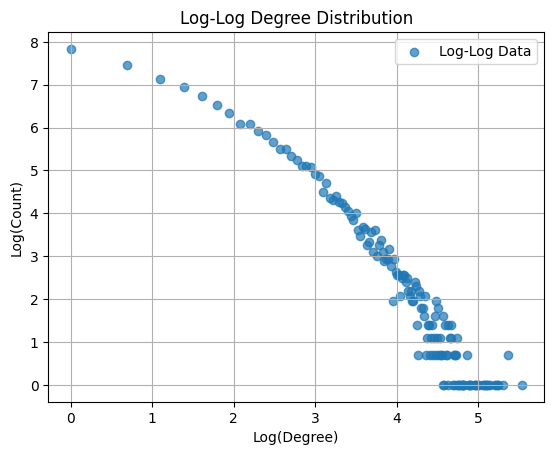

R^2: 0.9282


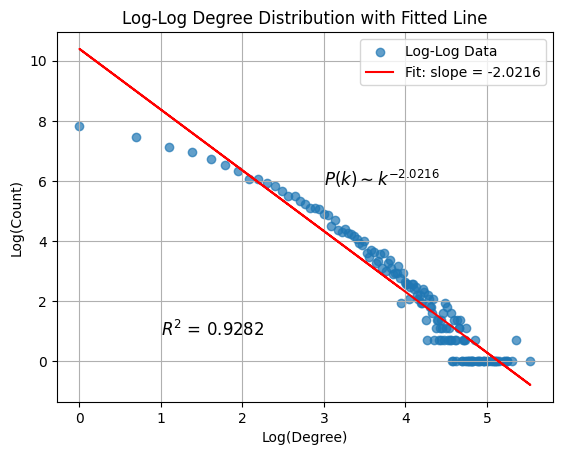

R^2: 0.9282
Slope of the log-log fit: -2.0216
R^2 value: 0.9282


In [59]:
# power law analysis for CHART TOPPERS:

slope = plot_and_fit_log_log(chart_toppers_G)
r2_value = compute_r2(chart_toppers_G)

print(f"Slope of the log-log fit: {slope:.4f}")
print(f"R^2 value: {r2_value:.4f}")

So, a slightly higher slope seen in the power law for the (non-biased) chart-topper data.

Let's look at their genres:

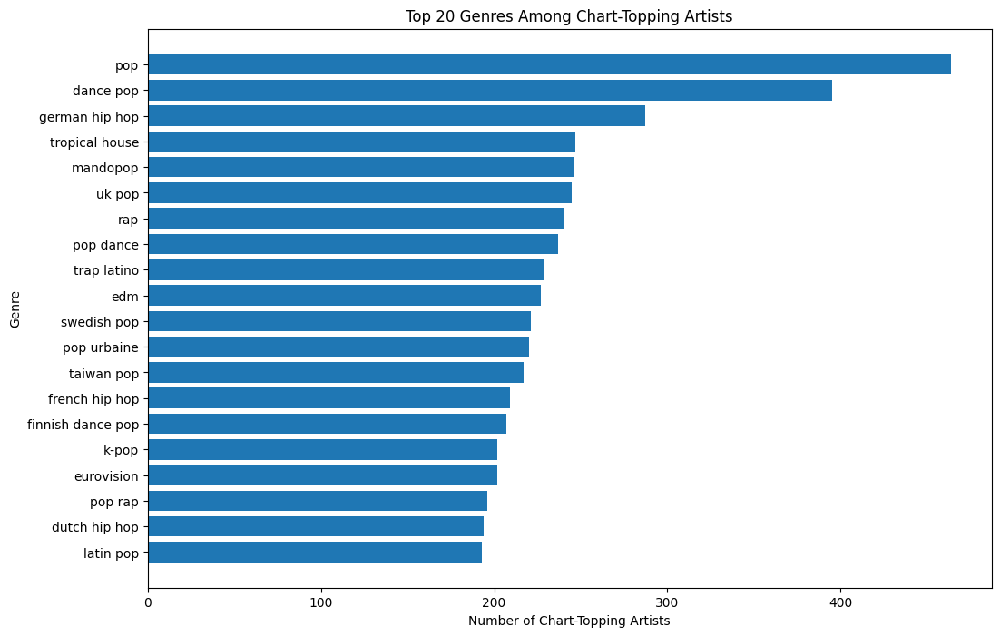

In [60]:
# extract genres for chart-topping artists:
chart_toppers['genres'] = chart_toppers['genres'].fillna('[]').apply(
    lambda x: ast.literal_eval(x) if isinstance(x, str) else x
)
chart_toppers_genres = [genre for genres in chart_toppers['genres'] for genre in genres]

# count occurrences of each genre among chart-topping artists:
chart_toppers_genre_counts = Counter(chart_toppers_genres)

# identify top 20 genres for chart-topping artists:
top_chart_toppers_genres = chart_toppers_genre_counts.most_common(20)

# plot top genres for chart toppers:
chart_genres, chart_counts = zip(*top_chart_toppers_genres)
plt.figure(figsize=(12, 8))
plt.barh(chart_genres, chart_counts)
plt.xlabel("Number of Chart-Topping Artists")
plt.ylabel("Genre")
plt.title("Top 20 Genres Among Chart-Topping Artists")
plt.gca().invert_yaxis()
plt.show()

Definitely more pop, among some other changes.

**Chart toppers in the U.S.**

Again, let's look at the graph properties:

In [22]:
# replace NaN values in 'chart_hits' with empty lists:
nodes_df['chart_hits'] = nodes_df['chart_hits'].fillna('[]')

# Convert 'chart_hits' strings to lists:
nodes_df['chart_hits'] = nodes_df['chart_hits'].apply(
    lambda x: ast.literal_eval(x) if isinstance(x, str) else x
)

# filter nodes for artists w/ chart hits in U.S.:
us_chart_toppers = nodes_df[nodes_df['chart_hits'].apply(lambda x: any('us' in hit for hit in x))]

# remove duplicates in the 'spotify_id' column:
us_chart_toppers = us_chart_toppers.drop_duplicates(subset='spotify_id')

# get set of filtered artist IDs:
filtered_us_artist_ids = set(us_chart_toppers['spotify_id'])

# filter edges to include only those where both endpoints are in the filtered artist list:
filtered_us_edges = edges_df[
    (edges_df['id_0'].isin(filtered_us_artist_ids)) & (edges_df['id_1'].isin(filtered_us_artist_ids))
]

# create subgraph:
us_chart_toppers_G = nx.Graph()
us_chart_toppers_G.add_edges_from(filtered_us_edges.values)
us_chart_toppers_G.add_nodes_from([
    (node_id, attr) for node_id, attr in us_chart_toppers.set_index('spotify_id').to_dict('index').items()
])

# info:
num_nodes = us_chart_toppers_G.number_of_nodes()
num_edges = us_chart_toppers_G.number_of_edges()
print(f"Subgraph created with {num_nodes} nodes and {num_edges} edges.")

# analyze global clustering of subgraph:
us_clustering_coefficient = nx.average_clustering(us_chart_toppers_G)
print(f"Global clustering coefficient for top United States artists: {us_clustering_coefficient}")

# analyze diameter of subgraph:
us_largest_cc_nodes = max(nx.connected_components(us_chart_toppers_G), key=len)
us_largest_cc_subgraph = us_chart_toppers_G.subgraph(us_largest_cc_nodes).copy()
us_diameter = nx.diameter(us_largest_cc_subgraph)
print(f"Diameter for top United States artists: {us_diameter}")

# find density:
us_density = nx.density(us_chart_toppers_G)
print(f"Density for top United States artists: {us_density}\n")

# COMPARABLE RANDOM GRAPHS:
n_us = len(us_chart_toppers_G)
p_us = us_density

# generate & draw 3 samples:
random_us_graphs = generate_graphs(n_us, p_us, 3)

# analyze each:
for random_G in random_us_graphs:
    # check if random graph sample is connected. if not, use largest connected component:
    if not nx.is_connected(random_G):
        largest_cc_nodes = max(nx.connected_components(random_G), key=len)
        random_G = random_G.subgraph(largest_cc_nodes).copy()
    
    # density:
    randomG_density = nx.density(random_G)
    print(f"Comparable random graph density: {randomG_density}\n")

    # diameter calculation using largest connected component:
    randomG_diameter = nx.diameter(random_G)
    print(f"Comparable random graph diameter: {randomG_diameter}")
        
    # calculate global clustering coefficient:
    randomG_clustering = nx.average_clustering(random_G)
    print(f"Comparable random graph global clustering: {randomG_clustering}")

    print('')

# COMPARABLE REGULAR LATTICE:
# count nodes & edges:    
edge_count_us = us_chart_toppers_G.number_of_edges()
print("Edge count:", edge_count_us)

node_count_us = us_chart_toppers_G.number_of_nodes()
print("Node count:", node_count_us)

# decide k:
k_us = (2 * edge_count_us) / len(us_chart_toppers_G)
k_us = int(k_us)
if k_us % 2 != 0:
    k_us += 1  # make k even
print(f"k = {k_us}")

# generate regular lattice:
us_reg_lat = nx.watts_strogatz_graph(n_us, k_us, 0)

# density:
us_lat_density = nx.density(us_reg_lat)
print(f"Comparable regular lattice density: {us_lat_density}\n")

# diameter calculation:
us_reg_lat_diameter = ceil(n_us / k_us)
print(f"Comparable regular lattice diameter: {us_reg_lat_diameter}")
        
# calculate global clustering coefficient:
us_reg_lat_clustering = nx.average_clustering(us_reg_lat)
print(f"Comparable regular lattice global clustering: {us_reg_lat_clustering}")


Subgraph created with 1185 nodes and 8507 edges.
Global clustering coefficient for top United States artists: 0.17188109933012694
Diameter for top United States artists: 8
Density for top United States artists: 0.012126525259436652

Comparable random graph density: 0.012246265252594367

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.013221698141347146

Comparable random graph density: 0.012107994070019387

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.012561836580642928

Comparable random graph density: 0.012232010491504162

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.012816919920165667

Edge count: 8507
Node count: 1185
k = 14
Comparable regular lattice density: 0.011824324324324325

Comparable regular lattice diameter: 85
Comparable regular lattice global clustering: 0.6923076923076923


Genre distribution:

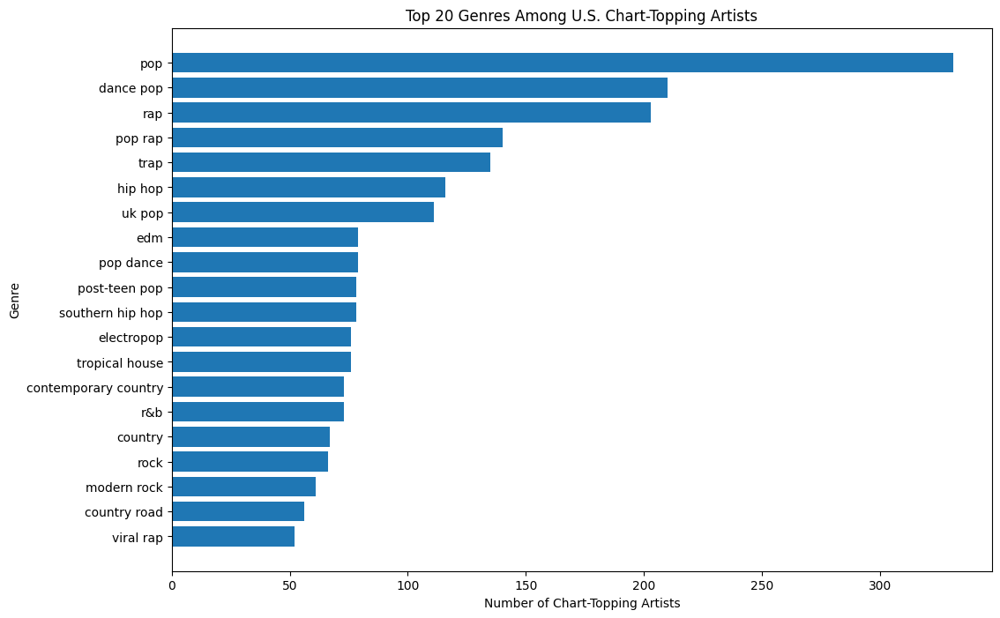

In [62]:
# extract genres for U.S. chart-topping artists:
us_chart_toppers['genres'] = us_chart_toppers['genres'].fillna('[]').apply(
    lambda x: ast.literal_eval(x) if isinstance(x, str) else x
)
us_chart_toppers_genres = [genre for genres in us_chart_toppers['genres'] for genre in genres]

# count occurrences of each genre among chart-topping artists:
us_chart_toppers_genre_counts = Counter(us_chart_toppers_genres)

# identify top 20 genres for chart-topping artists:
us_top_chart_toppers_genres = us_chart_toppers_genre_counts.most_common(20)

# plot top genres for chart toppers:
us_chart_genres, us_chart_counts = zip(*us_top_chart_toppers_genres)
plt.figure(figsize=(12, 8))
plt.barh(us_chart_genres, us_chart_counts)
plt.xlabel("Number of Chart-Topping Artists")
plt.ylabel("Genre")
plt.title("Top 20 Genres Among U.S. Chart-Topping Artists")
plt.gca().invert_yaxis()
plt.show()

Pop and hip hop for the win.

**Chart-toppers in United Kingdom:**

In [28]:
# Replace NaN values in 'chart_hits' with empty lists:
nodes_df['chart_hits'] = nodes_df['chart_hits'].fillna('[]')

# Convert 'chart_hits' strings to lists:
nodes_df['chart_hits'] = nodes_df['chart_hits'].apply(
    lambda x: ast.literal_eval(x) if isinstance(x, str) else x
)

# filter nodes for artists w/ chart hits in the UK:
uk_chart_toppers = nodes_df[nodes_df['chart_hits'].apply(lambda x: any('gb' in hit for hit in x))]

# remove duplicates in the 'spotify_id' column:
uk_chart_toppers = uk_chart_toppers.drop_duplicates(subset='spotify_id')

# get the set of filtered artist IDs:
filtered_uk_artist_ids = set(uk_chart_toppers['spotify_id'])

# filter edges to include only those where both endpoints are in filtered artist list:
filtered_uk_edges = edges_df[
    (edges_df['id_0'].isin(filtered_uk_artist_ids)) & (edges_df['id_1'].isin(filtered_uk_artist_ids))
]

# create subgraph:
uk_chart_toppers_G = nx.Graph()
uk_chart_toppers_G.add_edges_from(filtered_uk_edges.values)
uk_chart_toppers_G.add_nodes_from([
    (node_id, attr) for node_id, attr in uk_chart_toppers.set_index('spotify_id').to_dict('index').items()
])

# info:
num_nodes = uk_chart_toppers_G.number_of_nodes()
num_edges = uk_chart_toppers_G.number_of_edges()
print(f"Subgraph created with {num_nodes} nodes and {num_edges} edges.")

# analyze global clustering of subgraph:
uk_clustering_coefficient = nx.average_clustering(uk_chart_toppers_G)
print(f"Global clustering coefficient for top United Kingdom artists: {uk_clustering_coefficient}")

# analyze diameter of subgraph:
uk_largest_cc_nodes = max(nx.connected_components(uk_chart_toppers_G), key=len)
uk_largest_cc_subgraph = uk_chart_toppers_G.subgraph(uk_largest_cc_nodes).copy()
uk_diameter = nx.diameter(uk_largest_cc_subgraph)
print(f"Diameter for top United Kingdom artists: {uk_diameter}")

# find density:
uk_density = nx.density(uk_chart_toppers_G)
print(f"Density for top United Kingdom artists: {uk_density}\n")

# COMPARABLE RANDOM GRAPHS:
n_uk = len(uk_chart_toppers_G)
p_uk = uk_density

# generate & draw 3 samples:
random_uk_graphs = generate_graphs(n_uk, p_uk, 3)

# analyze each:
for random_G in random_uk_graphs:
    # check if random graph sample is connected. if not, use largest connected component:
    if not nx.is_connected(random_G):
        largest_cc_nodes = max(nx.connected_components(random_G), key=len)
        random_G = random_G.subgraph(largest_cc_nodes).copy()
    
    # density:
    randomG_density = nx.density(random_G)
    print(f"Comparable random graph density: {randomG_density}\n")
    
    # diameter calculation using largest connected component:
    randomG_diameter = nx.diameter(random_G)
    print(f"Comparable random graph diameter: {randomG_diameter}")
        
    # calculate global clustering coefficient:
    randomG_clustering = nx.average_clustering(random_G)
    print(f"Comparable random graph global clustering: {randomG_clustering}")

    print('')

# COMPARABLE REGULAR LATTICE:
# count nodes and edges:    
edge_count_uk = uk_chart_toppers_G.number_of_edges()
print("Edge count:", edge_count_uk)

node_count_uk = uk_chart_toppers_G.number_of_nodes()
print("Node count:", node_count_uk)

# decide k:
k_uk = (2 * edge_count_uk) / len(uk_chart_toppers_G)
k_uk = int(k_uk)
if k_uk % 2 != 0:
    k_uk += 1  # make k even
print(f"k = {k_uk}")

# generate regular lattice:
uk_reg_lat = nx.watts_strogatz_graph(n_uk, k_uk, 0)

# density:
uk_lat_density = nx.density(uk_reg_lat)
print(f"Comparable regular lattice density: {uk_lat_density}\n")

# diameter calculation:
uk_reg_lat_diameter = ceil(n_uk / k_uk)
print(f"Comparable regular lattice diameter: {uk_reg_lat_diameter}")
        
# calculate global clustering coefficient:
uk_reg_lat_clustering = nx.average_clustering(uk_reg_lat)
print(f"Comparable regular lattice global clustering: {uk_reg_lat_clustering}")


Subgraph created with 1282 nodes and 8131 edges.
Global clustering coefficient for top United Kingdom artists: 0.14495415382076884
Diameter for top United Kingdom artists: 8
Density for top United Kingdom artists: 0.009902316467365955

Comparable random graph density: 0.009739124927994778

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.011387866690246641

Comparable random graph density: 0.009824374239606587

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.010525157625521045

Comparable random graph density: 0.009964426680111702

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.010506823941102663

Edge count: 8131
Node count: 1282
k = 12
Comparable regular lattice density: 0.00936768149882904

Comparable regular lattice diameter: 107
Comparable regular lattice global clustering: 0.6818181818181818


**India's Chart-toppers:**

In [11]:
# replace NaN values in 'chart_hits' with empty lists:
nodes_df['chart_hits'] = nodes_df['chart_hits'].fillna('[]')

# Convert 'chart_hits' strings to lists:
nodes_df['chart_hits'] = nodes_df['chart_hits'].apply(
    lambda x: ast.literal_eval(x) if isinstance(x, str) else x
)

# filter nodes for artists w/ chart hits in the India:
in_chart_toppers = nodes_df[nodes_df['chart_hits'].apply(lambda x: any('in' in hit for hit in x))]

# remove duplicates in the 'spotify_id' column:
in_chart_toppers = in_chart_toppers.drop_duplicates(subset='spotify_id')

# get set of filtered artist IDs:
filtered_in_artist_ids = set(in_chart_toppers['spotify_id'])

# filter edges to include only those where both endpoints are in filtered artist list:
filtered_in_edges = edges_df[
    (edges_df['id_0'].isin(filtered_in_artist_ids)) & (edges_df['id_1'].isin(filtered_in_artist_ids))
]

# create subgraph:
in_chart_toppers_G = nx.Graph()
in_chart_toppers_G.add_edges_from(filtered_in_edges.values)
in_chart_toppers_G.add_nodes_from([ 
    (node_id, attr) for node_id, attr in in_chart_toppers.set_index('spotify_id').to_dict('index').items()
])

# info:
num_nodes = in_chart_toppers_G.number_of_nodes()
num_edges = in_chart_toppers_G.number_of_edges()
print(f"Subgraph created with {num_nodes} nodes and {num_edges} edges.")

# analyze global clustering of subgraph:
in_clustering_coefficient = nx.average_clustering(in_chart_toppers_G)
print(f"Global clustering coefficient for top India artists: {in_clustering_coefficient}")

# analyze diameter of subgraph:
in_largest_cc_nodes = max(nx.connected_components(in_chart_toppers_G), key=len)
in_largest_cc_subgraph = in_chart_toppers_G.subgraph(in_largest_cc_nodes).copy()
in_diameter = nx.diameter(in_largest_cc_subgraph)
print(f"Diameter for top India artists: {in_diameter}")

# find density:
in_density = nx.density(in_chart_toppers_G)
print(f"Density for top India artists: {in_density}\n")

# COMPARABLE RANDOM GRAPHS:
n_in = len(in_chart_toppers_G)
p_in = in_density

# generate & draw 3 samples:
random_in_graphs = generate_graphs(n_in, p_in, 3)

# analyze each:
for random_G in random_in_graphs:
    # check if random graph sample is connected. if not, use largest connected component:
    if not nx.is_connected(random_G):
        largest_cc_nodes = max(nx.connected_components(random_G), key=len)
        random_G = random_G.subgraph(largest_cc_nodes).copy()

    # density:
    randomG_density = nx.density(random_G)
    print(f"Comparable random graph density: {randomG_density}\n")
        
    # diameter calculation using largest connected component:
    randomG_diameter = nx.diameter(random_G)
    print(f"Comparable random graph diameter: {randomG_diameter}")
        
    # calculate global clustering coefficient:
    randomG_clustering = nx.average_clustering(random_G)
    print(f"Comparable random graph global clustering: {randomG_clustering}")

    print('')

# COMPARABLE REGULAR LATTICE:
# count nodes & edges:    
edge_count_in = in_chart_toppers_G.number_of_edges()
print("Edge count:", edge_count_in)

node_count_in = in_chart_toppers_G.number_of_nodes()
print("Node count:", node_count_in)

# decide k:
k_in = (2 * edge_count_in) / len(in_chart_toppers_G)
k_in = int(k_in)
if k_in % 2 != 0:
    k_in += 1  # make k even
print(f"k = {k_in}")

# generate regular lattice:
in_reg_lat = nx.watts_strogatz_graph(n_in, k_in, 0)

# density:
in_lat_density = nx.density(in_reg_lat)
print(f"Comparable regular lattice density: {in_lat_density}\n")

# diameter calculation:
in_reg_lat_diameter = ceil(n_in / k_in)
print(f"Comparable regular lattice diameter: {in_reg_lat_diameter}")
        
# calculate global clustering coefficient:
in_reg_lat_clustering = nx.average_clustering(in_reg_lat)
print(f"Comparable regular lattice global clustering: {in_reg_lat_clustering}")

Subgraph created with 617 nodes and 3019 edges.
Global clustering coefficient for top India artists: 0.20269309021695683
Diameter for top India artists: 9
Density for top India artists: 0.01588646361741986

Comparable random graph density: 0.01582331768717506

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.013871792526373015

Comparable random graph density: 0.01626533919888863

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.014808450168300838

Comparable random graph density: 0.016096950051569175

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.018065619641832318

Edge count: 3019
Node count: 617
k = 10
Comparable regular lattice density: 0.016233766233766232

Comparable regular lattice diameter: 62
Comparable regular lattice global clustering: 0.6666666666666666


**Brazil's Chart-toppers:**

In [13]:
# replace NaN values in 'chart_hits' w/ empty lists:
nodes_df['chart_hits'] = nodes_df['chart_hits'].fillna('[]')

# convert 'chart_hits' strings to lists:
nodes_df['chart_hits'] = nodes_df['chart_hits'].apply(
    lambda x: ast.literal_eval(x) if isinstance(x, str) else x
)

# filter nodes for artists w/ chart hits in Brazil:
br_chart_toppers = nodes_df[nodes_df['chart_hits'].apply(lambda x: any('br' in hit for hit in x))]

# remove duplicates in 'spotify_id' column:
br_chart_toppers = br_chart_toppers.drop_duplicates(subset='spotify_id')

# get set of filtered artist IDs:
filtered_br_artist_ids = set(br_chart_toppers['spotify_id'])

# filter edges to include only those where both endpoints are in filtered artist list:
filtered_br_edges = edges_df[
    (edges_df['id_0'].isin(filtered_br_artist_ids)) & (edges_df['id_1'].isin(filtered_br_artist_ids))
]

# create subgraph:
br_chart_toppers_G = nx.Graph()
br_chart_toppers_G.add_edges_from(filtered_br_edges.values)
br_chart_toppers_G.add_nodes_from([
    (node_id, attr) for node_id, attr in br_chart_toppers.set_index('spotify_id').to_dict('index').items()
])

# info:
num_nodes = br_chart_toppers_G.number_of_nodes()
num_edges = br_chart_toppers_G.number_of_edges()
print(f"Subgraph created with {num_nodes} nodes and {num_edges} edges.")

# analyze global clustering of subgraph:
br_clustering_coefficient = nx.average_clustering(br_chart_toppers_G)
print(f"Global clustering coefficient for top Brazil artists: {br_clustering_coefficient}")

# analyze diameter of subgraph:
br_largest_cc_nodes = max(nx.connected_components(br_chart_toppers_G), key=len)
br_largest_cc_subgraph = br_chart_toppers_G.subgraph(br_largest_cc_nodes).copy()
br_diameter = nx.diameter(br_largest_cc_subgraph)
print(f"Diameter for top Brazil artists: {br_diameter}")

# find density:
br_density = nx.density(br_chart_toppers_G)
print(f"Density for top Brazil artists: {br_density}\n")

# COMPARABLE RANDOM GRAPHS:
n_br = len(br_chart_toppers_G)
p_br = br_density

# generate & draw 3 samples:
random_br_graphs = generate_graphs(n_br, p_br, 3)

# analyze each:
for random_G in random_br_graphs:
    # check if random graph sample is connected. if not, use largest connected component:
    if not nx.is_connected(random_G):
        largest_cc_nodes = max(nx.connected_components(random_G), key=len)
        random_G = random_G.subgraph(largest_cc_nodes).copy()

    # density:
    randomG_density = nx.density(random_G)
    print(f"Comparable random graph density: {randomG_density}\n")
        
    # diameter calculation using largest connected component:
    randomG_diameter = nx.diameter(random_G)
    print(f"Comparable random graph diameter: {randomG_diameter}")
        
    # calculate global clustering coefficient:
    randomG_clustering = nx.average_clustering(random_G)
    print(f"Comparable random graph global clustering: {randomG_clustering}")

    print('')

# COMPARABLE REGULAR LATTICE:
# count nodes and edges:    
edge_count_br = br_chart_toppers_G.number_of_edges()
print("Edge count:", edge_count_br)

node_count_br = br_chart_toppers_G.number_of_nodes()
print("Node count:", node_count_br)

# decide k:
k_br = (2 * edge_count_br) / len(br_chart_toppers_G)
k_br = int(k_br)
if k_br % 2 != 0:
    k_br += 1  # make k even
print(f"k = {k_br}")

# generate regular lattice:
br_reg_lat = nx.watts_strogatz_graph(n_br, k_br, 0)

# density:
br_lat_density = nx.density(br_reg_lat)
print(f"Comparable regular lattice density: {br_lat_density}\n")

# diameter calculation:
br_reg_lat_diameter = ceil(n_br / k_br)
print(f"Comparable regular lattice diameter: {br_reg_lat_diameter}")
        
# calculate global clustering coefficient:
br_reg_lat_clustering = nx.average_clustering(br_reg_lat)
print(f"Comparable regular lattice global clustering: {br_reg_lat_clustering}")

Subgraph created with 1081 nodes and 6395 edges.
Global clustering coefficient for top Brazil artists: 0.1881414594671468
Diameter for top Brazil artists: 8
Density for top Brazil artists: 0.01095521978963237

Comparable random graph density: 0.010884983040394697

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.009741020307461868

Comparable random graph density: 0.011152225305786823

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.011195928839002977

Comparable random graph density: 0.011172782403124679

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.011467522057960136

Edge count: 6395
Node count: 1081
k = 12
Comparable regular lattice density: 0.011111111111111112

Comparable regular lattice diameter: 91
Comparable regular lattice global clustering: 0.6818181818181818


**Japan's Chart-toppers:**

In [20]:
# replace NaN values in 'chart_hits' with empty lists:
nodes_df['chart_hits'] = nodes_df['chart_hits'].fillna('[]')

# convert 'chart_hits' strings to lists:
nodes_df['chart_hits'] = nodes_df['chart_hits'].apply(
    lambda x: ast.literal_eval(x) if isinstance(x, str) else x
)

# filter nodes for artists w/ chart hits in Japan:
jp_chart_toppers = nodes_df[nodes_df['chart_hits'].apply(lambda x: any('jp' in hit for hit in x))]

# remove duplicates in the 'spotify_id' column:
jp_chart_toppers = jp_chart_toppers.drop_duplicates(subset='spotify_id')

# get the set of filtered artist IDs:
filtered_jp_artist_ids = set(jp_chart_toppers['spotify_id'])

# filter edges to include only those where both endpoints are in filtered artist list:
filtered_jp_edges = edges_df[
    (edges_df['id_0'].isin(filtered_jp_artist_ids)) & (edges_df['id_1'].isin(filtered_jp_artist_ids))
]

# create subgraph:
jp_chart_toppers_G = nx.Graph()
jp_chart_toppers_G.add_edges_from(filtered_jp_edges.values) 
jp_chart_toppers_G.add_nodes_from([ 
    (node_id, attr) for node_id, attr in jp_chart_toppers.set_index('spotify_id').to_dict('index').items()
])

# info:
num_nodes = jp_chart_toppers_G.number_of_nodes()
num_edges = jp_chart_toppers_G.number_of_edges()
print(f"Subgraph created with {num_nodes} nodes and {num_edges} edges.")

# analyze global clustering of subgraph:
jp_clustering_coefficient = nx.average_clustering(jp_chart_toppers_G)
print(f"Global clustering coefficient for top Japan artists: {jp_clustering_coefficient}")

# analyze diameter of subgraph:
jp_largest_cc_nodes = max(nx.connected_components(jp_chart_toppers_G), key=len)
jp_largest_cc_subgraph = jp_chart_toppers_G.subgraph(jp_largest_cc_nodes).copy()
jp_diameter = nx.diameter(jp_largest_cc_subgraph)
print(f"Diameter for top Japan artists: {jp_diameter}")

# find density:
jp_density = nx.density(jp_chart_toppers_G)
print(f"Density for top Japan artists: {jp_density}\n")

# COMPARABLE RANDOM GRAPHS:
n_jp = len(jp_chart_toppers_G)
p_jp = jp_density

# generate & draw 3 samples:
random_jp_graphs = generate_graphs(n_jp, p_jp, 3)

# analyze each:
for random_G in random_jp_graphs:
    # check if random graph sample is connected. if not, use largest connected component:
    if not nx.is_connected(random_G):
        largest_cc_nodes = max(nx.connected_components(random_G), key=len)
        random_G = random_G.subgraph(largest_cc_nodes).copy()

    # density:
    randomG_density = nx.density(random_G)
    print(f"Comparable random graph density: {randomG_density}\n")
        
    # diameter calculation using largest connected component:
    randomG_diameter = nx.diameter(random_G)
    print(f"Comparable random graph diameter: {randomG_diameter}")
        
    # calculate global clustering coefficient:
    randomG_clustering = nx.average_clustering(random_G)
    print(f"Comparable random graph global clustering: {randomG_clustering}")

    print('')

# COMPARABLE REGULAR LATTICE:
# count nodes & edges:    
edge_count_jp = jp_chart_toppers_G.number_of_edges()
print("Edge count:", edge_count_jp)

node_count_jp = jp_chart_toppers_G.number_of_nodes()
print("Node count:", node_count_jp)

# decide k:
k_jp = (2 * edge_count_jp) / len(jp_chart_toppers_G)
k_jp = int(k_jp)
if k_jp % 2 != 0:
    k_jp += 1  # make k even
print(f"k = {k_jp}")

# generate regular lattice:
jp_reg_lat = nx.watts_strogatz_graph(n_jp, k_jp, 0)

# density:
jp_lat_density = nx.density(jp_reg_lat)
print(f"Comparable regular lattice density: {jp_lat_density}\n")

# diameter calculation:
jp_reg_lat_diameter = ceil(n_jp / k_jp)
print(f"Comparable regular lattice diameter: {jp_reg_lat_diameter}")
        
# calculate global clustering coefficient:
jp_reg_lat_clustering = nx.average_clustering(jp_reg_lat)
print(f"Comparable regular lattice global clustering: {jp_reg_lat_clustering}")

Subgraph created with 677 nodes and 1851 edges.
Global clustering coefficient for top Japan artists: 0.1044339896097198
Diameter for top Japan artists: 12
Density for top Japan artists: 0.008089115747336404

Comparable random graph density: 0.008042292582484204

Comparable random graph diameter: 8
Comparable random graph global clustering: 0.009979082901931566

Comparable random graph density: 0.008044840092317837

Comparable random graph diameter: 8
Comparable random graph global clustering: 0.00588071188071188

Comparable random graph density: 0.008209511286434363

Comparable random graph diameter: 8
Comparable random graph global clustering: 0.007388904652218261

Edge count: 1851
Node count: 677
k = 6
Comparable regular lattice density: 0.008875739644970414

Comparable regular lattice diameter: 113
Comparable regular lattice global clustering: 0.6


**South Africa's Chart-toppers:**

In [19]:
# replace NaN values in 'chart_hits' with empty lists:
nodes_df['chart_hits'] = nodes_df['chart_hits'].fillna('[]')

# convert 'chart_hits' strings to lists:
nodes_df['chart_hits'] = nodes_df['chart_hits'].apply(
    lambda x: ast.literal_eval(x) if isinstance(x, str) else x
)

# filter nodes for artists w/ chart hits in Nigeria:
za_chart_toppers = nodes_df[nodes_df['chart_hits'].apply(lambda x: any('za' in hit for hit in x))]

# remove duplicates in the 'spotify_id' column:
za_chart_toppers = za_chart_toppers.drop_duplicates(subset='spotify_id')

# get the set of filtered artist IDs:
filtered_za_artist_ids = set(za_chart_toppers['spotify_id'])

# filter edges to include only those where both endpoints are in filtered artist list:
filtered_za_edges = edges_df[
    (edges_df['id_0'].isin(filtered_za_artist_ids)) & (edges_df['id_1'].isin(filtered_za_artist_ids))
]

# create subgraph:
za_chart_toppers_G = nx.Graph()
za_chart_toppers_G.add_edges_from(filtered_za_edges.values) 
za_chart_toppers_G.add_nodes_from([ 
    (node_id, attr) for node_id, attr in za_chart_toppers.set_index('spotify_id').to_dict('index').items()
])

# info:
num_nodes = za_chart_toppers_G.number_of_nodes()
num_edges = za_chart_toppers_G.number_of_edges()
print(f"Subgraph created with {num_nodes} nodes and {num_edges} edges.")

# analyze global clustering of subgraph:
za_clustering_coefficient = nx.average_clustering(za_chart_toppers_G)
print(f"Global clustering coefficient for top South Africa artists: {za_clustering_coefficient}")

# analyze diameter of subgraph:
za_largest_cc_nodes = max(nx.connected_components(za_chart_toppers_G), key=len)
za_largest_cc_subgraph = za_chart_toppers_G.subgraph(za_largest_cc_nodes).copy()
za_diameter = nx.diameter(za_largest_cc_subgraph)
print(f"Diameter for top South Africa artists: {za_diameter}")

# find density:
za_density = nx.density(za_chart_toppers_G)
print(f"Density for top South Africa artists: {za_density}\n")

# COMPARABLE RANDOM GRAPHS:
n_za = len(za_chart_toppers_G)
p_za = za_density

# generate & draw 3 samples:
random_za_graphs = generate_graphs(n_za, p_za, 3)

# analyze each:
for random_G in random_za_graphs:
    # check if random graph sample is connected. if not, use largest connected component:
    if not nx.is_connected(random_G):
        largest_cc_nodes = max(nx.connected_components(random_G), key=len)
        random_G = random_G.subgraph(largest_cc_nodes).copy()
        
    # density:
    randomG_density = nx.density(random_G)
    print(f"Comparable random graph density: {randomG_density}\n")

    # diameter calculation using largest connected component:
    randomG_diameter = nx.diameter(random_G)
    print(f"Comparable random graph diameter: {randomG_diameter}")
        
    # calculate global clustering coefficient:
    randomG_clustering = nx.average_clustering(random_G)
    print(f"Comparable random graph global clustering: {randomG_clustering}")

    print('')

# COMPARABLE REGULAR LATTICE:
# count nodes and edges:    
edge_count_za = za_chart_toppers_G.number_of_edges()
print("Edge count:", edge_count_za)

node_count_za = za_chart_toppers_G.number_of_nodes()
print("Node count:", node_count_za)

# decide k:
k_za = (2 * edge_count_za) / len(za_chart_toppers_G)
k_za = int(k_za)
if k_za % 2 != 0:
    k_za += 1  # make k even
print(f"k = {k_za}")

# generate regular lattice:
za_reg_lat = nx.watts_strogatz_graph(n_za, k_za, 0)

# density:
za_lat_density = nx.density(za_reg_lat)
print(f"Comparable regular lattice density: {za_lat_density}\n")

# diameter calculation:
za_reg_lat_diameter = ceil(n_za / k_za)
print(f"Comparable regular lattice diameter: {za_reg_lat_diameter}")
        
# calculate global clustering coefficient:
za_reg_lat_clustering = nx.average_clustering(za_reg_lat)
print(f"Comparable regular lattice global clustering: {za_reg_lat_clustering}")

Subgraph created with 746 nodes and 4360 edges.
Global clustering coefficient for top South Africa artists: 0.2056800196859037
Diameter for top South Africa artists: 13
Density for top South Africa artists: 0.015689943681738847

Comparable random graph density: 0.015603577019270561

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.015004758068279512

Comparable random graph density: 0.016168558936250608

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.01766743043906356

Comparable random graph density: 0.015294096478759199

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.013477433579917613

Edge count: 4360
Node count: 746
k = 12
Comparable regular lattice density: 0.016107382550335572

Comparable regular lattice diameter: 63
Comparable regular lattice global clustering: 0.6818181818181818


**More Genre Analysis**

We can actually make a network for them:

           Genre                            Top Co-Occurring Genres  \
0      dance pop  [pop, post-teen pop, uk pop, pop dance, tropic...   
1            rap  [hip hop, trap, southern hip hop, pop rap, gan...   
2            pop  [dance pop, uk pop, post-teen pop, electropop,...   
3     electropop   [pop, uk pop, indie poptimism, dance pop, alt z]   
4        hip hop  [rap, gangster rap, hardcore hip hop, pop rap,...   
5            edm  [electro house, pop dance, tropical house, pop...   
6           rock  [modern rock, classic rock, album rock, mellow...   
7  electro house  [edm, pop dance, pop edm, progressive electro ...   
8    electronica  [alternative dance, new rave, microhouse, trip...   
9        pop rap  [rap, southern hip hop, trap, hip hop, gangste...   

        Co-Occurrence Counts  
0  [236, 129, 124, 121, 116]  
1  [247, 208, 178, 177, 174]  
2   [236, 160, 126, 118, 75]  
3      [118, 92, 89, 81, 70]  
4  [247, 165, 124, 121, 120]  
5  [302, 289, 155, 132, 102]  
6

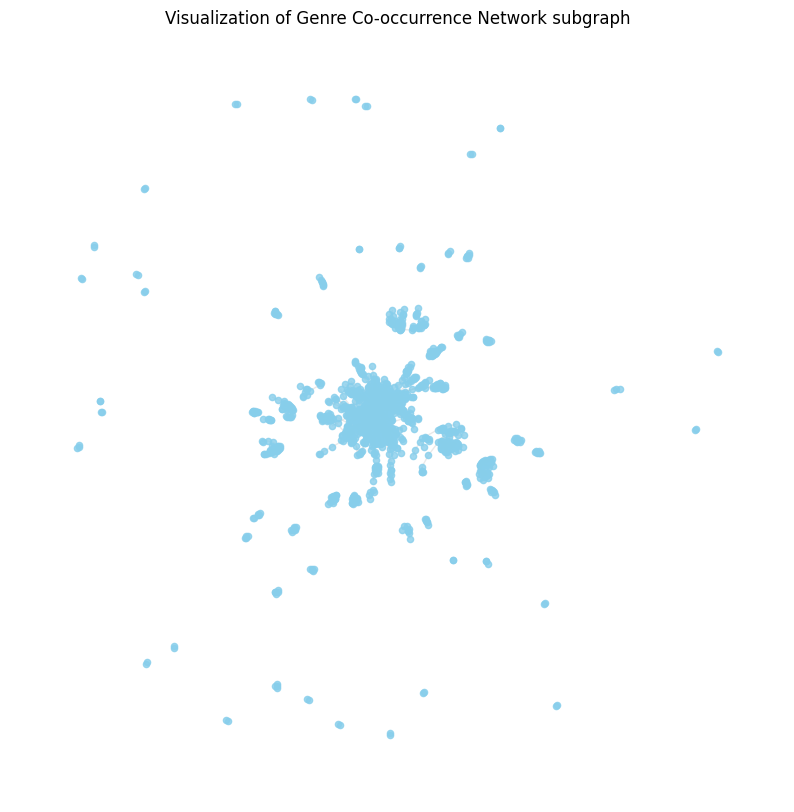

In [21]:
nodes_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/nodes.csv'
nodes_df = pd.read_csv(nodes_path)

# replace NaN values in the 'genres' column & convert strings to lists:
nodes_df['genres'] = nodes_df['genres'].fillna('[]').apply(
    lambda x: ast.literal_eval(x) if isinstance(x, str) else x
)

# count genre co-occurrences:
co_occurrences = Counter()
for genres in nodes_df['genres']:
    # create all pairs of genres:
    for genre_pair in combinations(sorted(genres), 2):
        co_occurrences[genre_pair] += 1

# build co-occurrence network:
genre_co_occurrence_G = nx.Graph()
for (genre1, genre2), count in co_occurrences.items():
    if count > 5:  # (only include significant co-occurrences)
        genre_co_occurrence_G.add_edge(genre1, genre2, weight=count)

# identify top genres by degree (number of connections):
top_genres_by_degree = sorted(
    genre_co_occurrence_G.degree, key=lambda x: x[1], reverse=True
)[:10]  # (top 10 genres by degree)

#  for each top genre, find its most co-occurring genres:
top_genre_cooccurrences = []
for genre, _ in top_genres_by_degree:
    neighbors = sorted(
        genre_co_occurrence_G[genre].items(),
        key=lambda x: x[1]['weight'],  # Sort by co-occurrence weight
        reverse=True
    )[:5]  # top 5 neighbors for each genre:
    top_genre_cooccurrences.append({
        "Genre": genre,
        "Top Co-Occurring Genres": [neighbor[0] for neighbor in neighbors],
        "Co-Occurrence Counts": [neighbor[1]['weight'] for neighbor in neighbors]
    })

# convert results to a df for display:
top_genre_cooccurrences_df = pd.DataFrame(top_genre_cooccurrences)

print(top_genre_cooccurrences_df)

visualize_genre_subgraph(genre_co_occurrence_G, 'Genre Co-occurrence Network')

Attempts to visualize whole graph:

(Note that to run these successfully, you need the Cytoscape application. Have it open before running)

In [ ]:
import py4cytoscape as p4c

# load data:
nodes_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/cleaned_nodes.csv'
edges_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/edges.csv'
nodes = pd.read_csv(nodes_path)
edges = pd.read_csv(edges_path)

# rename columns:
nodes.rename(columns={'Id': 'id'}, inplace=True)
edges.rename(columns={'id_0': 'source', 'id_1': 'target'}, inplace=True)

# ensure all IDs are strings:
nodes['id'] = nodes['id'].astype(str)
edges['source'] = edges['source'].astype(str)
edges['target'] = edges['target'].astype(str)

# check for missing nodes:
missing_source_nodes = edges[~edges['source'].isin(nodes['id'])]
missing_target_nodes = edges[~edges['target'].isin(nodes['id'])]

print("Missing source nodes:\n", missing_source_nodes)
print("Missing target nodes:\n", missing_target_nodes)

# remove invalid edges:
valid_edges = edges[
    edges['source'].isin(nodes['id']) & edges['target'].isin(nodes['id'])
]

# create network:
p4c.create_network_from_data_frames(
    nodes=nodes,
    edges=valid_edges,
    title='Artist Network',
    collection='My Network Collection'
)

# apply layout:
p4c.layout_network('force-directed')

In [413]:
# load data:
nodes_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/cleaned_nodes.csv'
edges_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/edges.csv'
nodes = pd.read_csv(nodes_path)
edges = pd.read_csv(edges_path)

# rename columns:
nodes.rename(columns={'Id': 'id'}, inplace=True)
edges.rename(columns={'id_0': 'source', 'id_1': 'target'}, inplace=True)

# ensure all IDs are strings:
nodes['id'] = nodes['id'].astype(str)
edges['source'] = edges['source'].astype(str)
edges['target'] = edges['target'].astype(str)

# create graph:
G = nx.Graph()
G.add_nodes_from(nodes['id'])
G.add_edges_from(edges[['source', 'target']].values)
print("graph created successfully")
print(f"Number of nodes: {nx.number_of_nodes(G)}")
print(f"Number of edges: {nx.number_of_edges(G)}")

# extract giant component:
giant_component = max(nx.connected_components(G), key=len)
giant_subgraph = G.subgraph(giant_component)
print(f"\nNumber of nodes in subgraph: {nx.number_of_nodes(giant_subgraph)}")
print(f"Number of edges in subgraph: {nx.number_of_edges(giant_subgraph)}")

# prepare nodes & edges for Cytoscape:
giant_nodes = pd.DataFrame(list(giant_subgraph.nodes), columns=['id'])
giant_edges = pd.DataFrame(
    list(giant_subgraph.edges), columns=['source', 'target']
)

# create network:
p4c.create_network_from_data_frames(
    nodes=giant_nodes,
    edges=giant_edges,
    title='Artist Network - Giant Component',
    collection='My Network Collection'
)

# apply layout:
p4c.layout_network('force-directed')

graph created successfully
Number of nodes: 156326
Number of edges: 300386

Number of nodes in subgraph: 148386
Number of edges in subgraph: 296770
Applying default style...


In commands_post(): No network views selected.
In commands_post(): No network views selected.


Applying preferred layout


{}

In [ ]:
# top 1%:

import py4cytoscape as p4c

# load data:
nodes_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/cleaned_nodes.csv'
edges_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/edges.csv'
nodes = pd.read_csv(nodes_path)
edges = pd.read_csv(edges_path)

# rename columns:
nodes.rename(columns={'Id': 'id'}, inplace=True)
edges.rename(columns={'id_0': 'source', 'id_1': 'target'}, inplace=True)

# ensure all IDs are strings:
nodes['id'] = nodes['id'].astype(str)
edges['source'] = edges['source'].astype(str)
edges['target'] = edges['target'].astype(str)

# create graph:
G = nx.Graph()
G.add_nodes_from(nodes['id'])
G.add_edges_from(valid_edges[['source', 'target']].values)

# calculate node degrees:
degree_dict = dict(G.degree())
nodes['degree'] = nodes['id'].map(degree_dict)

# determine threshold for the top 1% of nodes by degree:
threshold = nodes['degree'].quantile(0.99)

# filter for top 1% of nodes by degree:
top_nodes = nodes[nodes['degree'] >= threshold]

# filter edges to include only those connecting the top 1% nodes:
top_edges = valid_edges[
    valid_edges['source'].isin(top_nodes['id']) & valid_edges['target'].isin(top_nodes['id'])
]

# create network:
p4c.create_network_from_data_frames(
    nodes=top_nodes,
    edges=top_edges,
    title='Top 1% Artists by Edge Count',
    collection='My Network Collection'
)

# apply layout:
p4c.layout_network('force-directed')


In [ ]:
# top 0.1%:

import py4cytoscape as p4c

# load data:
nodes_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/cleaned_nodes.csv'
edges_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/edges.csv'
nodes = pd.read_csv(nodes_path)
edges = pd.read_csv(edges_path)

# rename columns:
nodes.rename(columns={'Id': 'id'}, inplace=True)
edges.rename(columns={'id_0': 'source', 'id_1': 'target'}, inplace=True)

# ensure all IDs are strings:
nodes['id'] = nodes['id'].astype(str)
edges['source'] = edges['source'].astype(str)
edges['target'] = edges['target'].astype(str)

# create graph:
G = nx.Graph()
G.add_nodes_from(nodes['id'])
G.add_edges_from(valid_edges[['source', 'target']].values)

# calculate node degrees:
degree_dict = dict(G.degree())
nodes['degree'] = nodes['id'].map(degree_dict)

# determine threshold for the top 0.1% of nodes by degree:
threshold = nodes['degree'].quantile(0.999)

# filter for top 0.1% of nodes by degree:
top_nodes = nodes[nodes['degree'] >= threshold]

# filter edges to include only those connecting the top 0.1% nodes:
top_edges = valid_edges[
    valid_edges['source'].isin(top_nodes['id']) & valid_edges['target'].isin(top_nodes['id'])
]

# create network:
p4c.create_network_from_data_frames(
    nodes=top_nodes,
    edges=top_edges,
    title='Top 0.1% Artists by Edge Count',
    collection='My Network Collection'
)

# apply layout:
p4c.layout_network('force-directed')


Let's look at *Steve Aoki* (the most connected artist in the network):

In [107]:
import py4cytoscape as p4c
import pandas as pd
import networkx as nx
import math

# load data:
nodes_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/cleaned_nodes.csv'
edges_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/edges.csv'
nodes = pd.read_csv(nodes_path)
edges = pd.read_csv(edges_path)

# rename columns:
nodes.rename(columns={'Id': 'id'}, inplace=True)
edges.rename(columns={'id_0': 'source', 'id_1': 'target'}, inplace=True)

# ensure all IDs are strings:
nodes['id'] = nodes['id'].astype(str)
edges['source'] = edges['source'].astype(str)
edges['target'] = edges['target'].astype(str)

# create graph:
G = nx.Graph()
G.add_nodes_from(nodes['id'])
G.add_edges_from(edges[['source', 'target']].values)

# find Steve Aoki & his connections:
steve_aoki_id = nodes[nodes['name'] == "Steve Aoki"]['id'].values[0]
# direct neighbors of Steve Aoki:
neighbors = list(G.neighbors(steve_aoki_id))

# subgraph containing Aoki & his neighbors:
steve_aoki_subgraph = G.subgraph([steve_aoki_id] + neighbors)
print(f"Steve Aoki has {nx.number_of_nodes(steve_aoki_subgraph) - 1} connections.")

# prep nodes & edges for Cytoscape:
steve_aoki_nodes = pd.DataFrame(list(steve_aoki_subgraph.nodes), columns=['id'])
steve_aoki_edges = pd.DataFrame(
    list(steve_aoki_subgraph.edges), columns=['source', 'target']
)

steve_aoki_nodes = pd.merge(steve_aoki_nodes, nodes, on='id', how='left')

# create network:
p4c.create_network_from_data_frames(
    nodes=steve_aoki_nodes,
    edges=steve_aoki_edges,
    title='Steve Aoki and Connections',
    collection='My Network Collection'
)

# apply force-directed layout to spread out network:
p4c.layout_network('force-directed')

# spread out neighbors around Steve Aoki in circular layout:
angle_step = 360 / len(neighbors)
radius = 300  # (distance from Aoki)


Steve Aoki has 498 connections.
Applying default style...
Applying preferred layout


In [ ]:
import py4cytoscape as p4c
import pandas as pd
import networkx as nx
import math

# Connect to Cytoscape
try:
    cytoscape_status = p4c.cytoscape_ping()
    print("Cytoscape is running and connected:", cytoscape_status)
except Exception as e:
    print("Error connecting to Cytoscape:", e)

# Function to generate a color gradient
def degree_to_color(degree, max_degree):
    if degree == max_degree:  # Highly connected (yellow)
        return '#FFFF00'
    else:
        # Gradient from yellow to blue
        normalized = degree / max_degree
        yellow_component = int(255 * (1 - normalized))
        blue_component = int(255 * normalized)
        return f'#FF{yellow_component:02X}{blue_component:02X}'

# Load data
nodes_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/cleaned_nodes.csv'
edges_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/edges.csv'
nodes = pd.read_csv(nodes_path)
edges = pd.read_csv(edges_path)

# Prepare graph
nodes.rename(columns={'Id': 'id'}, inplace=True)
edges.rename(columns={'id_0': 'source', 'id_1': 'target'}, inplace=True)
nodes['id'] = nodes['id'].astype(str)
edges['source'] = edges['source'].astype(str)
edges['target'] = edges['target'].astype(str)

G = nx.Graph()
G.add_nodes_from(nodes['id'])
G.add_edges_from(edges[['source', 'target']].values)

# Find Steve Aoki's ID
steve_aoki_id = nodes[nodes['name'] == "Steve Aoki"]['id'].values[0]
neighbors = list(G.neighbors(steve_aoki_id))

# Subgraph
steve_aoki_subgraph = G.subgraph([steve_aoki_id] + neighbors)
print(f"Steve Aoki has {len(neighbors)} connections.")

# Prepare nodes and edges for Cytoscape
steve_aoki_nodes = pd.DataFrame(list(steve_aoki_subgraph.nodes), columns=['id'])
steve_aoki_edges = pd.DataFrame(list(steve_aoki_subgraph.edges), columns=['source', 'target'])
steve_aoki_nodes = pd.merge(steve_aoki_nodes, nodes, on='id', how='left')

# Add shared name column for styling purposes but retain id column
steve_aoki_nodes['shared name'] = steve_aoki_nodes['id']

# Calculate degrees
node_degrees = dict(G.degree(steve_aoki_subgraph.nodes))
max_degree = max(node_degrees.values())

# Assign colors:
# - Steve Aoki -> red
# - Highly connected -> yellow
# - Less connected -> gradient from yellow to blue
steve_aoki_nodes['color'] = steve_aoki_nodes['id'].map(
    lambda x: '#FF0000' if x == steve_aoki_id else degree_to_color(node_degrees[x], max_degree)
)

# Set node sizes: larger for Steve Aoki, smaller for others
steve_aoki_nodes['size'] = steve_aoki_nodes['id'].apply(lambda x: 100 if x == steve_aoki_id else 50)

# Create network
network_suid = p4c.create_network_from_data_frames(
    nodes=steve_aoki_nodes,
    edges=steve_aoki_edges,
    title='Steve Aoki and Connections',
    collection='My Network Collection'
)
print(f"Network SUID: {network_suid}")

# Apply layout
p4c.layout_network('force-directed', network=network_suid)

You are connected to Cytoscape!
Cytoscape is running and connected: You are connected to Cytoscape!
Steve Aoki has 498 connections.
Applying default style...
Applying preferred layout
Network SUID: 123334


{}

This would not load using PyVis:

In [396]:
from pyvis.network import Network

edges_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/edges.csv' 
nodes_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/cleaned_nodes.csv'
edges_df = pd.read_csv(edges_path)
nodes_df = pd.read_csv(nodes_path)

G = nx.from_pandas_edgelist(edges_df, source='id_0', target='id_1')

node_attributes = nodes_df.set_index('Id').to_dict('index')
nx.set_node_attributes(G, node_attributes)

# calculate degree for each node:
degree_dict = dict(G.degree())
nx.set_node_attributes(G, degree_dict, 'degree')

# determine top 1% threshold:
threshold = sorted(degree_dict.values(), reverse=True)[int(len(degree_dict) * 0.01)]

# initialize Pyvis Network:
net = Network(notebook=True, height="1000px", width="100%", bgcolor="#222222", font_color="white")

# add nodes and edges to the Pyvis graph:
for node, attrs in G.nodes(data=True):
    name = attrs.get('name', node)  # Use name if available, fallback to ID
    degree = attrs['degree']
    followers = attrs.get('followers', 0)
    
    if degree >= threshold:
        # top 1%: bigger, red, & labeled
        net.add_node(node, label=name, color="red", size=degree * 2)
    else:
        # other nodes: blue, no label
        net.add_node(node, color="blue", size=degree)

# add edges:
for source, target in G.edges():
    net.add_edge(source, target)

# save and display the graph:
net.show("artist_network.html")

artist_network.html
